<a href="https://colab.research.google.com/github/Harshverdhan19/GenAI/blob/main/GenAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
#visualization function
def show (tensor, ch=1, size=(28,28), num=16):
  data=tensor.detach().cpu().view(-1,ch,*size)
  grid=make_grid(data[:num],nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()

In [ ]:
#setup of the main parameters and hyperparameters
epochs = 300
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=bs)


100%|██████████| 9912422/9912422 [00:00<00:00, 354466337.95it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 30118272.95it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 201971012.11it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 19969107.72it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
# declare our models

def genBlock(inp, out):
    return nn.Sequential(
        nn.Linear(inp, out),
        nn.BatchNorm1d(out),
        nn.ReLU(inplace=True)
    )

class Generator(nn.Module):
    def __init__(self, z_dim=64, i_dim=784, h_dim=128):
        super().__init__()
        self.gen = nn.Sequential(
            genBlock(z_dim, h_dim),
            genBlock(h_dim, h_dim*2),
            genBlock(h_dim*2, h_dim*4),
            genBlock(h_dim*4, h_dim*8),
            nn.Linear(h_dim*8, i_dim),
            nn.Sigmoid(),
        )

    def forward(self, noise):
        return self.gen(noise)


def gen_noise(number, z_dim):
      return torch.randn(number, z_dim).to(device)



def discBlock(inp, out):
       return nn.Sequential(
          nn.Linear(inp, out),
          nn.LeakyReLU(0.2)
        )


class Discriminator(nn.Module):
    def __init__(self, i_dim=784, h_dim=256):
        super().__init__()
        self.disc = nn.Sequential(
            discBlock(i_dim, h_dim*4),
            discBlock(h_dim*4, h_dim*2),
            discBlock(h_dim*2, h_dim),
            nn.Linear(h_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([5, 2, 8, 1, 3, 8, 5, 9, 5, 5])


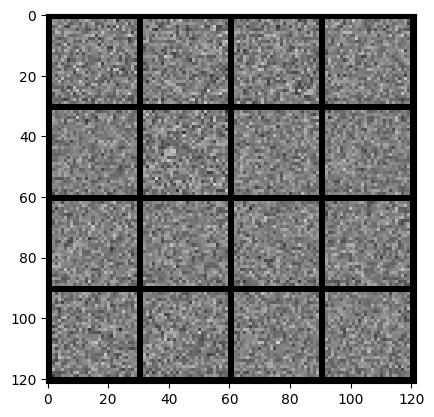

In [ ]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
# calculating the loss

# generator loss

def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)
  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)


  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss)/2

  return disc_loss

In [ ]:
exit


  0%|          | 0/469 [00:00<?, ?it/s]

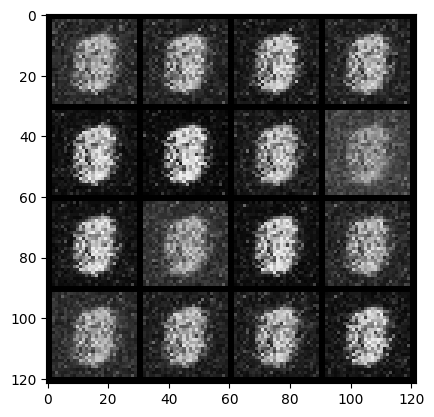

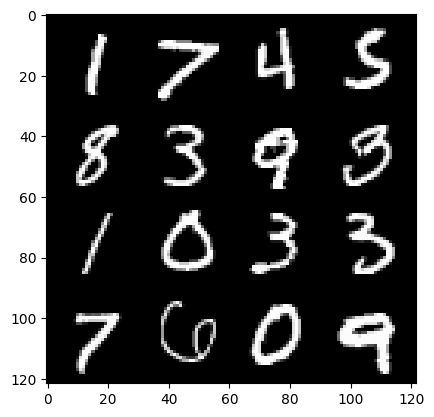

0: step 300 / Gen loss: 1.9241939632097866 / Disc loss: 0.3385854179163775


  0%|          | 0/469 [00:00<?, ?it/s]

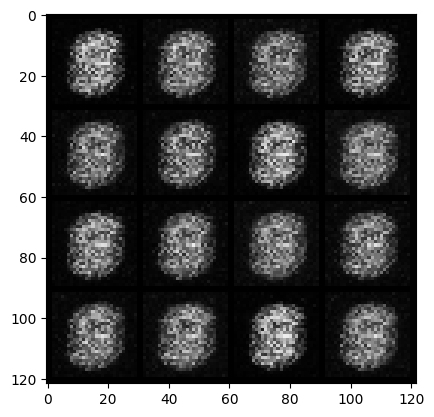

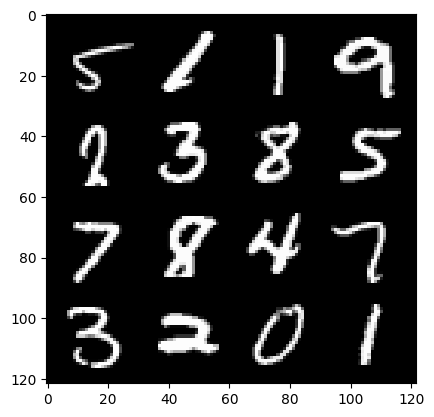

1: step 600 / Gen loss: 3.432939893404643 / Disc loss: 0.12063582447667916


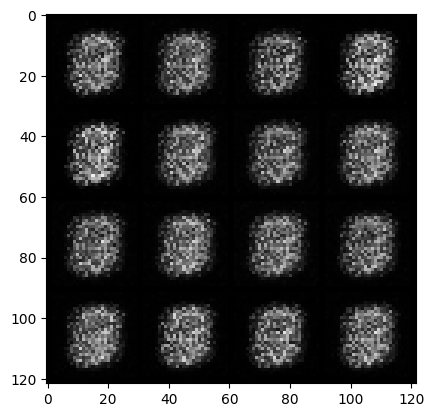

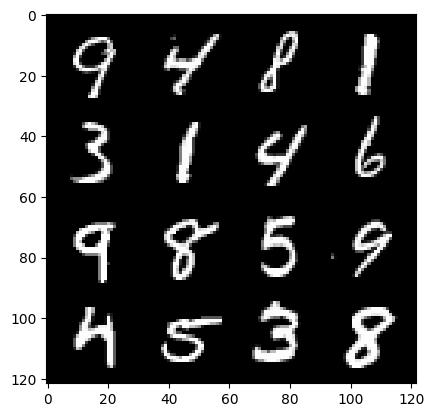

1: step 900 / Gen loss: 3.338301095962525 / Disc loss: 0.0599472306668759


  0%|          | 0/469 [00:00<?, ?it/s]

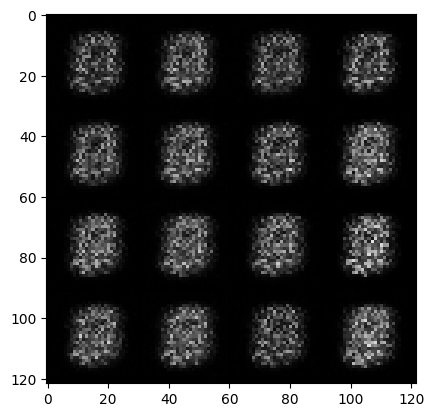

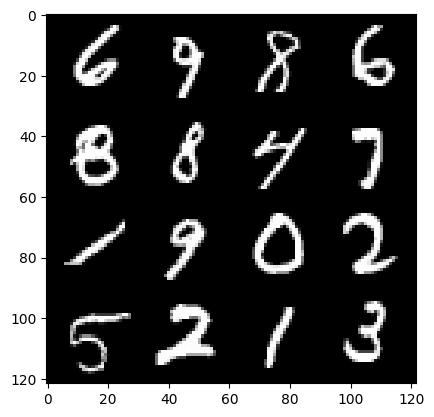

2: step 1200 / Gen loss: 3.390173757870993 / Disc loss: 0.040707633613298336


  0%|          | 0/469 [00:00<?, ?it/s]

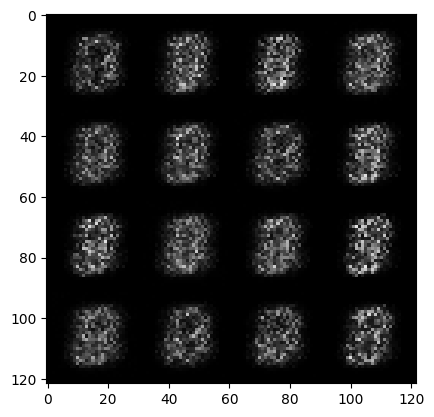

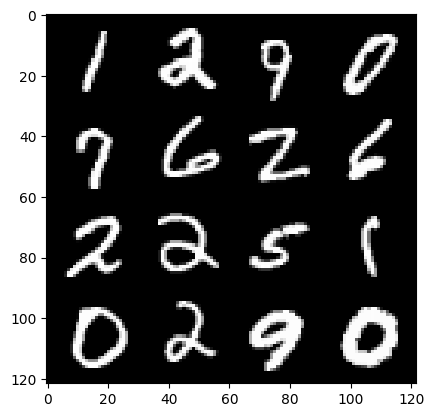

3: step 1500 / Gen loss: 3.4125866007804864 / Disc loss: 0.0407974073352913


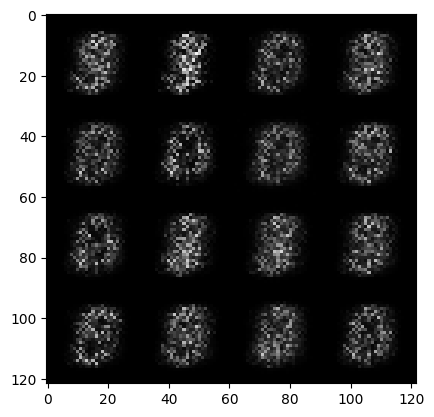

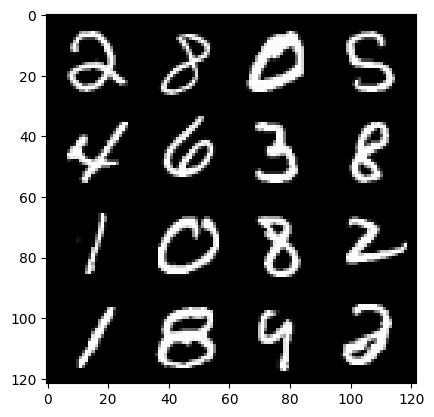

3: step 1800 / Gen loss: 3.42381739616394 / Disc loss: 0.04382228553916018


  0%|          | 0/469 [00:00<?, ?it/s]

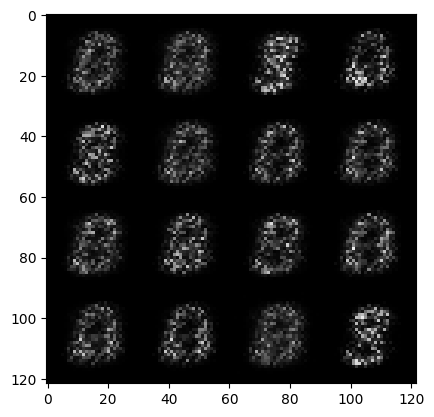

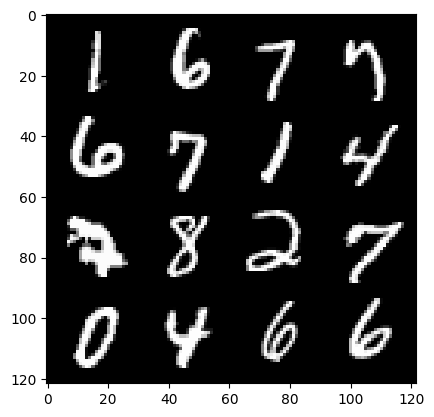

4: step 2100 / Gen loss: 3.7576927924156185 / Disc loss: 0.03807534197345374


  0%|          | 0/469 [00:00<?, ?it/s]

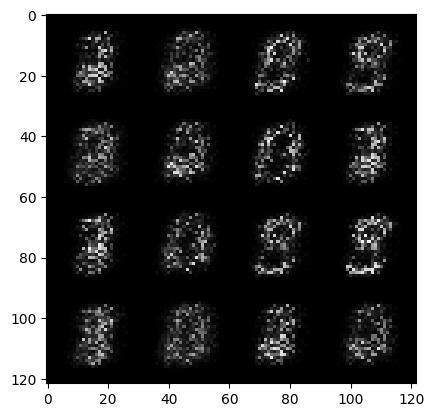

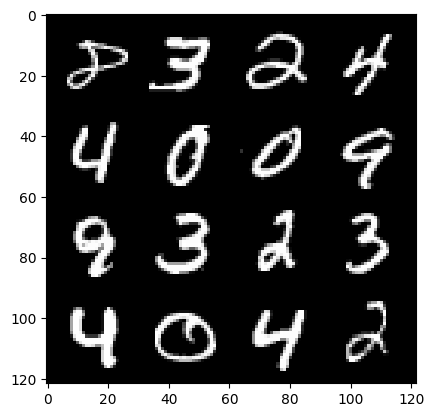

5: step 2400 / Gen loss: 4.163177441755932 / Disc loss: 0.0312725512155642


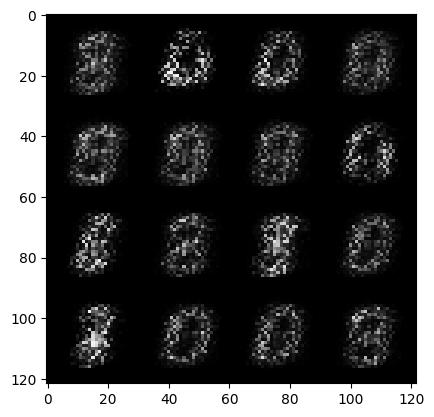

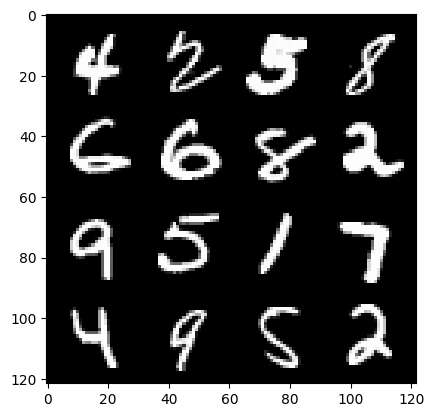

5: step 2700 / Gen loss: 4.594389742215474 / Disc loss: 0.025147559229905407


  0%|          | 0/469 [00:00<?, ?it/s]

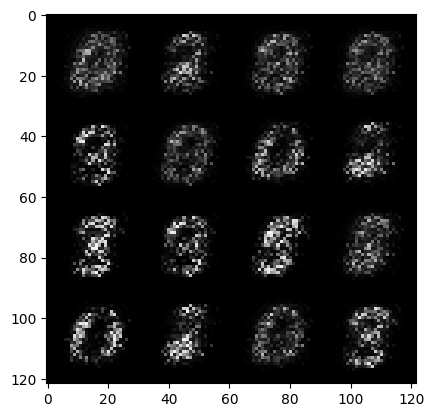

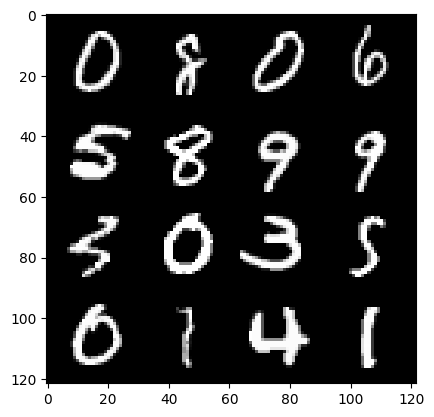

6: step 3000 / Gen loss: 4.888566586176556 / Disc loss: 0.021869012458870803


  0%|          | 0/469 [00:00<?, ?it/s]

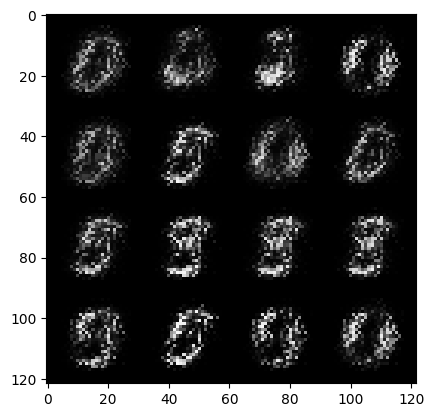

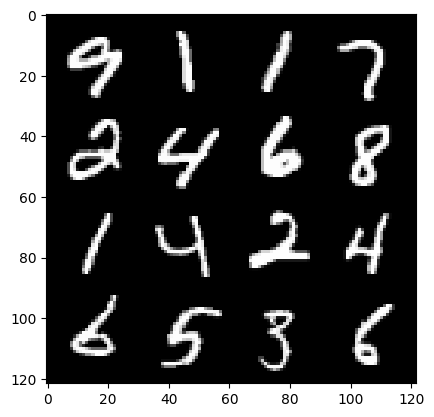

7: step 3300 / Gen loss: 5.165977333386741 / Disc loss: 0.019641468745345857


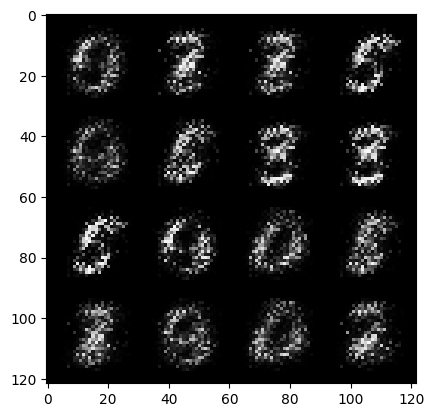

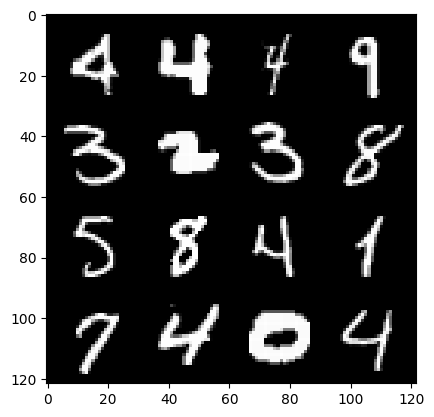

7: step 3600 / Gen loss: 5.33146062692006 / Disc loss: 0.01861548538630207


  0%|          | 0/469 [00:00<?, ?it/s]

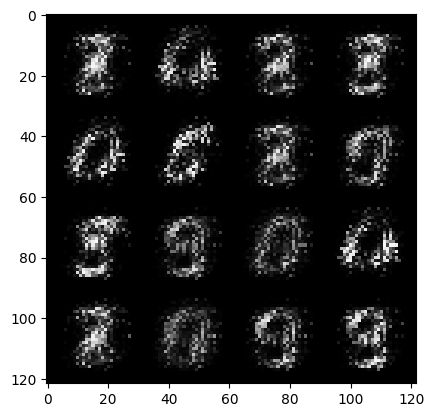

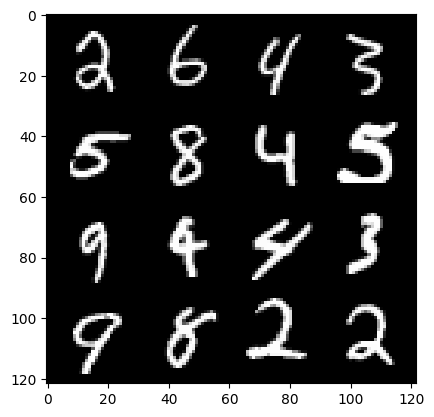

8: step 3900 / Gen loss: 5.7081973950068114 / Disc loss: 0.015865802176607158


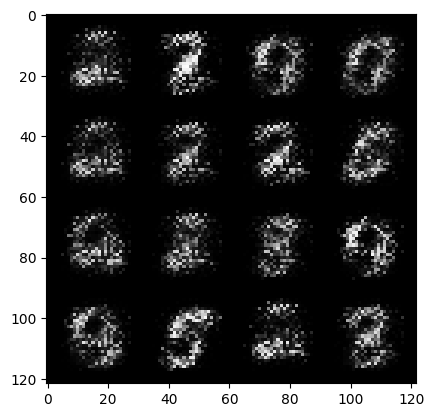

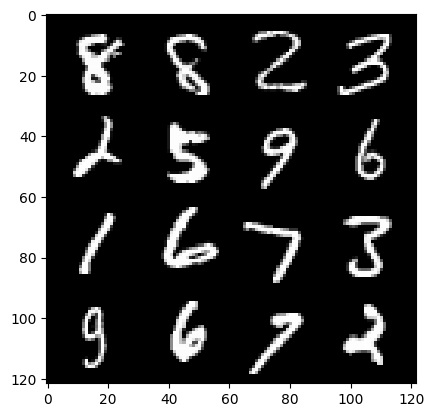

8: step 4200 / Gen loss: 5.933298160235084 / Disc loss: 0.013111671086711189


  0%|          | 0/469 [00:00<?, ?it/s]

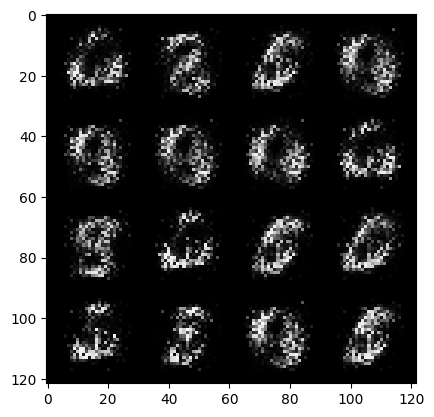

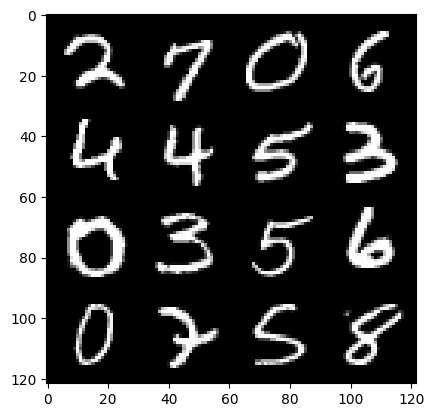

9: step 4500 / Gen loss: 5.845741163889567 / Disc loss: 0.012596340624925996


  0%|          | 0/469 [00:00<?, ?it/s]

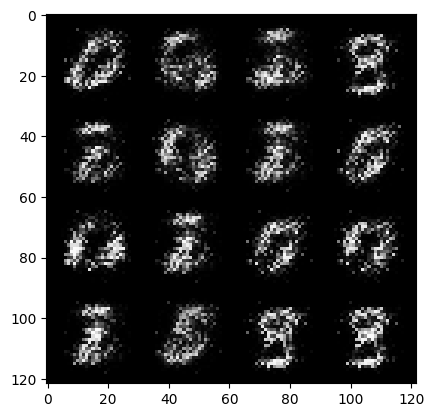

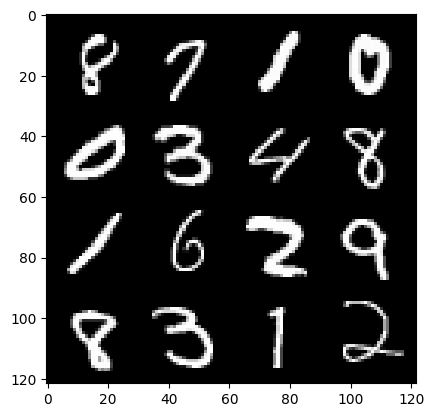

10: step 4800 / Gen loss: 6.151971511840823 / Disc loss: 0.011938472036272288


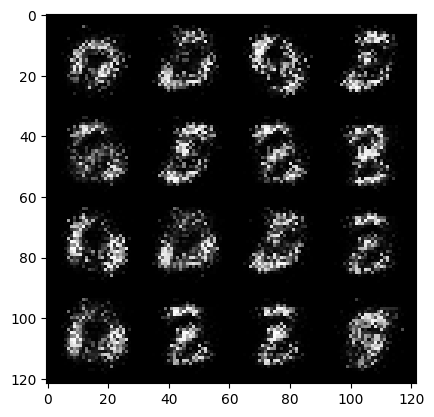

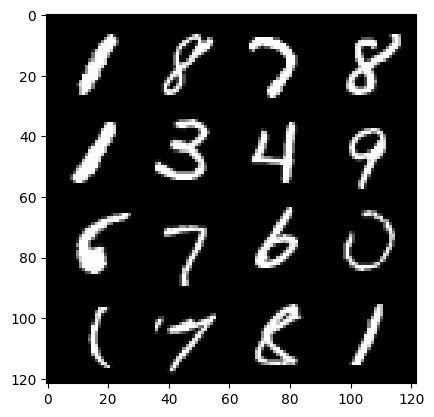

10: step 5100 / Gen loss: 6.49627369244893 / Disc loss: 0.013925706393395855


  0%|          | 0/469 [00:00<?, ?it/s]

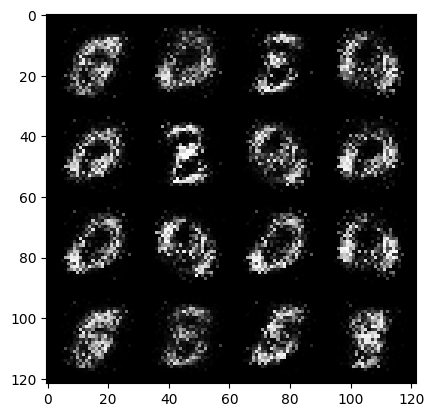

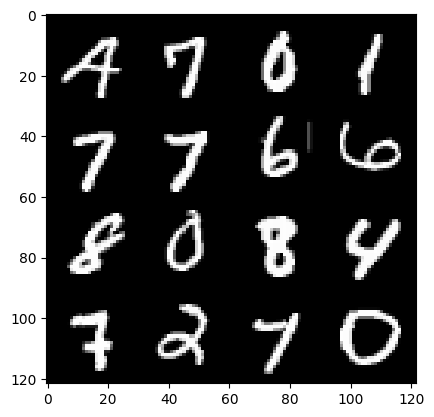

11: step 5400 / Gen loss: 6.5954830217361415 / Disc loss: 0.013986464993407336


  0%|          | 0/469 [00:00<?, ?it/s]

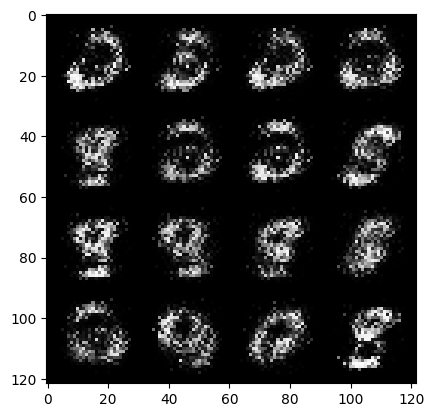

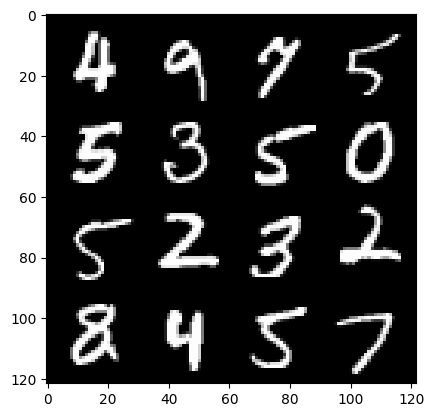

12: step 5700 / Gen loss: 6.224942388534539 / Disc loss: 0.01486490344163031


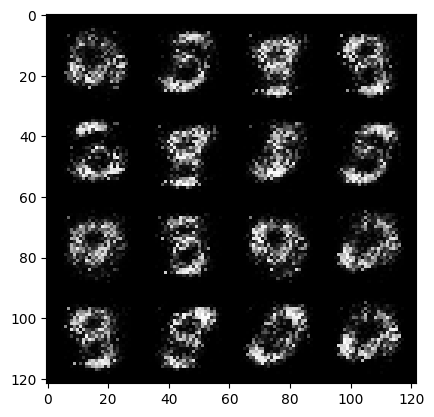

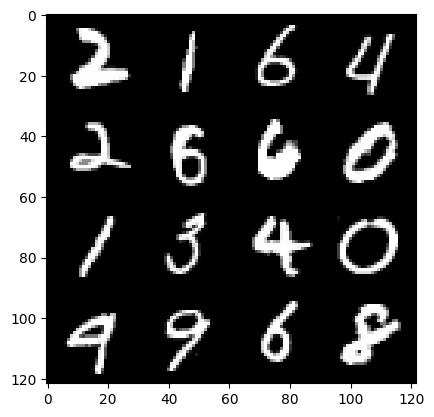

12: step 6000 / Gen loss: 6.758667931556701 / Disc loss: 0.01424547744449228


  0%|          | 0/469 [00:00<?, ?it/s]

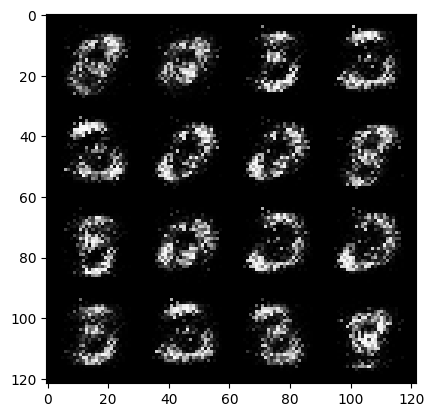

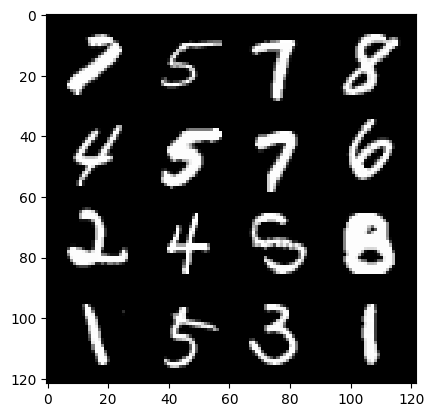

13: step 6300 / Gen loss: 6.640917903582257 / Disc loss: 0.01685599128327643


  0%|          | 0/469 [00:00<?, ?it/s]

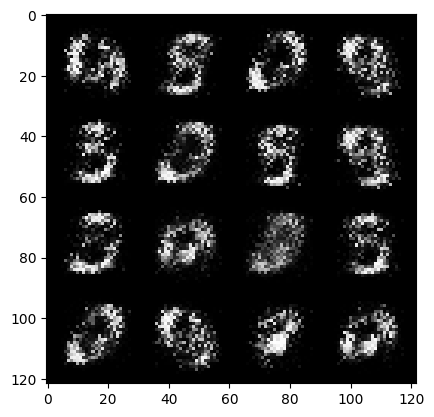

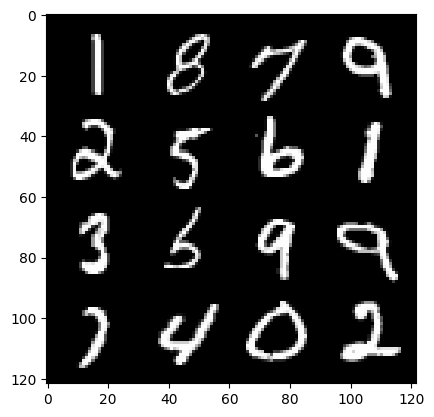

14: step 6600 / Gen loss: 6.4795667839050255 / Disc loss: 0.016091155689209692


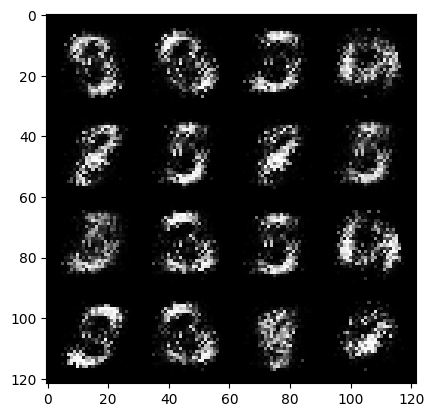

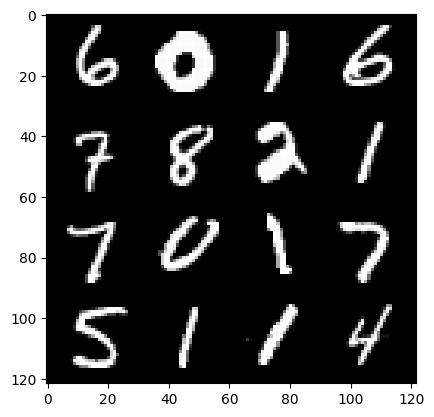

14: step 6900 / Gen loss: 6.98024341106415 / Disc loss: 0.01479461938763658


  0%|          | 0/469 [00:00<?, ?it/s]

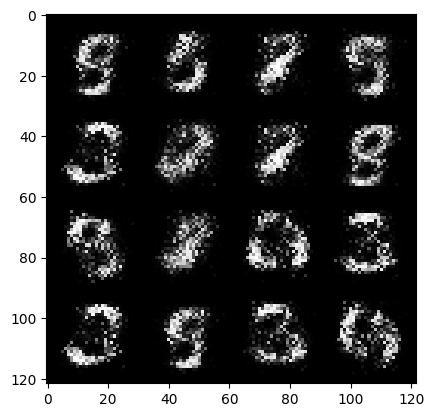

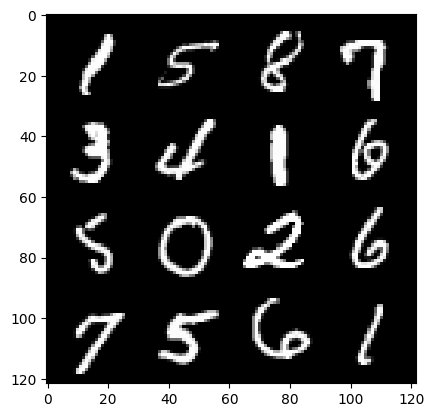

15: step 7200 / Gen loss: 6.84884238878886 / Disc loss: 0.014033898560640717


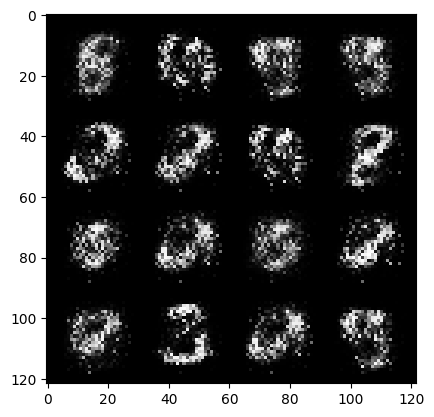

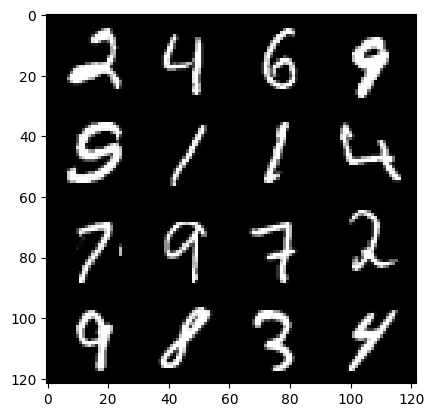

15: step 7500 / Gen loss: 7.0827215576171865 / Disc loss: 0.011200172282600158


  0%|          | 0/469 [00:00<?, ?it/s]

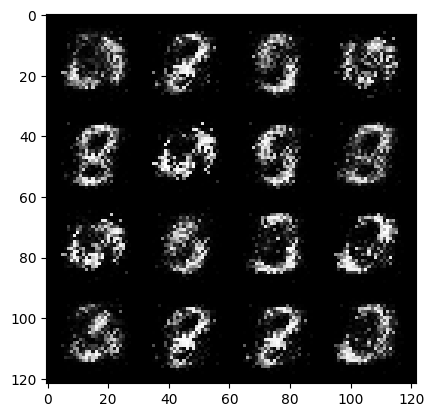

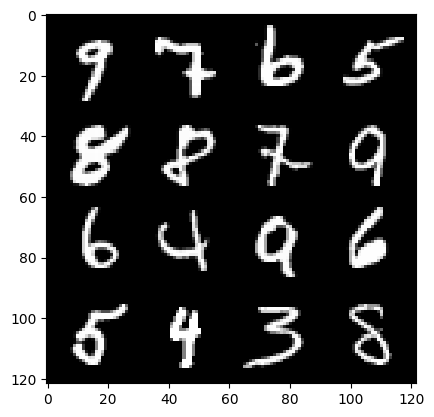

16: step 7800 / Gen loss: 7.2530268383026115 / Disc loss: 0.01190575860595951


  0%|          | 0/469 [00:00<?, ?it/s]

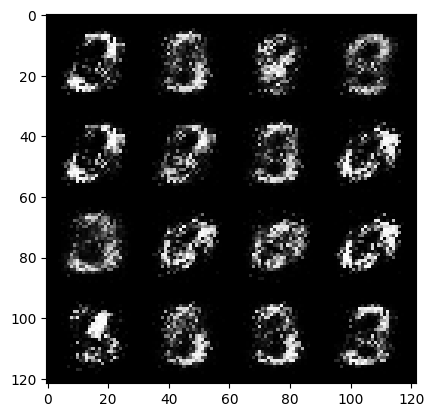

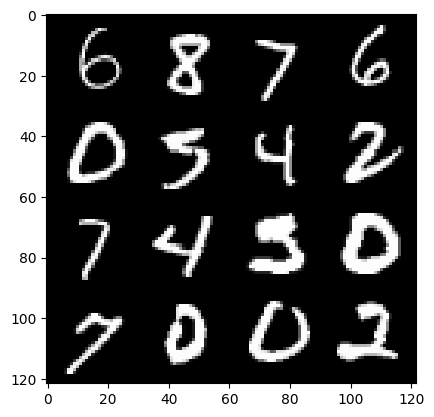

17: step 8100 / Gen loss: 7.265877389907834 / Disc loss: 0.009847603016532959


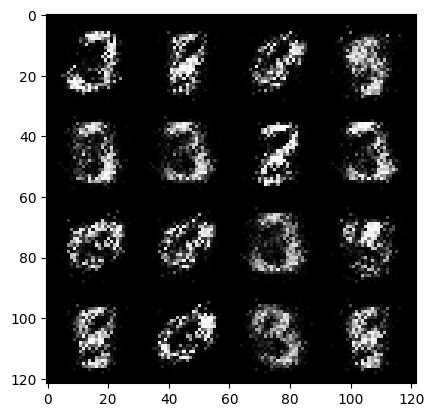

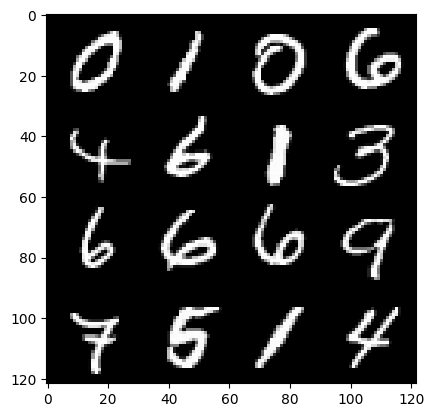

17: step 8400 / Gen loss: 6.838620893160501 / Disc loss: 0.010002678283490244


  0%|          | 0/469 [00:00<?, ?it/s]

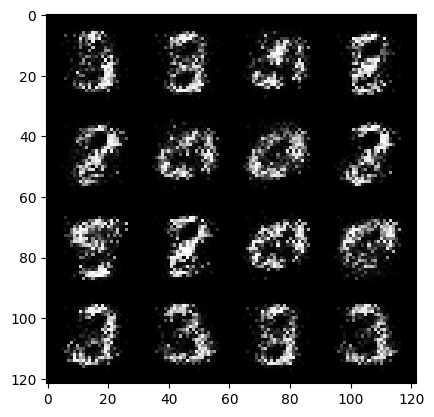

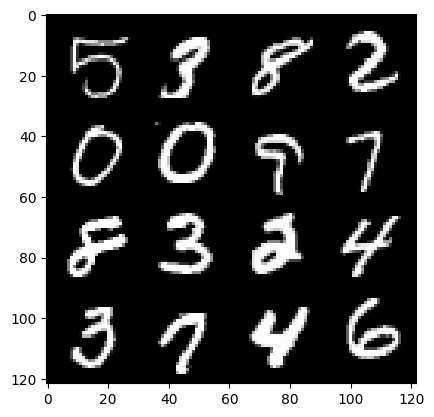

18: step 8700 / Gen loss: 7.018396719296774 / Disc loss: 0.008763106920911624


  0%|          | 0/469 [00:00<?, ?it/s]

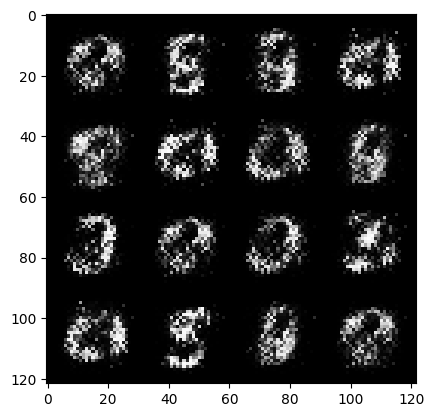

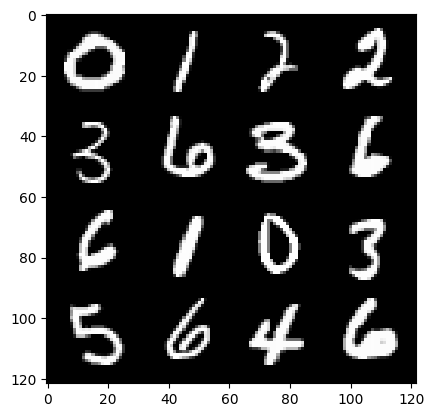

19: step 9000 / Gen loss: 7.3725404008229605 / Disc loss: 0.008300478845679513


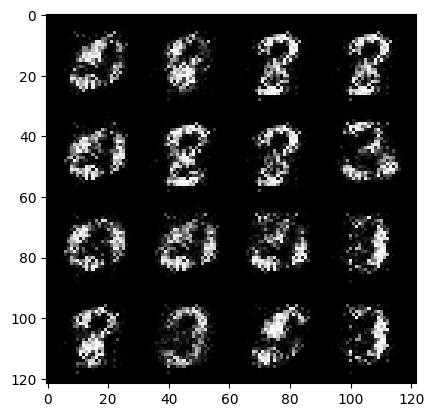

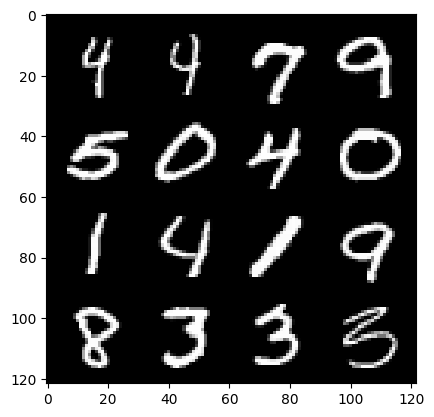

19: step 9300 / Gen loss: 7.634220736821493 / Disc loss: 0.008963563928846272


  0%|          | 0/469 [00:00<?, ?it/s]

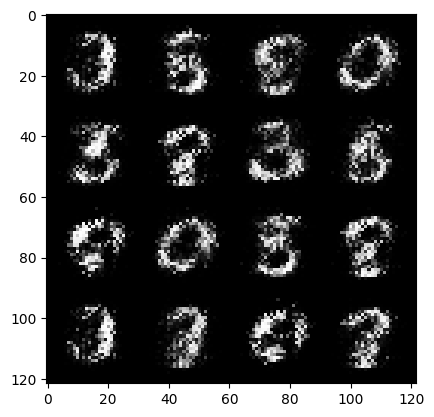

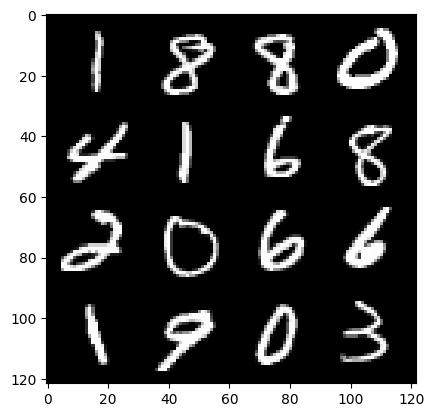

20: step 9600 / Gen loss: 6.818678390185036 / Disc loss: 0.013010868357184024


  0%|          | 0/469 [00:00<?, ?it/s]

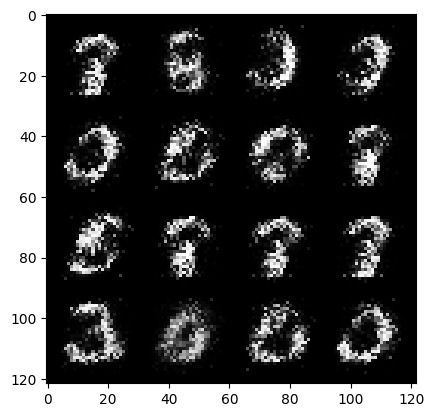

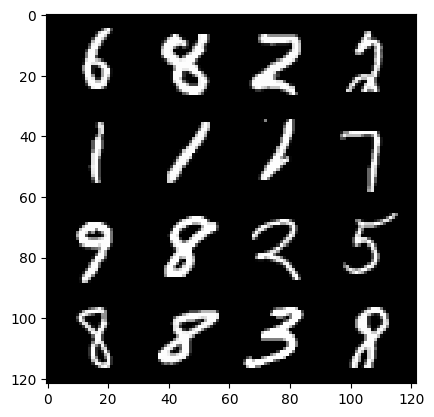

21: step 9900 / Gen loss: 6.512943038940433 / Disc loss: 0.012394453967766216


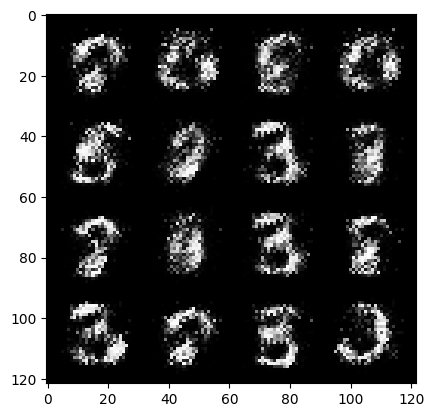

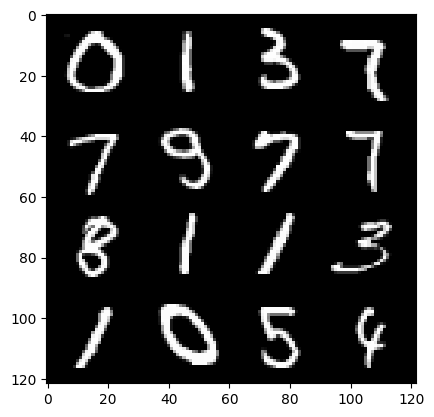

21: step 10200 / Gen loss: 6.889274835586546 / Disc loss: 0.011693948945030569


  0%|          | 0/469 [00:00<?, ?it/s]

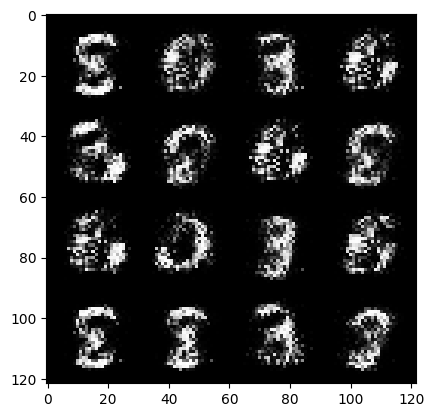

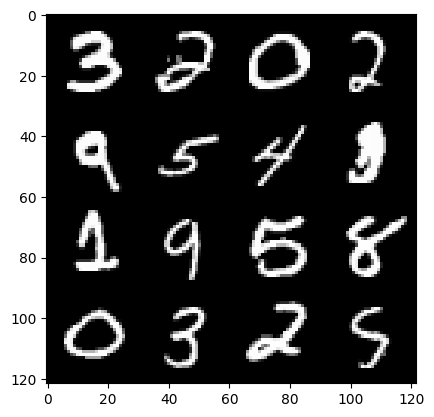

22: step 10500 / Gen loss: 6.876421202023823 / Disc loss: 0.011163131267142794


  0%|          | 0/469 [00:00<?, ?it/s]

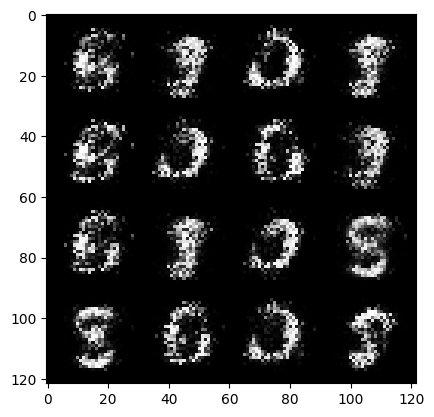

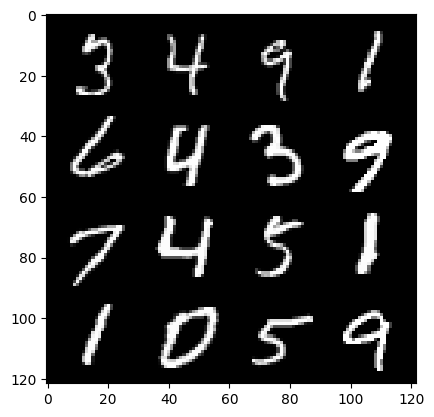

23: step 10800 / Gen loss: 7.0319856071472175 / Disc loss: 0.008228474210482084


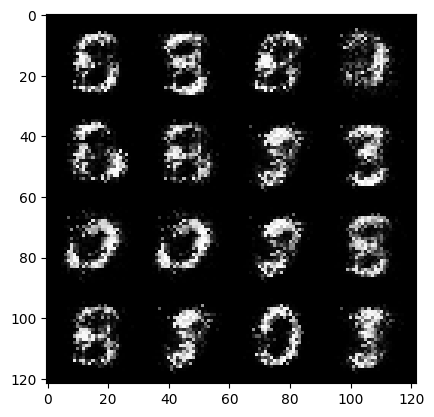

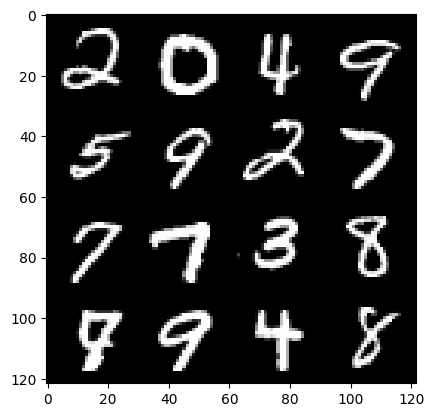

23: step 11100 / Gen loss: 7.903957619667052 / Disc loss: 0.00845529820459584


  0%|          | 0/469 [00:00<?, ?it/s]

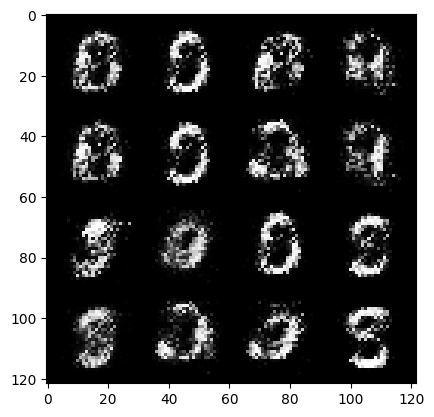

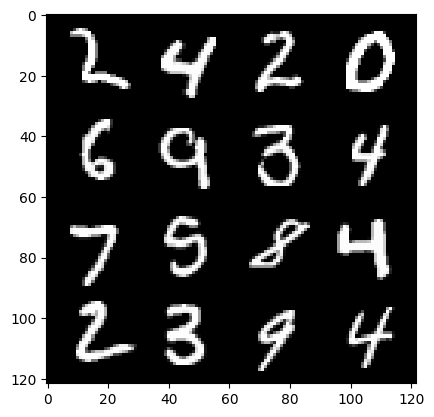

24: step 11400 / Gen loss: 7.593968288103741 / Disc loss: 0.010598498782686264


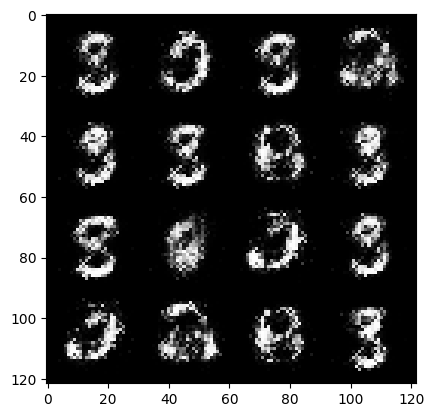

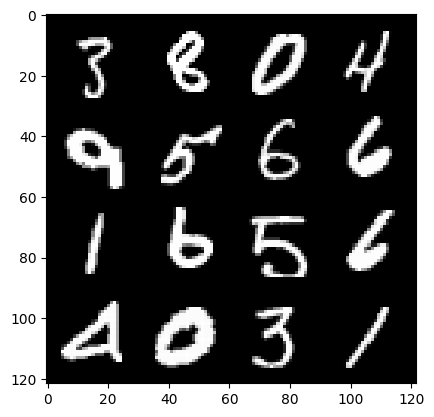

24: step 11700 / Gen loss: 7.331253334681194 / Disc loss: 0.011475247931666674


  0%|          | 0/469 [00:00<?, ?it/s]

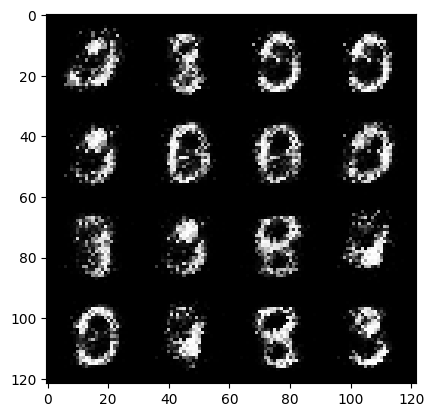

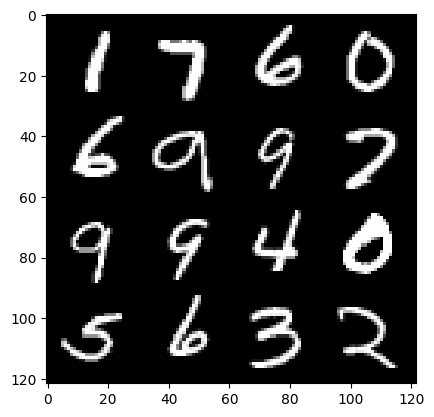

25: step 12000 / Gen loss: 6.870126104354862 / Disc loss: 0.011138585590912645


  0%|          | 0/469 [00:00<?, ?it/s]

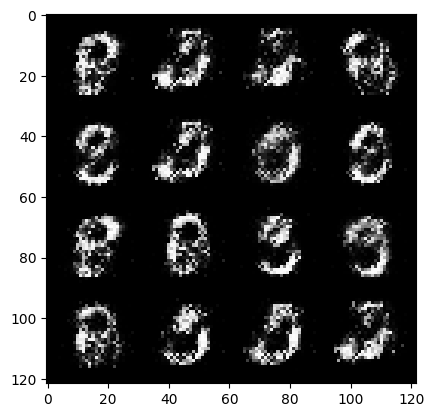

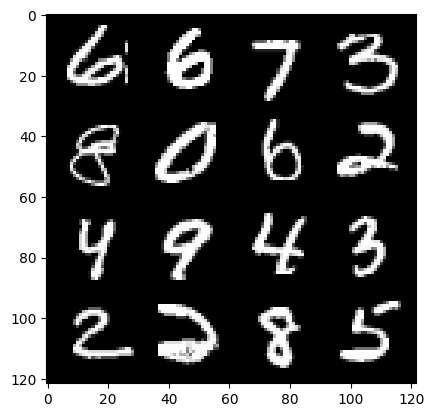

26: step 12300 / Gen loss: 6.759584770202633 / Disc loss: 0.011216647073936954


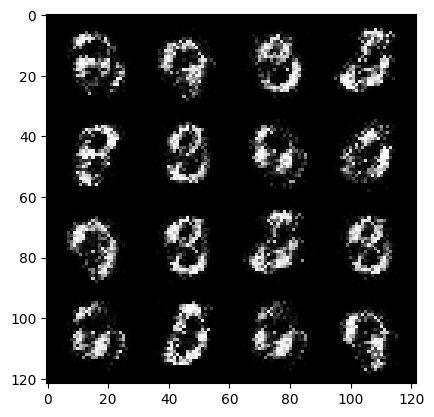

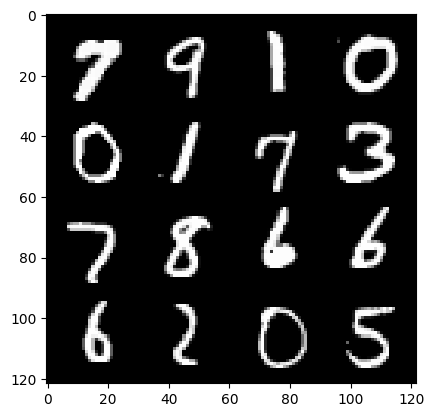

26: step 12600 / Gen loss: 6.967969745000207 / Disc loss: 0.012218748844849567


  0%|          | 0/469 [00:00<?, ?it/s]

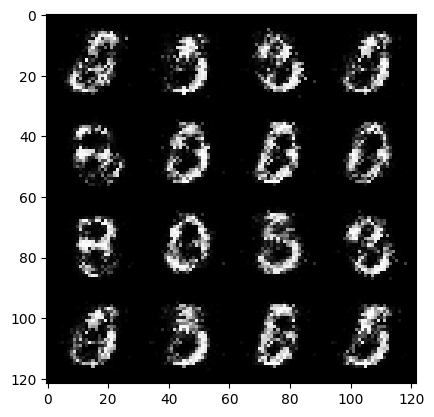

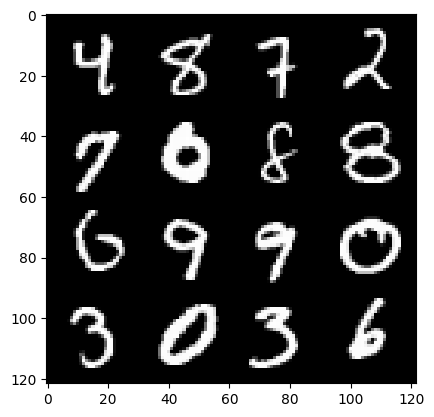

27: step 12900 / Gen loss: 6.952130564053854 / Disc loss: 0.01318386091850698


  0%|          | 0/469 [00:00<?, ?it/s]

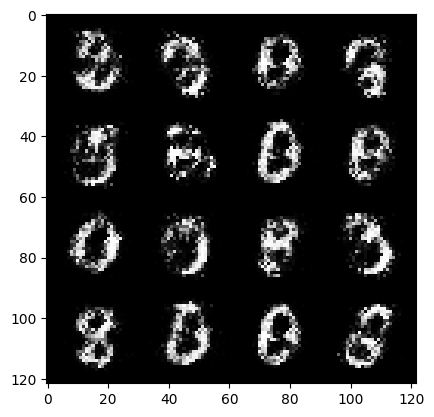

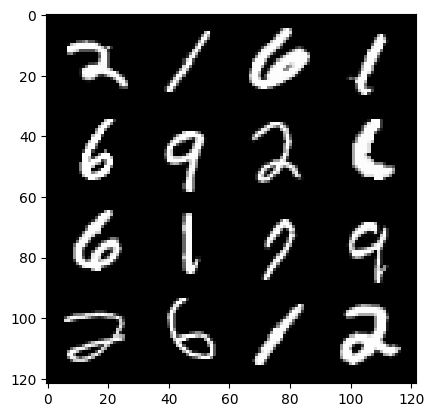

28: step 13200 / Gen loss: 6.636436586380003 / Disc loss: 0.016515100785375877


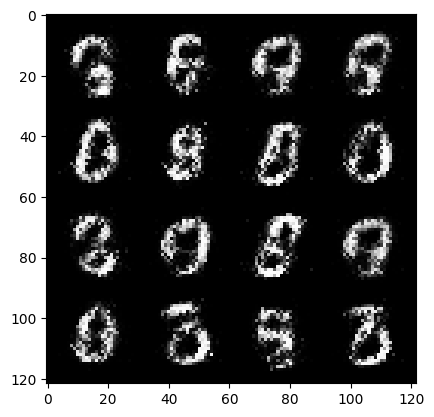

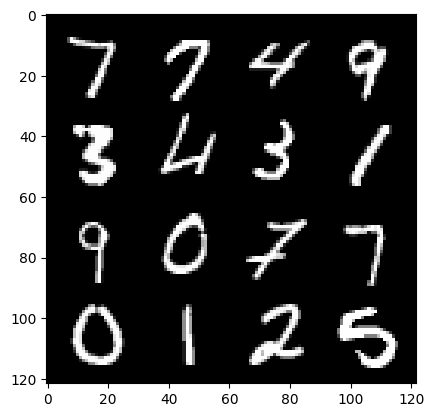

28: step 13500 / Gen loss: 6.439561357498166 / Disc loss: 0.018240471881193442


  0%|          | 0/469 [00:00<?, ?it/s]

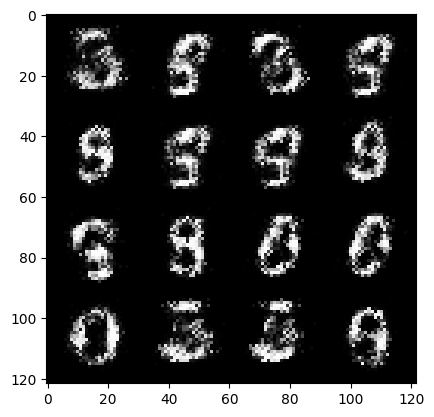

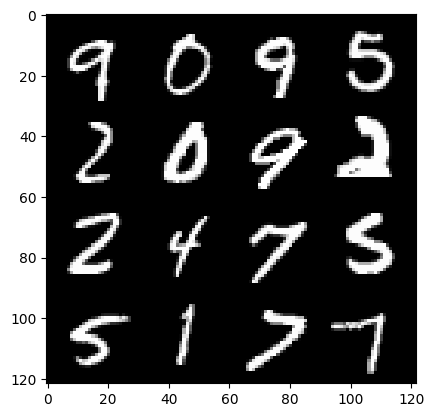

29: step 13800 / Gen loss: 6.571624600092565 / Disc loss: 0.02049206889932978


  0%|          | 0/469 [00:00<?, ?it/s]

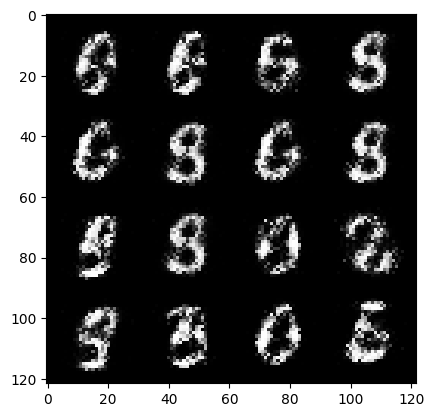

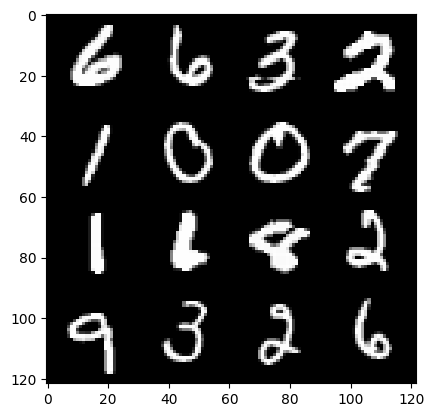

30: step 14100 / Gen loss: 6.689996247291568 / Disc loss: 0.019734534133846567


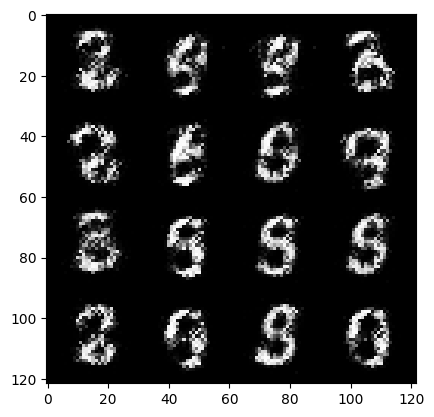

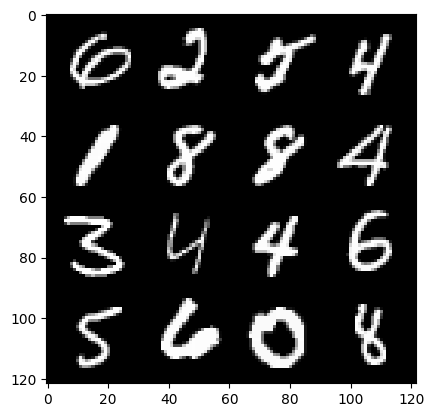

30: step 14400 / Gen loss: 6.398426138559975 / Disc loss: 0.02220561641423653


  0%|          | 0/469 [00:00<?, ?it/s]

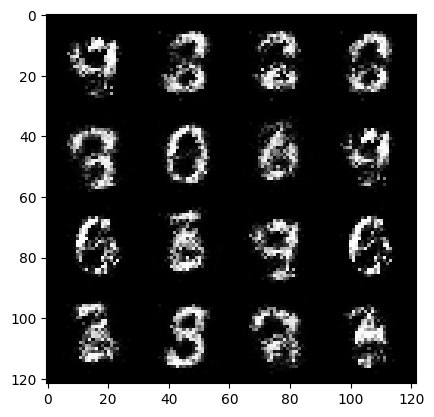

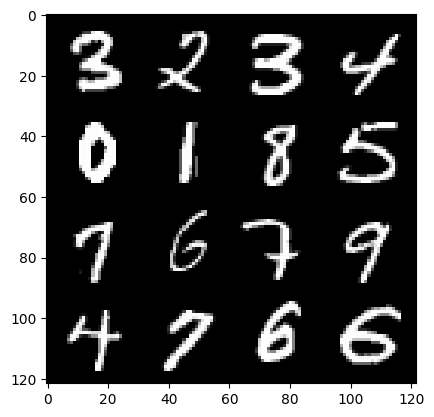

31: step 14700 / Gen loss: 6.312810366948447 / Disc loss: 0.02246913641846429


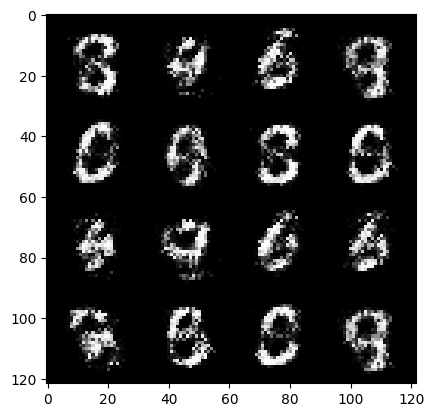

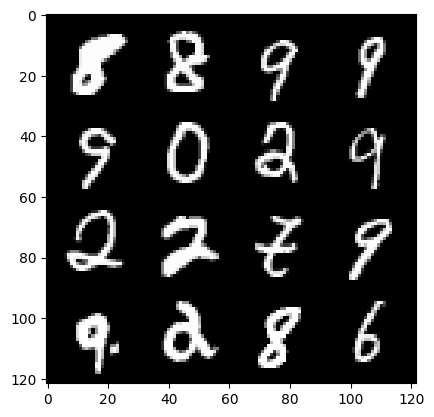

31: step 15000 / Gen loss: 6.122346916198736 / Disc loss: 0.024075514762662335


  0%|          | 0/469 [00:00<?, ?it/s]

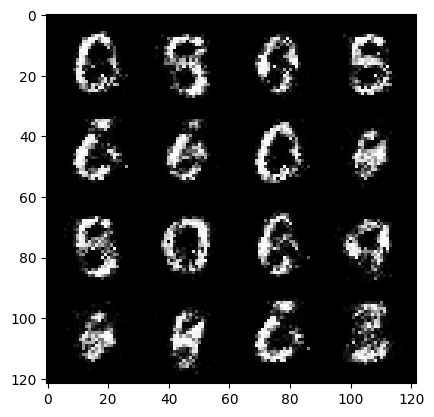

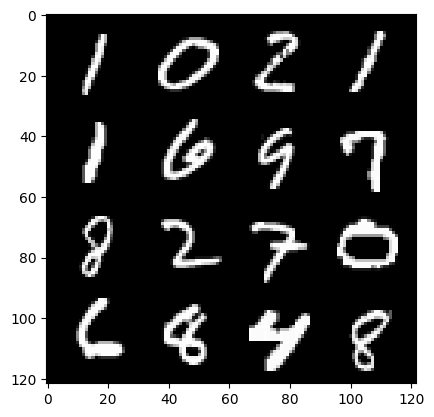

32: step 15300 / Gen loss: 6.1344126653671225 / Disc loss: 0.021227800786339977


  0%|          | 0/469 [00:00<?, ?it/s]

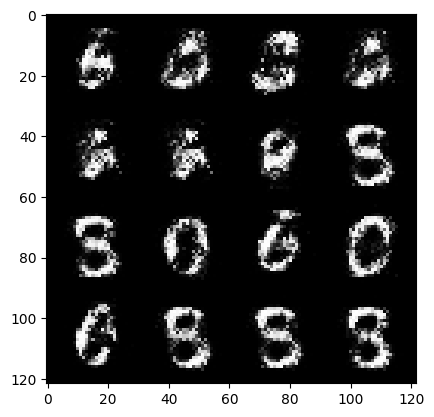

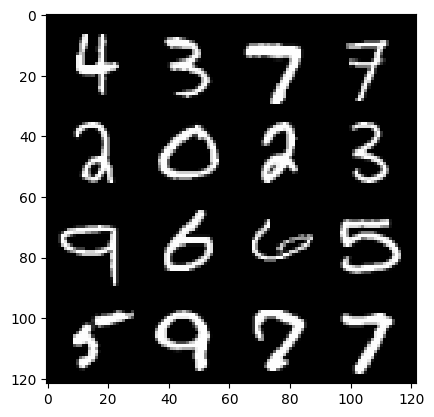

33: step 15600 / Gen loss: 6.3358490339915 / Disc loss: 0.022418403563400118


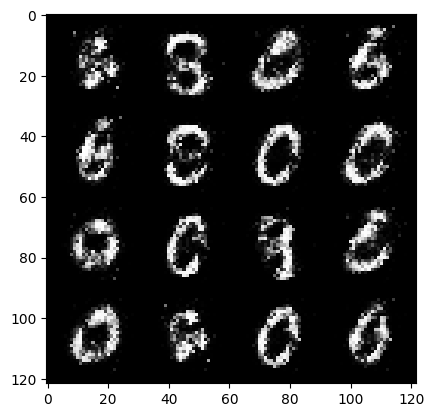

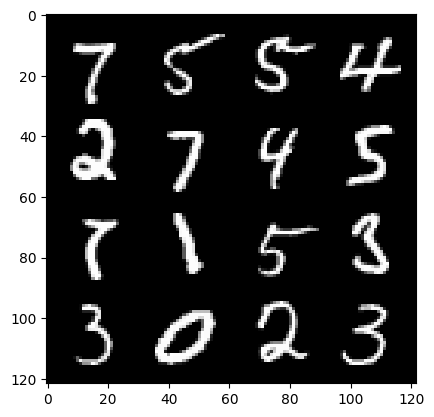

33: step 15900 / Gen loss: 6.066348918279008 / Disc loss: 0.027824452246228856


  0%|          | 0/469 [00:00<?, ?it/s]

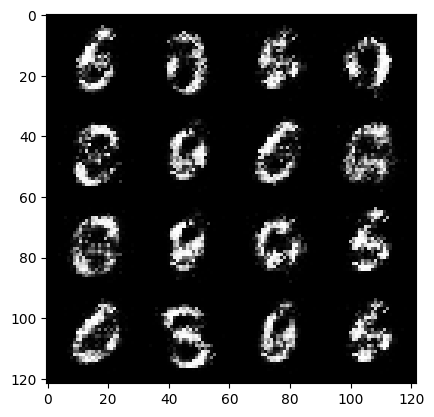

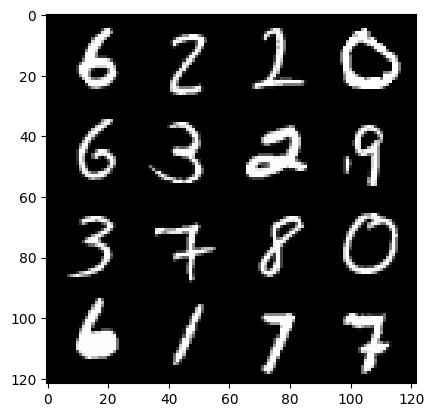

34: step 16200 / Gen loss: 6.29248852094015 / Disc loss: 0.021874377114387864


  0%|          | 0/469 [00:00<?, ?it/s]

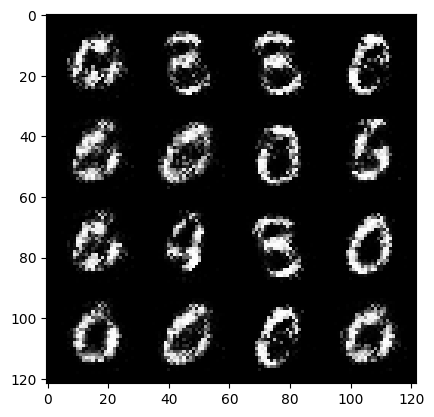

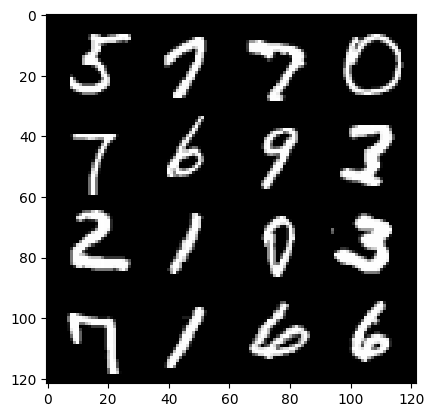

35: step 16500 / Gen loss: 6.134895321528114 / Disc loss: 0.021821476545495298


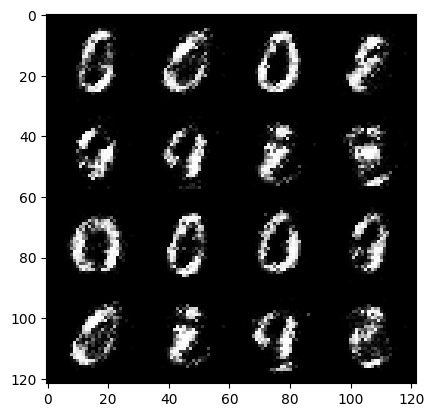

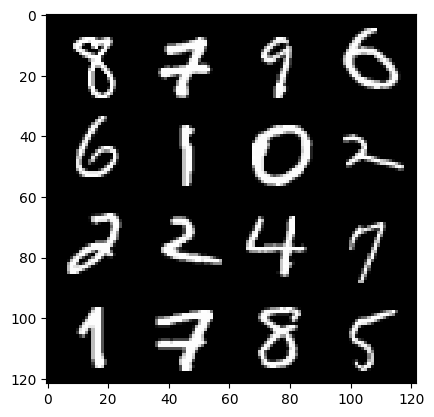

35: step 16800 / Gen loss: 6.113546679814661 / Disc loss: 0.02576244130730629


  0%|          | 0/469 [00:00<?, ?it/s]

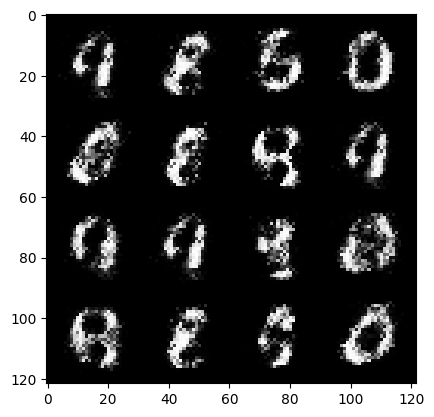

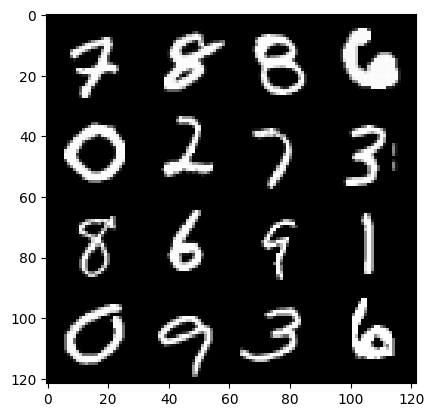

36: step 17100 / Gen loss: 6.0222012535730975 / Disc loss: 0.029388609137386088


  0%|          | 0/469 [00:00<?, ?it/s]

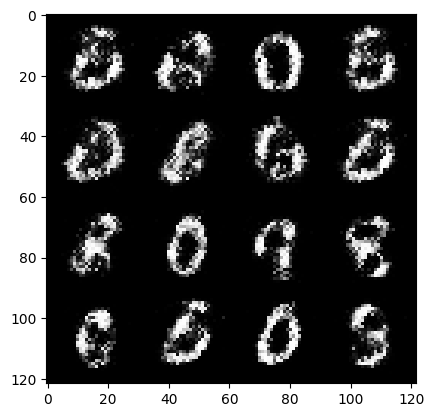

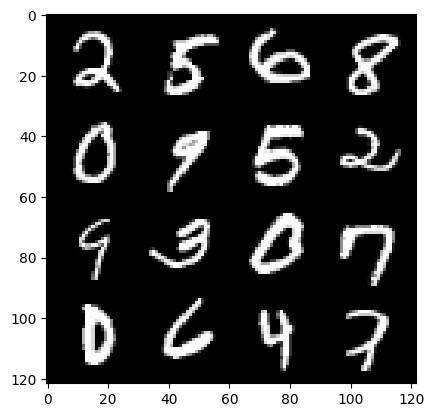

37: step 17400 / Gen loss: 5.961390976905826 / Disc loss: 0.03063713662326335


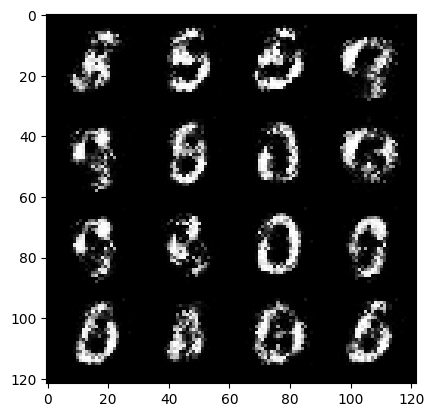

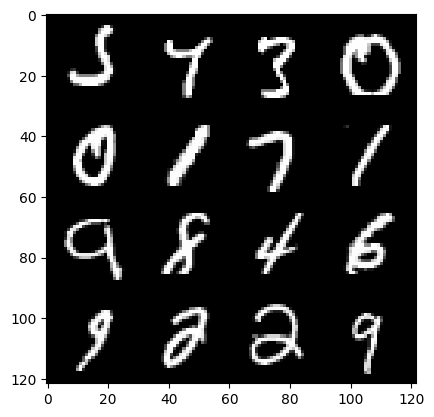

37: step 17700 / Gen loss: 6.139547098477682 / Disc loss: 0.030168074419101087


  0%|          | 0/469 [00:00<?, ?it/s]

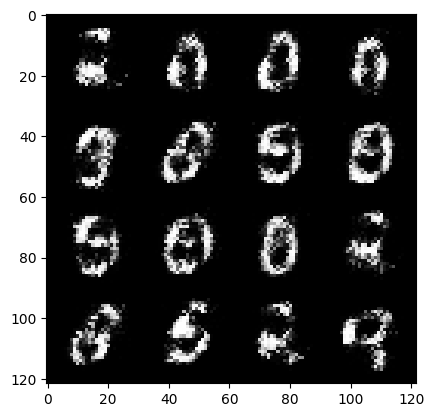

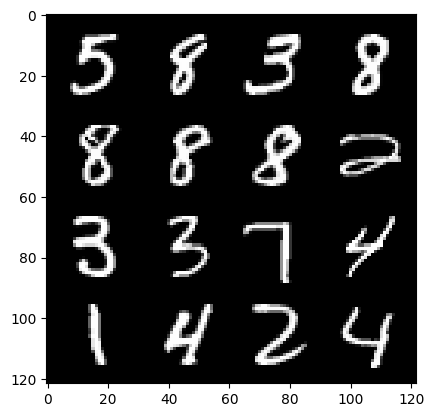

38: step 18000 / Gen loss: 5.751875292460121 / Disc loss: 0.039372021481394785


  0%|          | 0/469 [00:00<?, ?it/s]

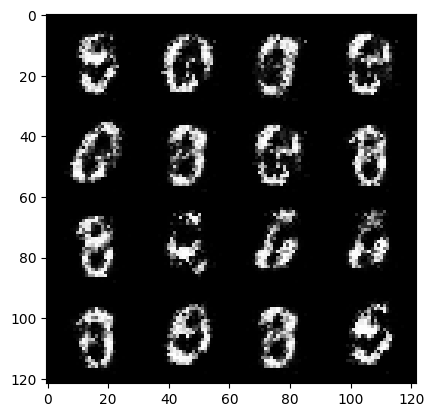

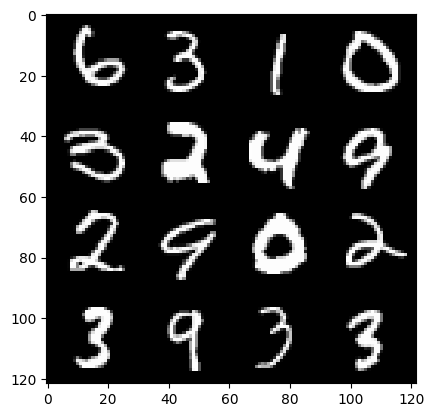

39: step 18300 / Gen loss: 5.5729386186599745 / Disc loss: 0.03828960998915138


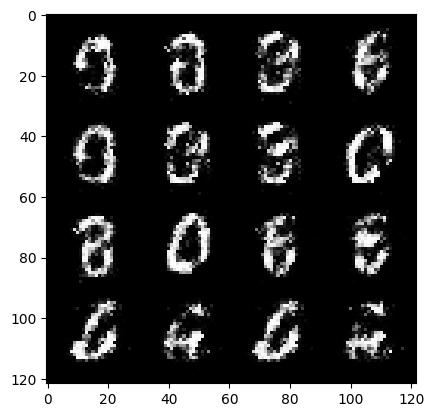

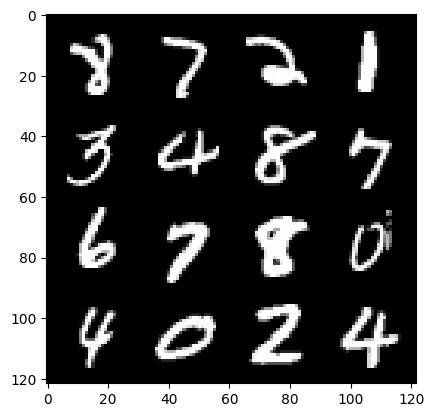

39: step 18600 / Gen loss: 5.669890610376996 / Disc loss: 0.03267953584125885


  0%|          | 0/469 [00:00<?, ?it/s]

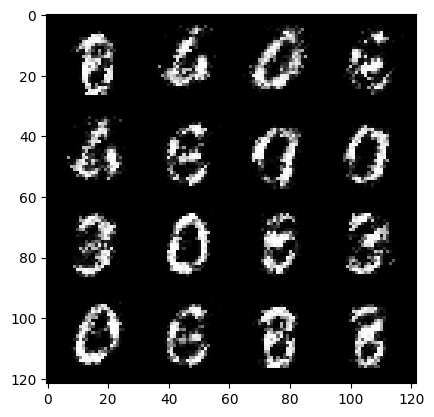

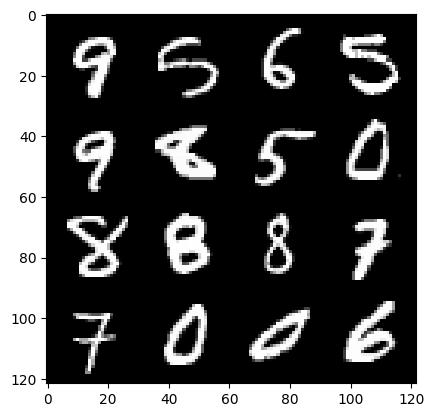

40: step 18900 / Gen loss: 5.7129044659932475 / Disc loss: 0.03371635875664653


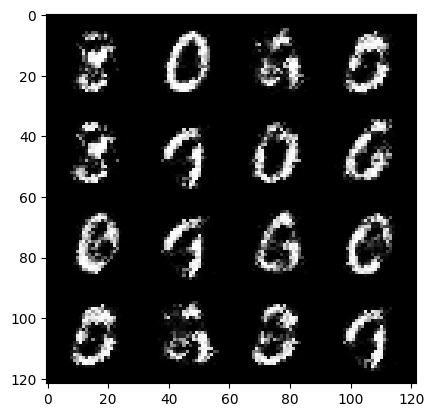

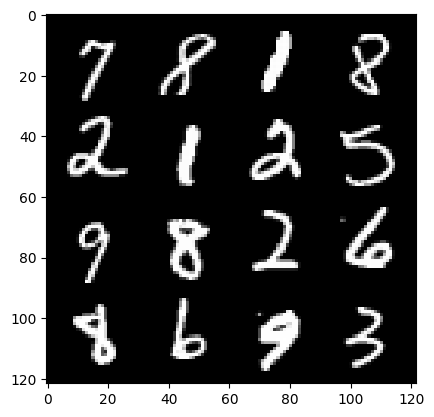

40: step 19200 / Gen loss: 5.591736807823181 / Disc loss: 0.03781019515978794


  0%|          | 0/469 [00:00<?, ?it/s]

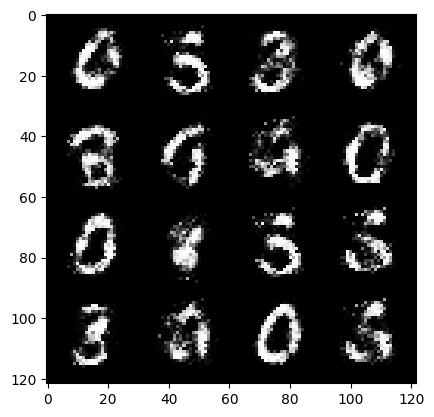

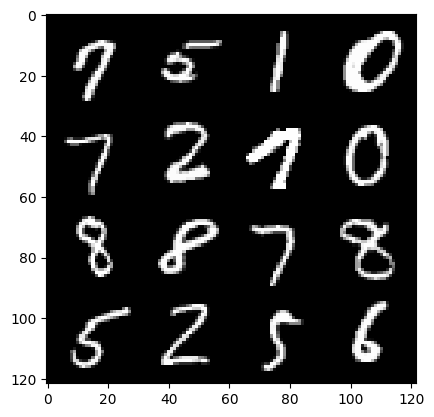

41: step 19500 / Gen loss: 5.5866245047251395 / Disc loss: 0.04050867293340467


  0%|          | 0/469 [00:00<?, ?it/s]

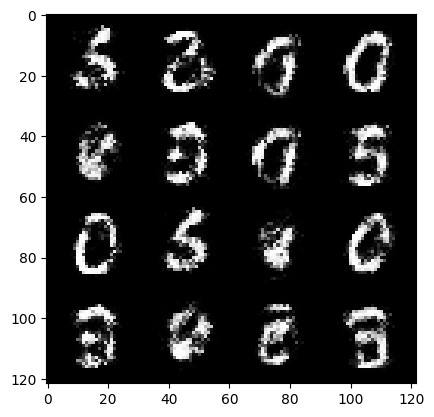

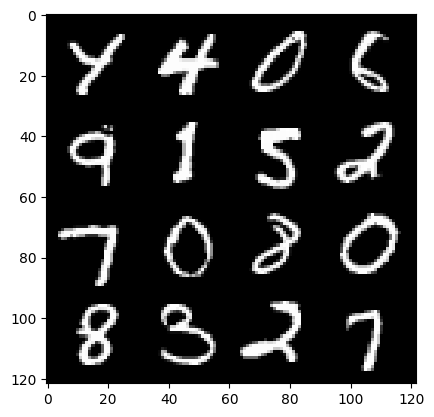

42: step 19800 / Gen loss: 5.705381366411845 / Disc loss: 0.03834970467413463


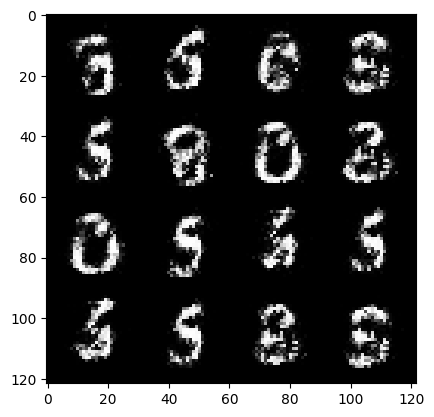

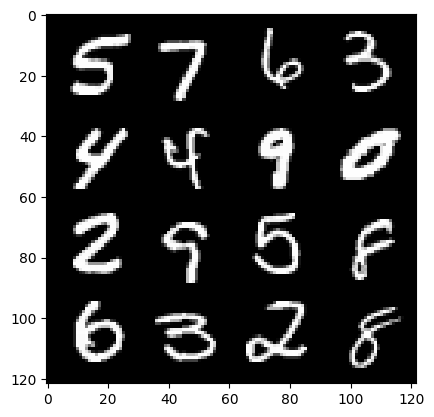

42: step 20100 / Gen loss: 5.554405210812887 / Disc loss: 0.036792839650685624


  0%|          | 0/469 [00:00<?, ?it/s]

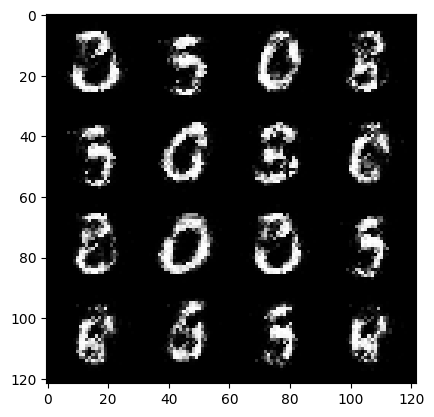

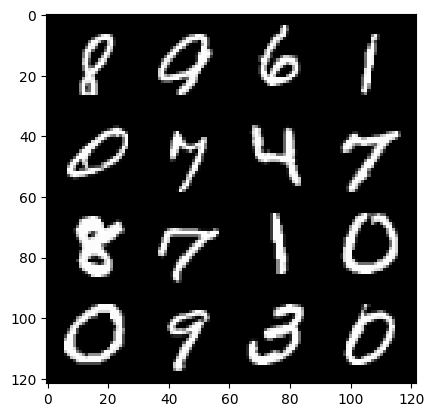

43: step 20400 / Gen loss: 5.597146501541138 / Disc loss: 0.03749842373188588


  0%|          | 0/469 [00:00<?, ?it/s]

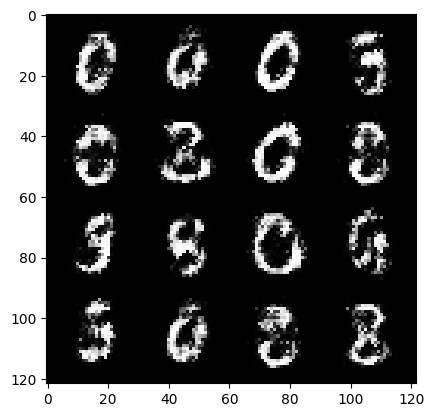

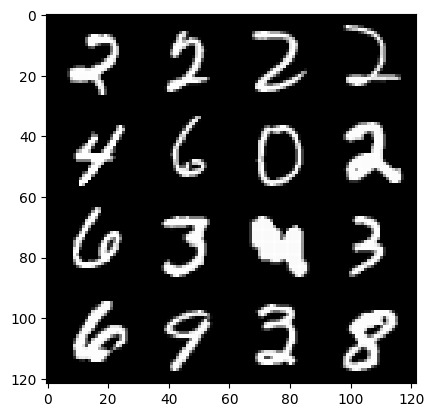

44: step 20700 / Gen loss: 5.524791080156964 / Disc loss: 0.044121973210324836


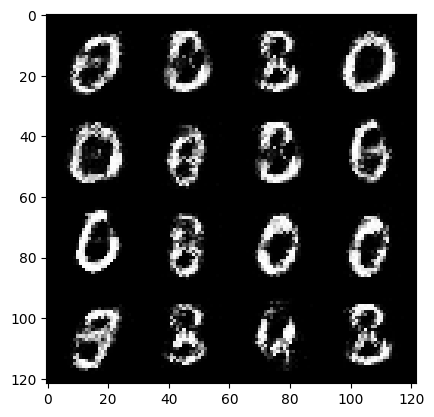

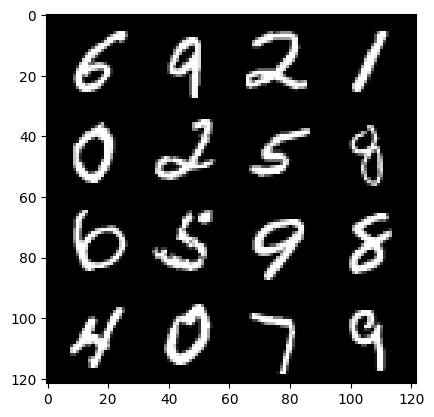

44: step 21000 / Gen loss: 5.514008537928264 / Disc loss: 0.04846759481665988


  0%|          | 0/469 [00:00<?, ?it/s]

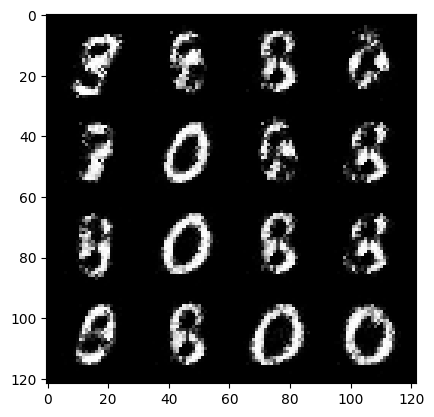

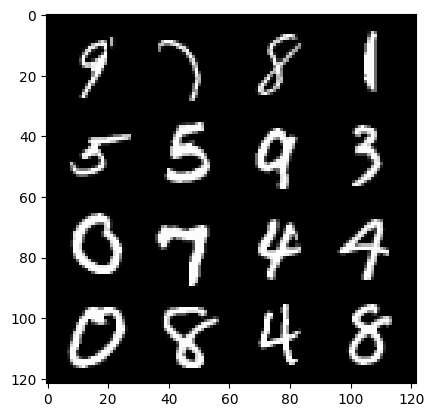

45: step 21300 / Gen loss: 5.2842283415794356 / Disc loss: 0.056805508562053256


  0%|          | 0/469 [00:00<?, ?it/s]

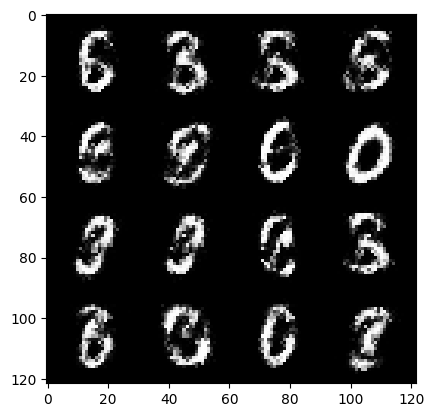

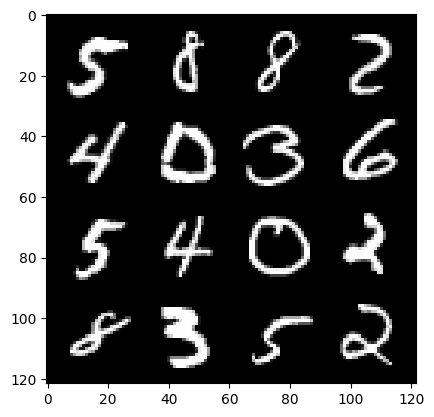

46: step 21600 / Gen loss: 5.2830472199122145 / Disc loss: 0.06125420340026416


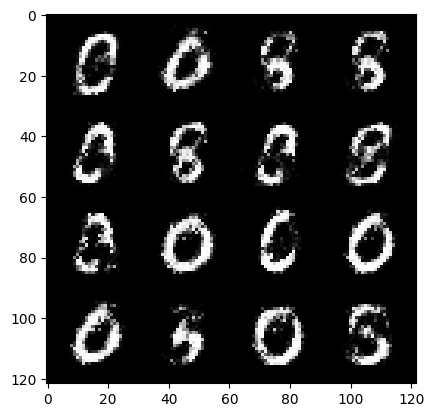

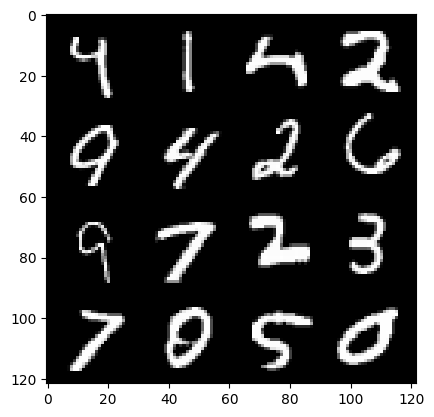

46: step 21900 / Gen loss: 5.08798941930135 / Disc loss: 0.058165022172033815


  0%|          | 0/469 [00:00<?, ?it/s]

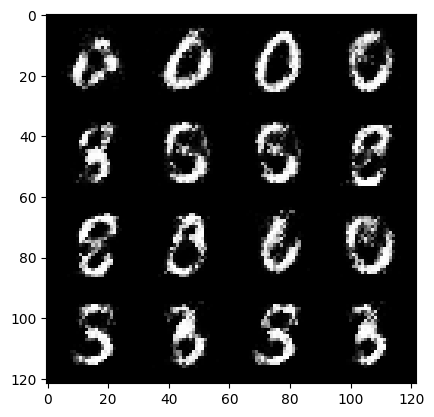

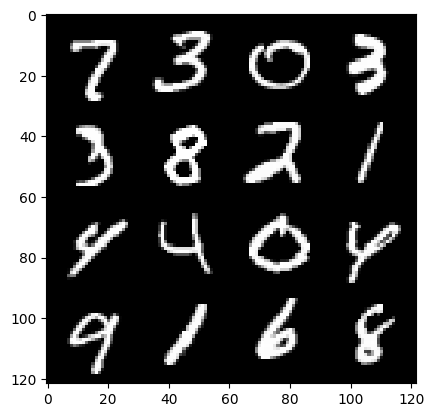

47: step 22200 / Gen loss: 5.019858957131702 / Disc loss: 0.06008628581650555


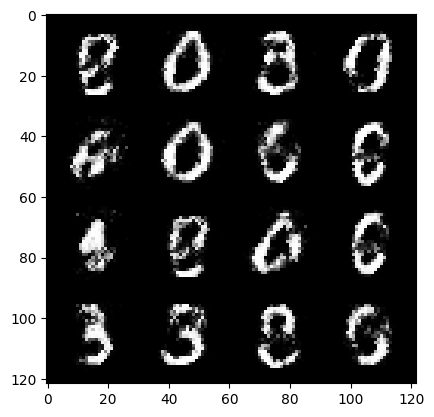

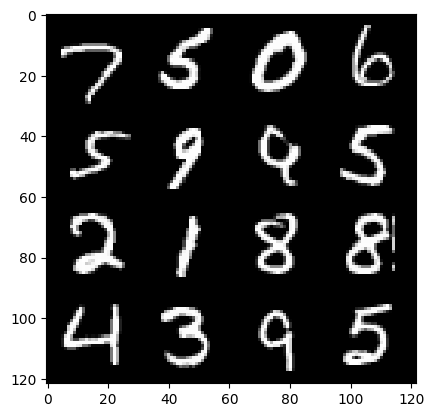

47: step 22500 / Gen loss: 5.011902345816297 / Disc loss: 0.058574084055920454


  0%|          | 0/469 [00:00<?, ?it/s]

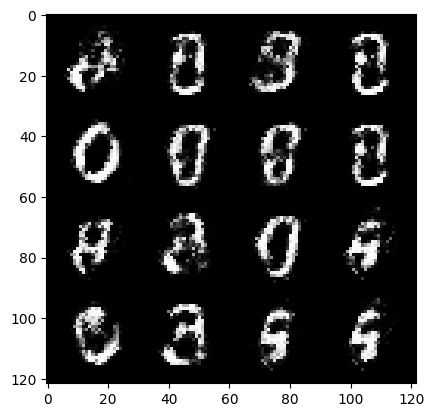

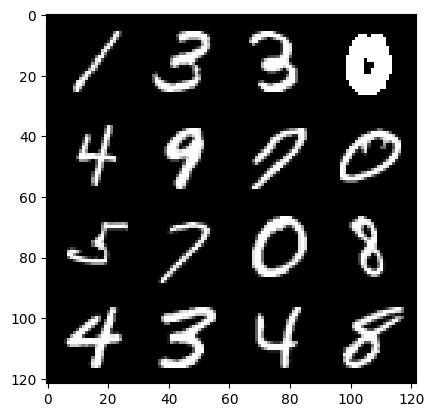

48: step 22800 / Gen loss: 5.195009154478702 / Disc loss: 0.06717037574698524


  0%|          | 0/469 [00:00<?, ?it/s]

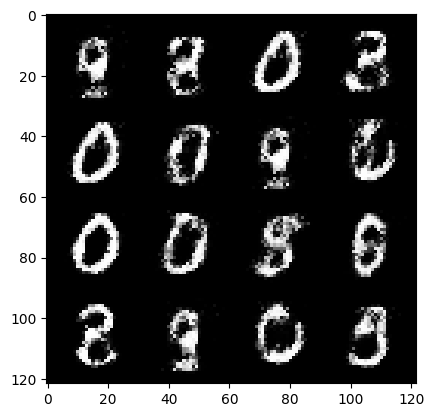

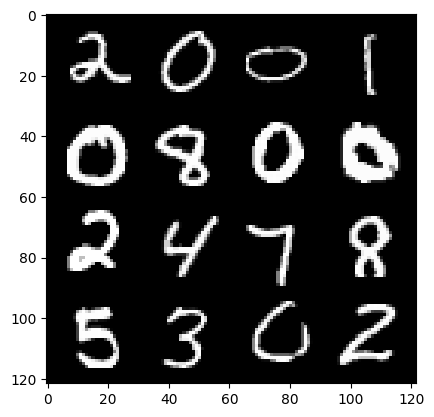

49: step 23100 / Gen loss: 5.285605670611065 / Disc loss: 0.06072253169491891


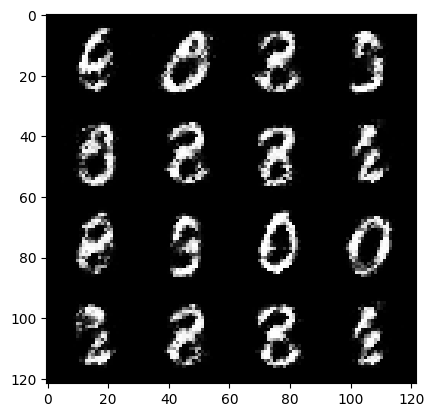

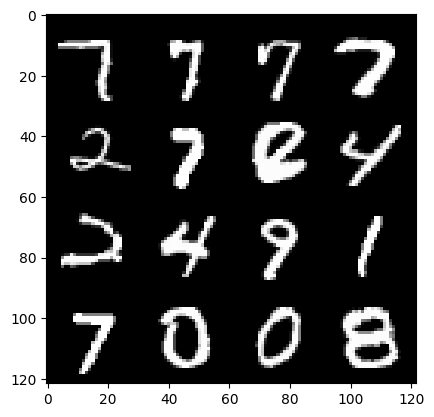

49: step 23400 / Gen loss: 5.083506852785745 / Disc loss: 0.07449384853864707


  0%|          | 0/469 [00:00<?, ?it/s]

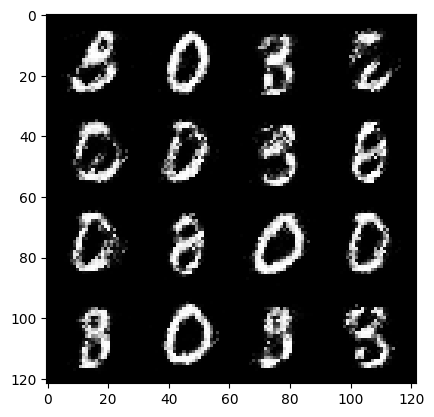

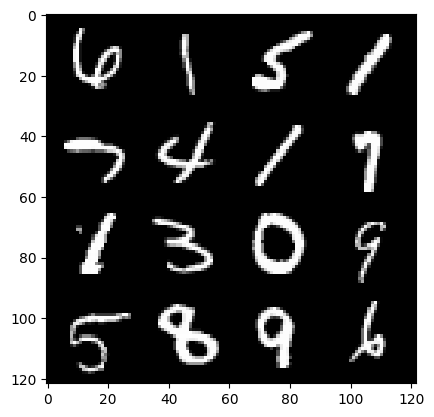

50: step 23700 / Gen loss: 4.959174324671425 / Disc loss: 0.07486124880611893


  0%|          | 0/469 [00:00<?, ?it/s]

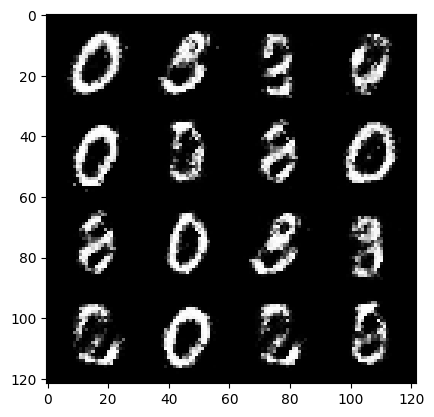

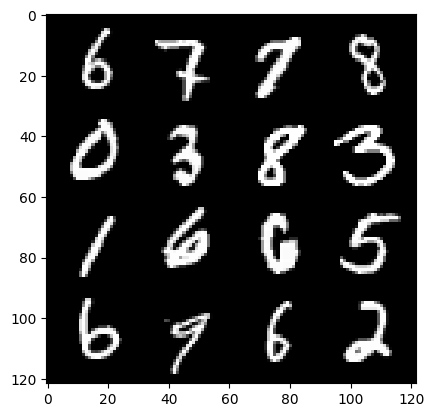

51: step 24000 / Gen loss: 4.8142049956321715 / Disc loss: 0.08628092001502717


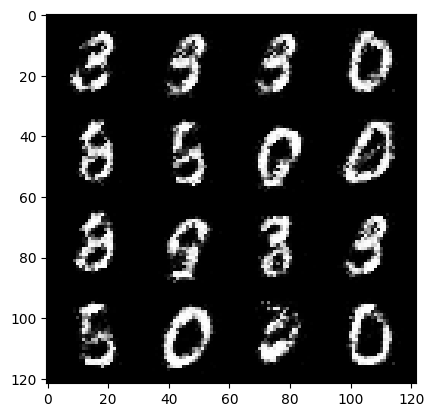

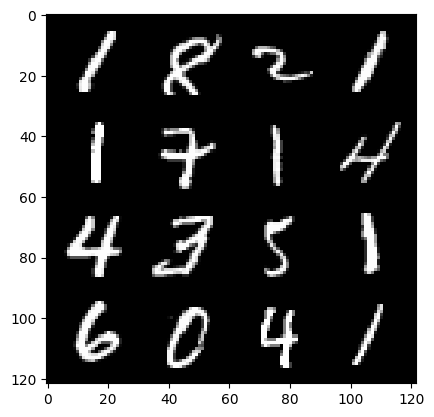

51: step 24300 / Gen loss: 4.632145829995473 / Disc loss: 0.09545898230125503


  0%|          | 0/469 [00:00<?, ?it/s]

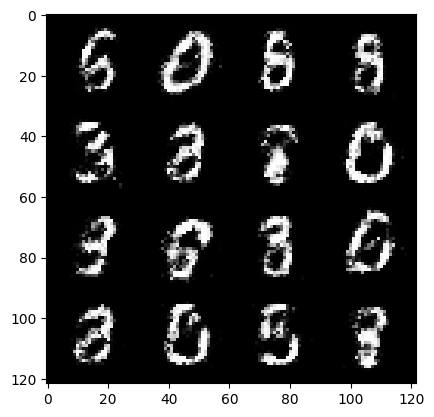

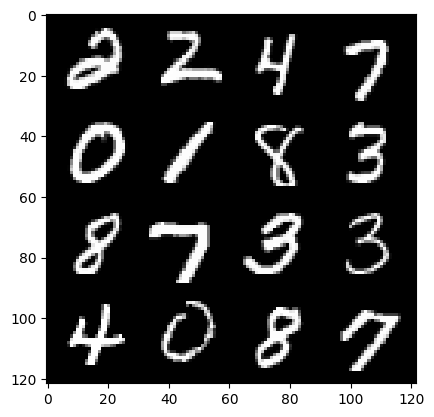

52: step 24600 / Gen loss: 4.530998420715335 / Disc loss: 0.08823705007632564


  0%|          | 0/469 [00:00<?, ?it/s]

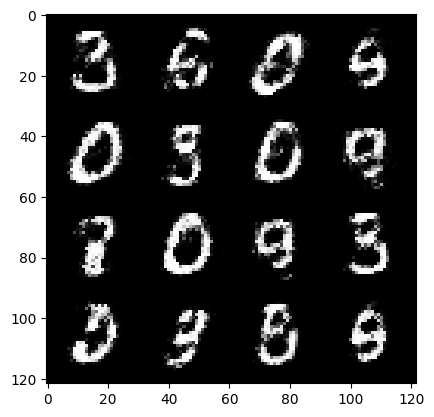

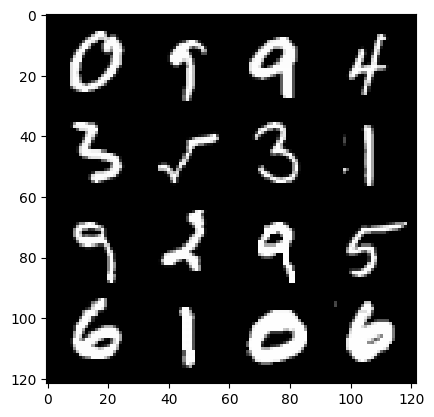

53: step 24900 / Gen loss: 4.725331811110179 / Disc loss: 0.0800730063269536


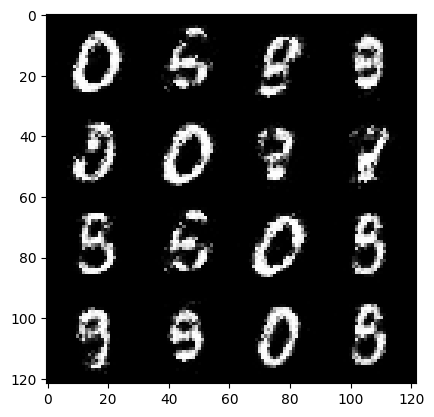

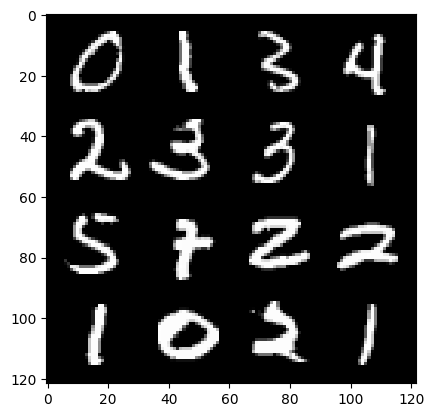

53: step 25200 / Gen loss: 4.623578477700551 / Disc loss: 0.08471877167001367


  0%|          | 0/469 [00:00<?, ?it/s]

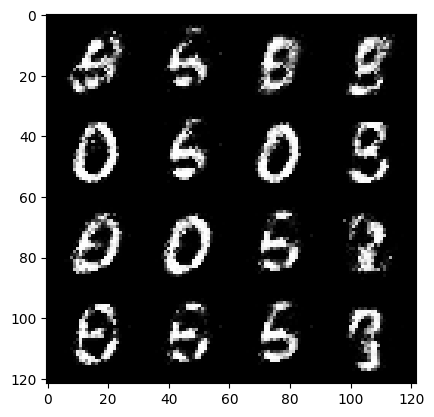

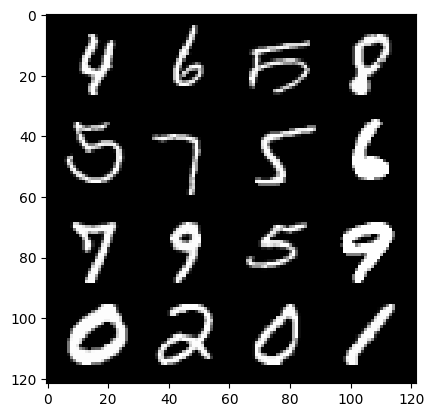

54: step 25500 / Gen loss: 4.550493505001069 / Disc loss: 0.08741564066459732


  0%|          | 0/469 [00:00<?, ?it/s]

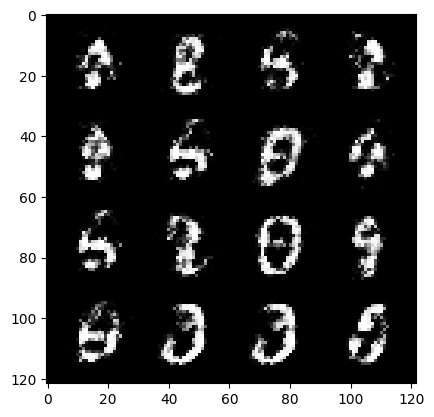

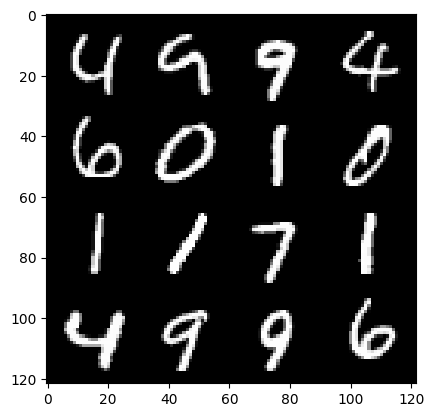

55: step 25800 / Gen loss: 4.556437622706096 / Disc loss: 0.08088606448223194


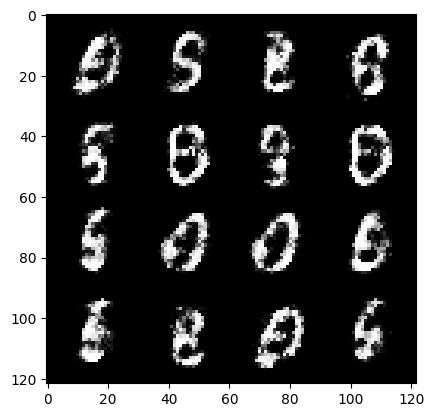

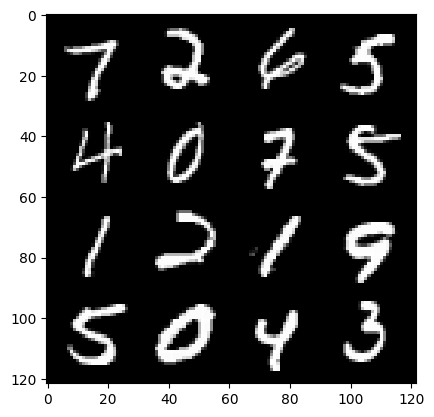

55: step 26100 / Gen loss: 4.772059164047237 / Disc loss: 0.08612962545206149


  0%|          | 0/469 [00:00<?, ?it/s]

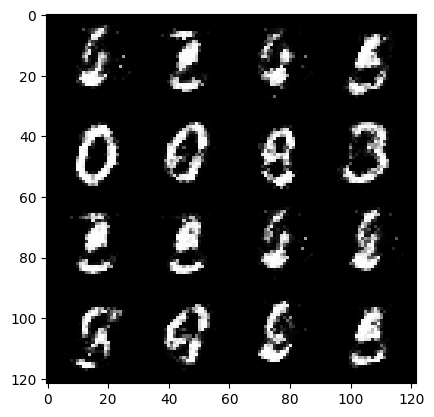

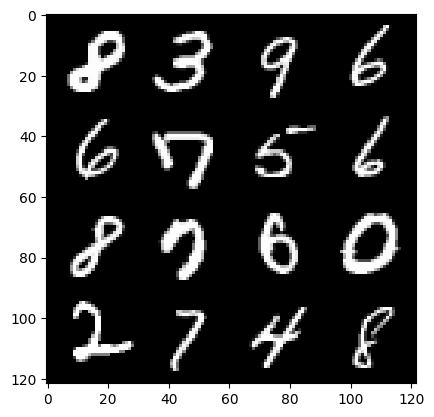

56: step 26400 / Gen loss: 4.392259991963704 / Disc loss: 0.10443425747255487


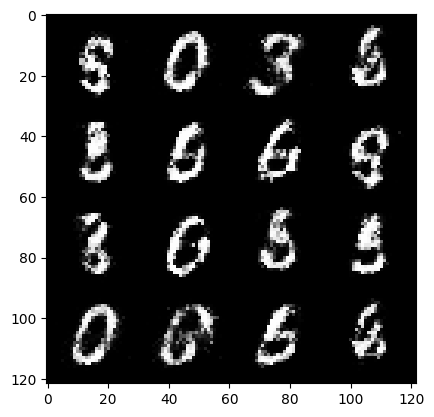

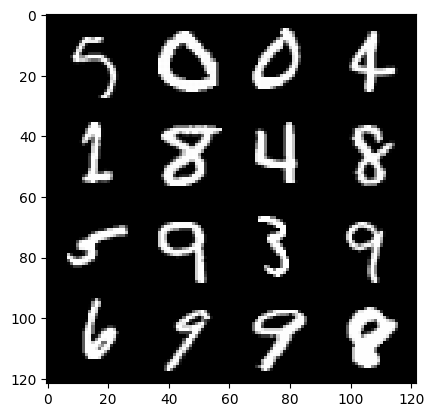

56: step 26700 / Gen loss: 4.467865881125133 / Disc loss: 0.10454607822621861


  0%|          | 0/469 [00:00<?, ?it/s]

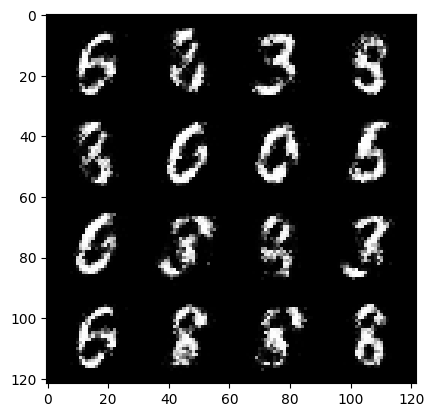

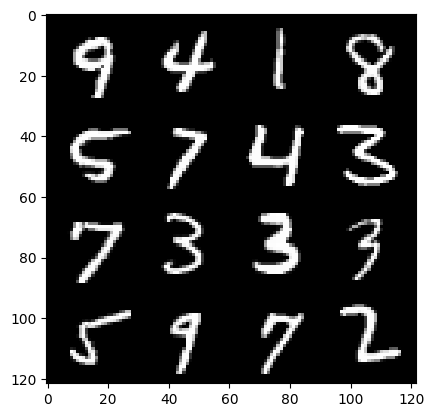

57: step 27000 / Gen loss: 4.3877219684918725 / Disc loss: 0.1069589308152596


  0%|          | 0/469 [00:00<?, ?it/s]

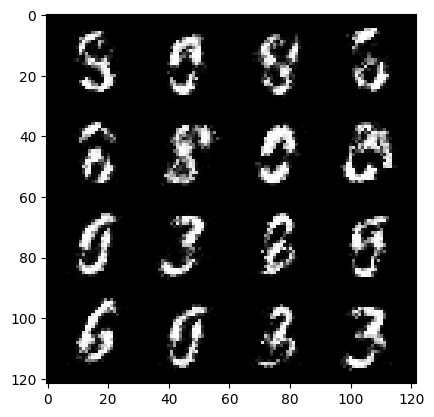

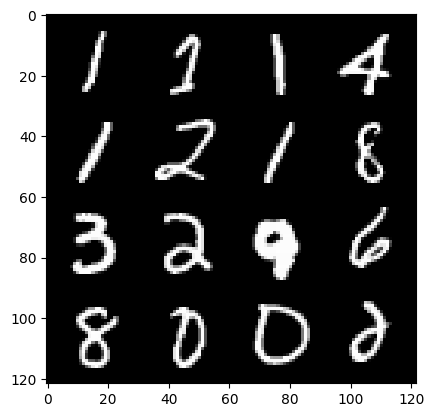

58: step 27300 / Gen loss: 4.321008103688559 / Disc loss: 0.10416082484026748


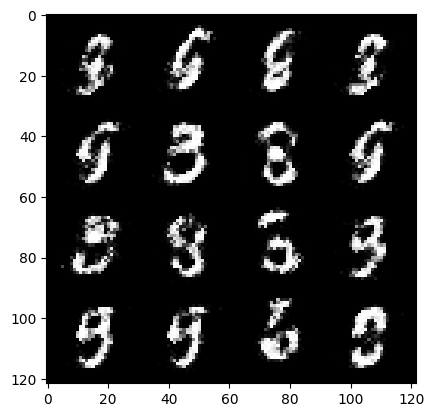

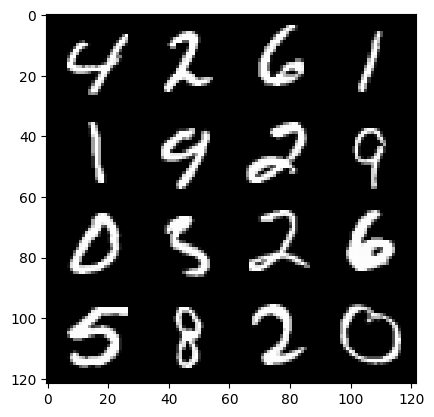

58: step 27600 / Gen loss: 4.377811819712321 / Disc loss: 0.10556223054726913


  0%|          | 0/469 [00:00<?, ?it/s]

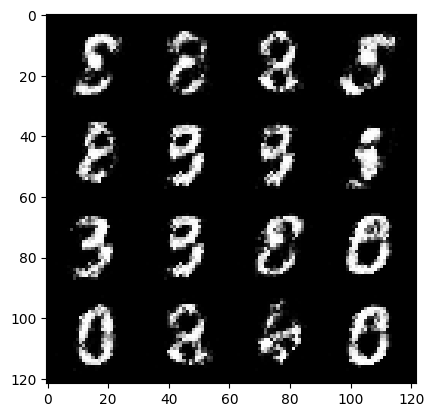

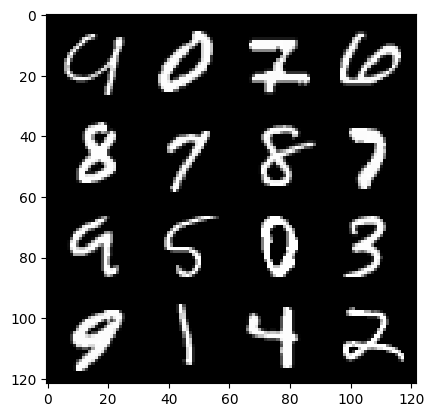

59: step 27900 / Gen loss: 4.40214545965195 / Disc loss: 0.0967392601445317


  0%|          | 0/469 [00:00<?, ?it/s]

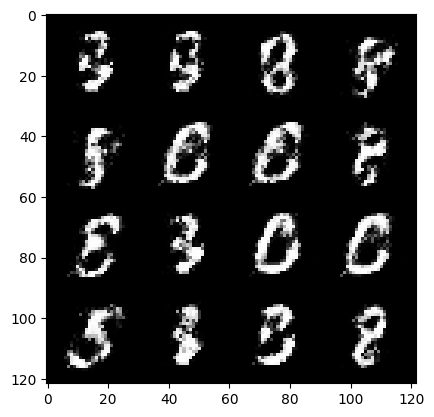

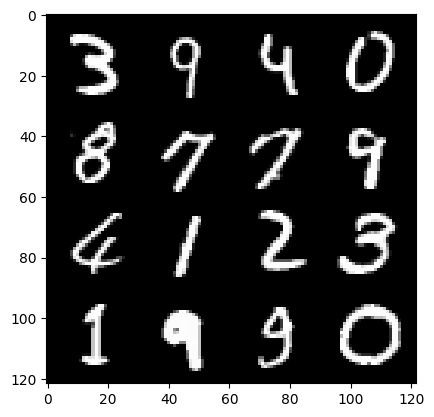

60: step 28200 / Gen loss: 4.149665330251058 / Disc loss: 0.10494987322638433


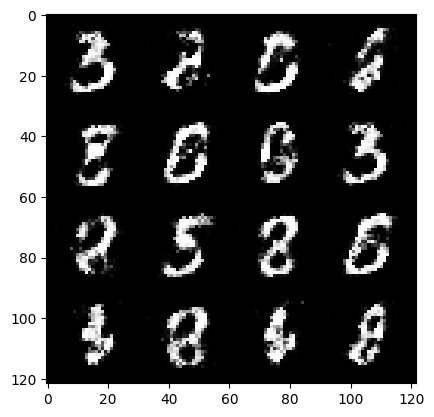

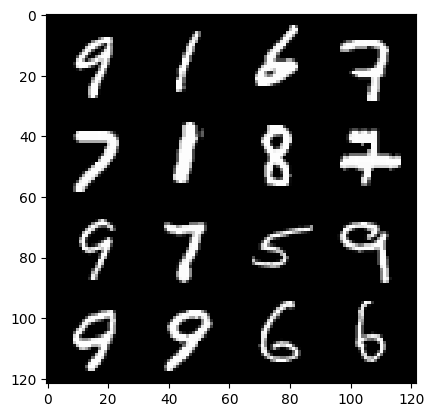

60: step 28500 / Gen loss: 4.43256409883499 / Disc loss: 0.07711909261221689


  0%|          | 0/469 [00:00<?, ?it/s]

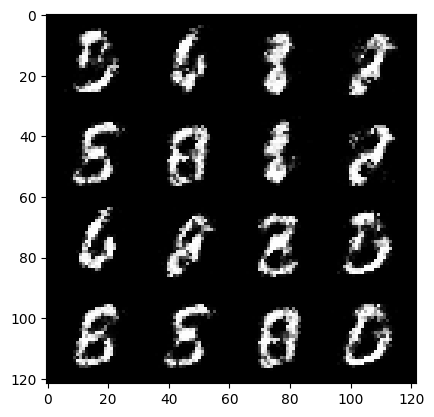

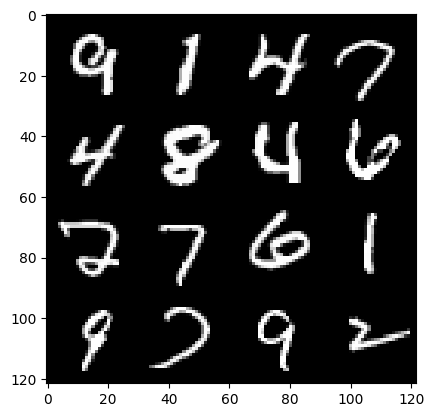

61: step 28800 / Gen loss: 4.6657898537317894 / Disc loss: 0.08880658533424136


  0%|          | 0/469 [00:00<?, ?it/s]

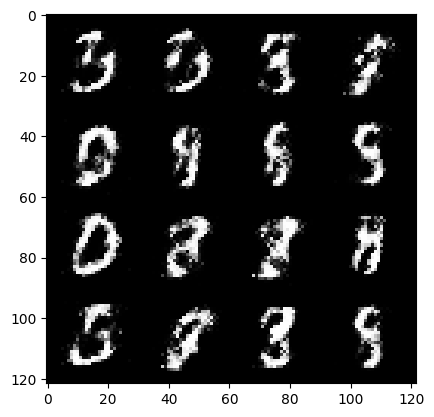

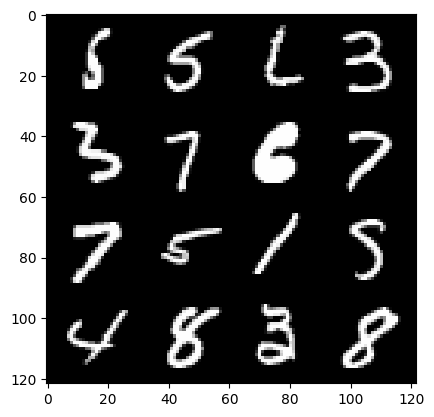

62: step 29100 / Gen loss: 4.4502753988901755 / Disc loss: 0.10567446234946444


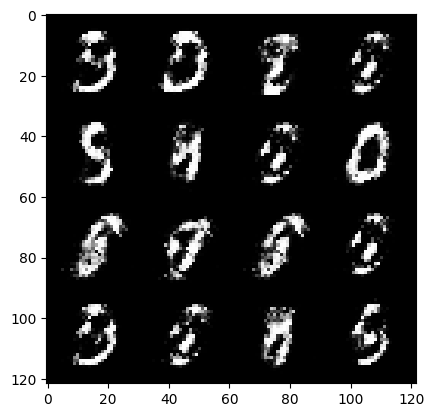

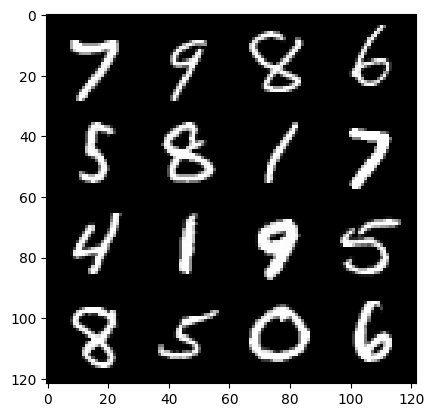

62: step 29400 / Gen loss: 4.349320249557499 / Disc loss: 0.08889048983653393


  0%|          | 0/469 [00:00<?, ?it/s]

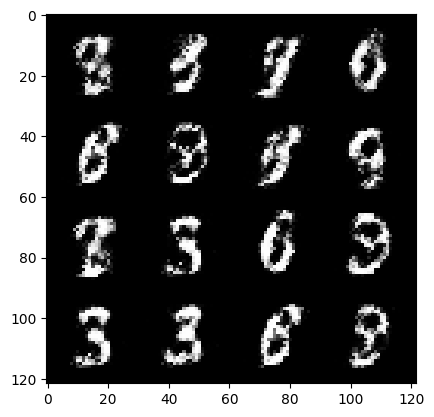

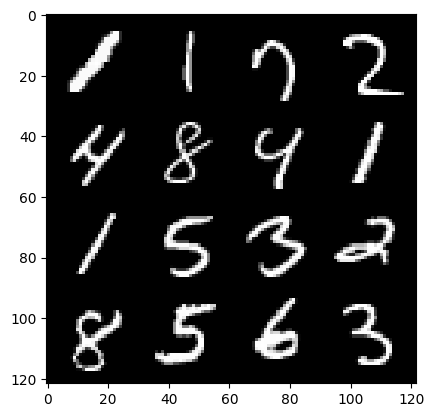

63: step 29700 / Gen loss: 4.3627483852704385 / Disc loss: 0.10194092821329825


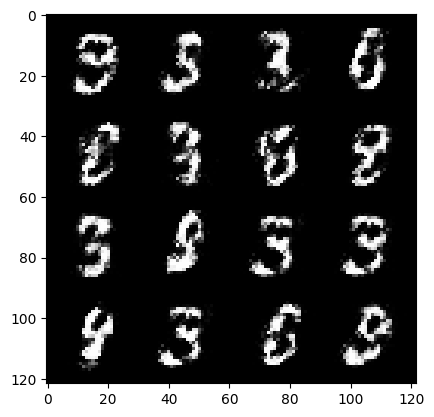

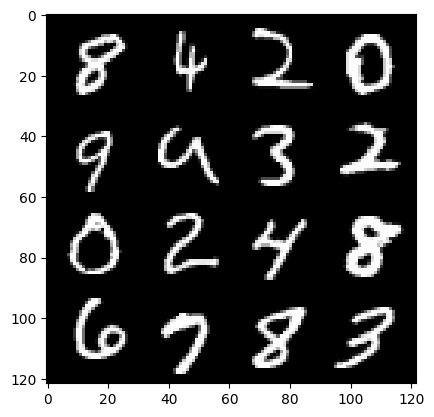

63: step 30000 / Gen loss: 4.373841903209686 / Disc loss: 0.10210128358254823


  0%|          | 0/469 [00:00<?, ?it/s]

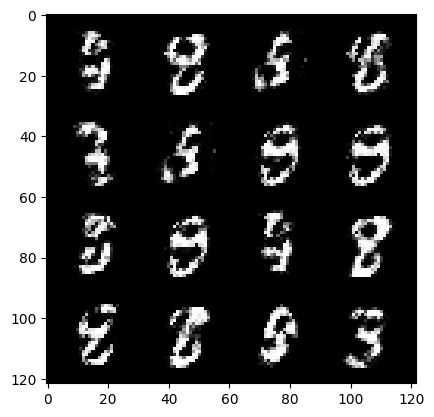

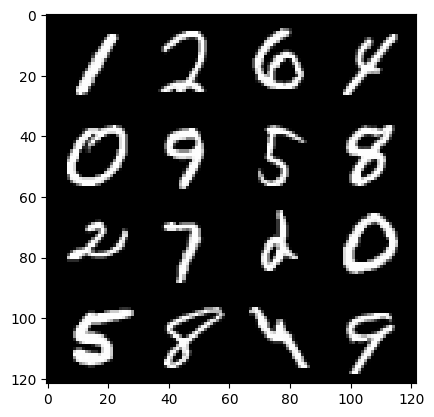

64: step 30300 / Gen loss: 4.3378393856684365 / Disc loss: 0.09799261300514145


  0%|          | 0/469 [00:00<?, ?it/s]

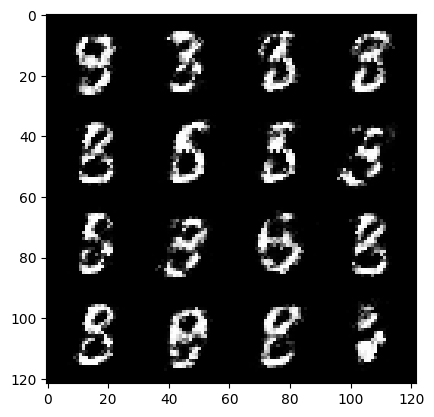

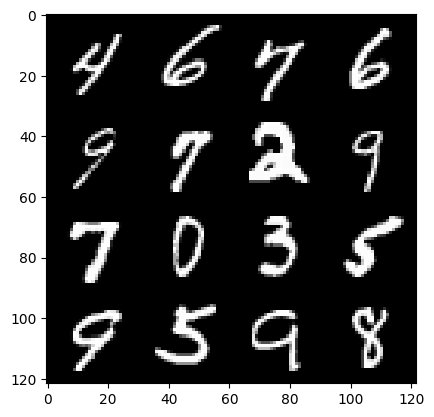

65: step 30600 / Gen loss: 4.556934531529745 / Disc loss: 0.08116832901413246


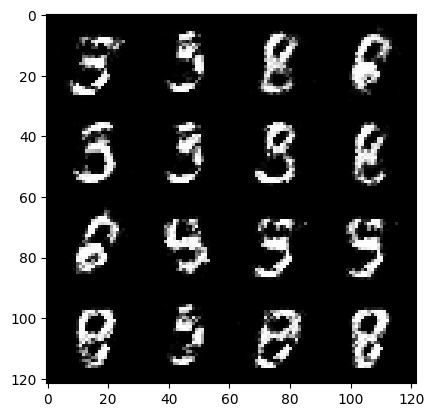

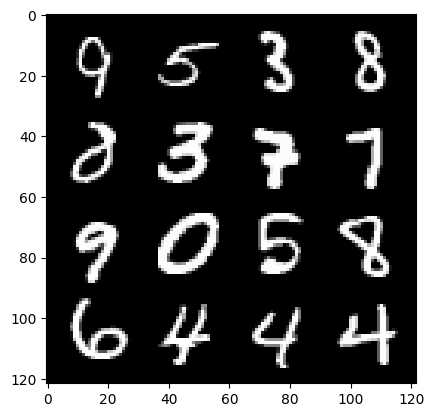

65: step 30900 / Gen loss: 4.337661877473198 / Disc loss: 0.09333339308698968


  0%|          | 0/469 [00:00<?, ?it/s]

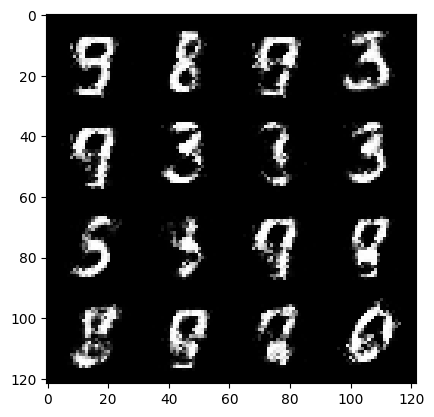

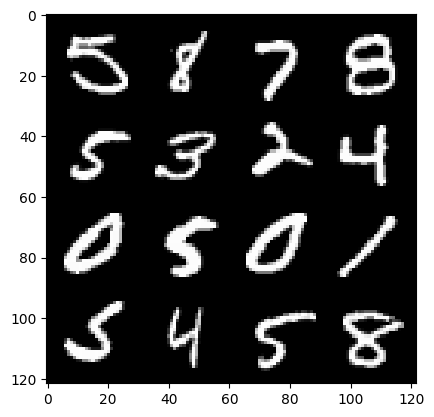

66: step 31200 / Gen loss: 4.185641237099963 / Disc loss: 0.09411717214932043


  0%|          | 0/469 [00:00<?, ?it/s]

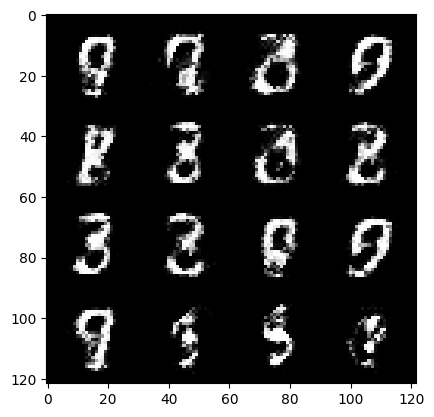

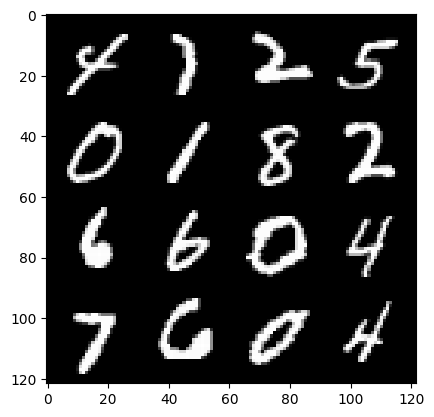

67: step 31500 / Gen loss: 4.2736966792742415 / Disc loss: 0.100453497680525


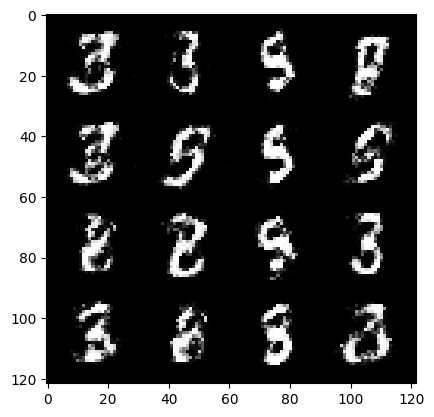

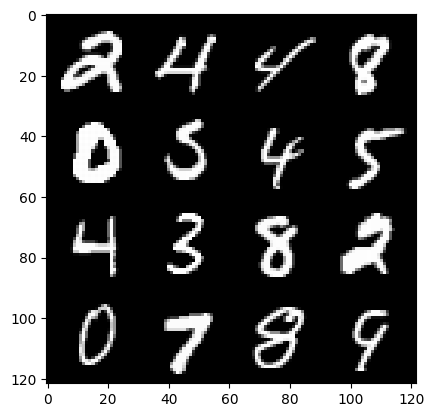

67: step 31800 / Gen loss: 4.321227893829345 / Disc loss: 0.09361280515789977


  0%|          | 0/469 [00:00<?, ?it/s]

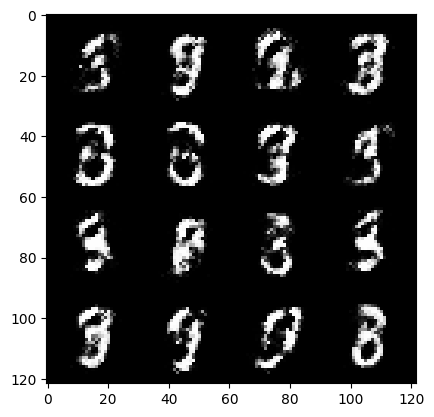

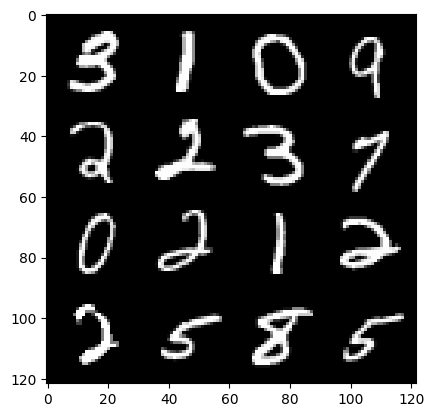

68: step 32100 / Gen loss: 4.333911859194439 / Disc loss: 0.09268055822700269


  0%|          | 0/469 [00:00<?, ?it/s]

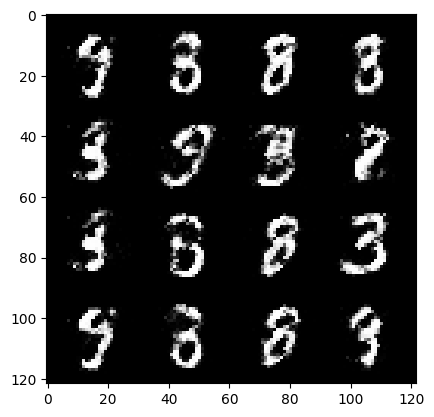

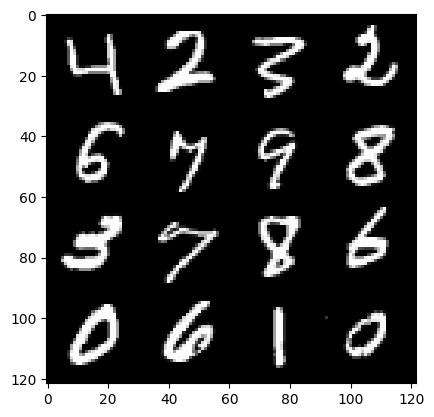

69: step 32400 / Gen loss: 4.408993874390917 / Disc loss: 0.07797493997961284


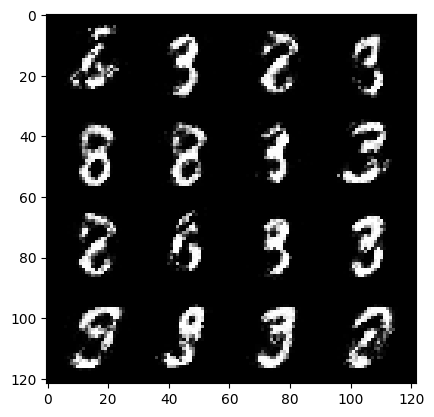

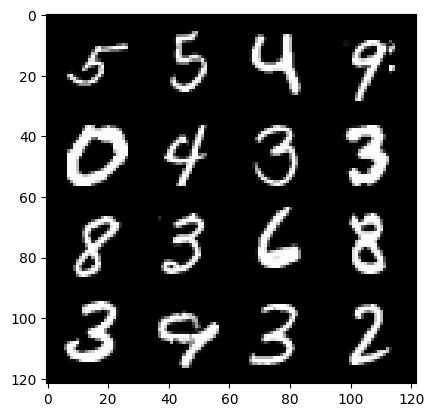

69: step 32700 / Gen loss: 4.653012885252633 / Disc loss: 0.08784568227827551


  0%|          | 0/469 [00:00<?, ?it/s]

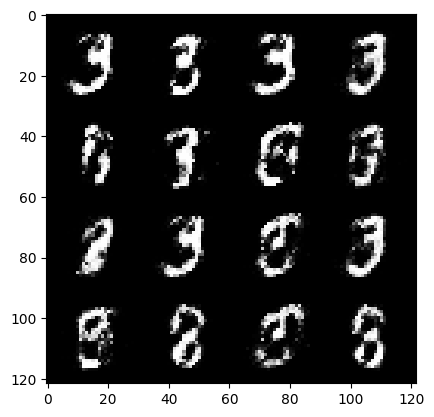

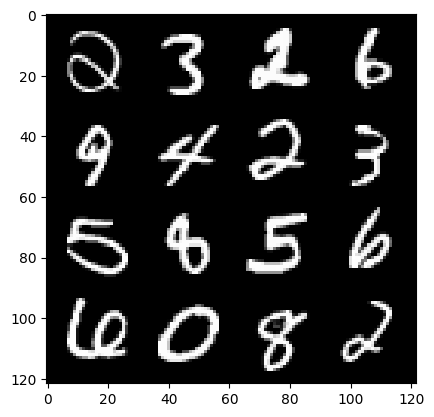

70: step 33000 / Gen loss: 4.57117997566859 / Disc loss: 0.10203185913463432


  0%|          | 0/469 [00:00<?, ?it/s]

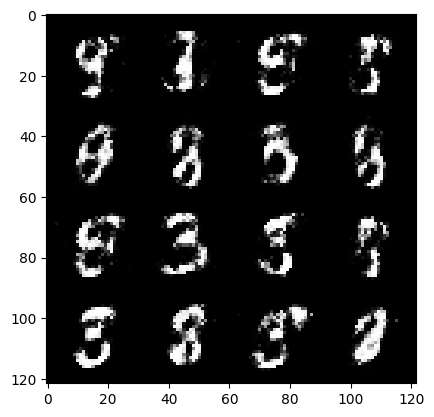

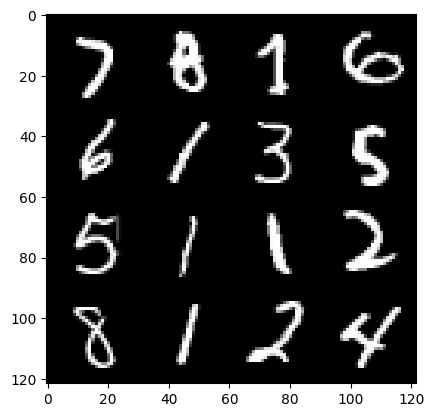

71: step 33300 / Gen loss: 4.37805431286494 / Disc loss: 0.12279487434774636


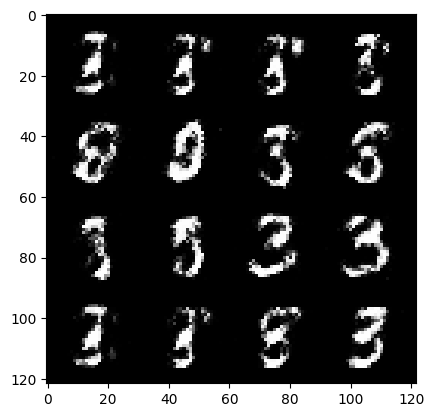

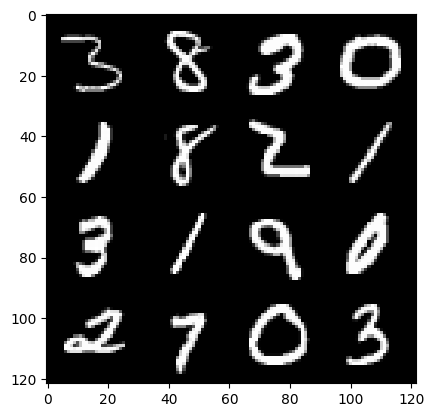

71: step 33600 / Gen loss: 4.05455065011978 / Disc loss: 0.11978527860095099


  0%|          | 0/469 [00:00<?, ?it/s]

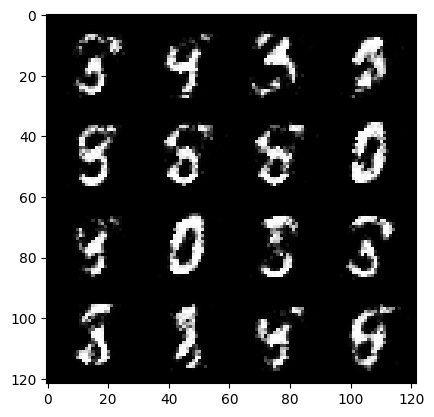

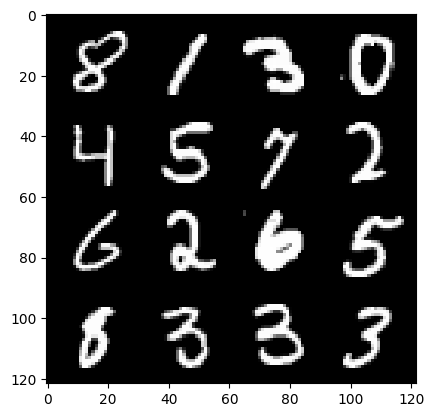

72: step 33900 / Gen loss: 4.479309455553692 / Disc loss: 0.09324271831661461


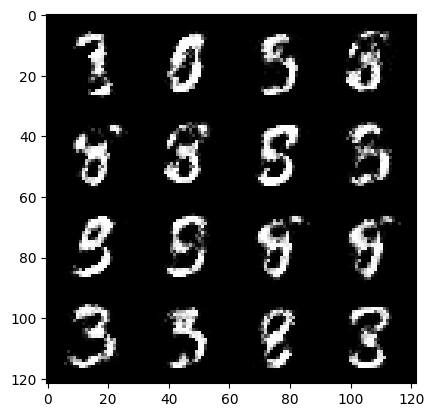

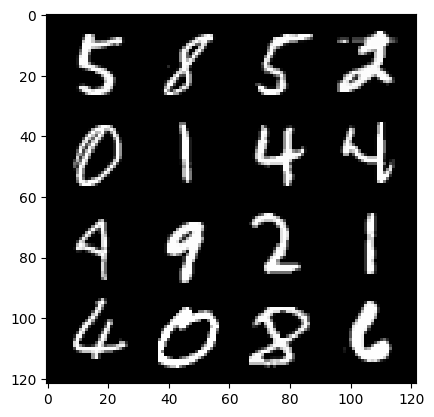

72: step 34200 / Gen loss: 4.44416237195333 / Disc loss: 0.10155736294885477


  0%|          | 0/469 [00:00<?, ?it/s]

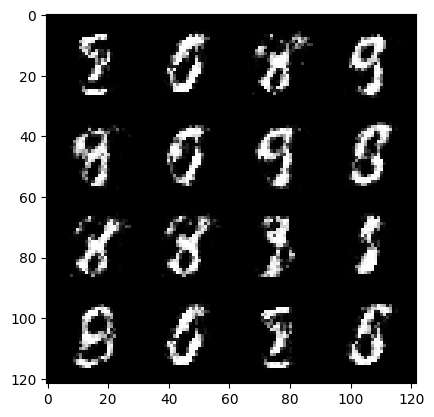

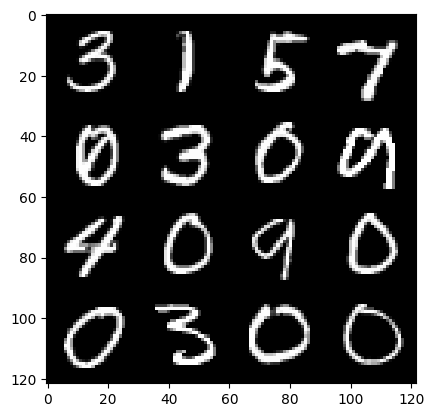

73: step 34500 / Gen loss: 4.194897104899091 / Disc loss: 0.1033844972153505


  0%|          | 0/469 [00:00<?, ?it/s]

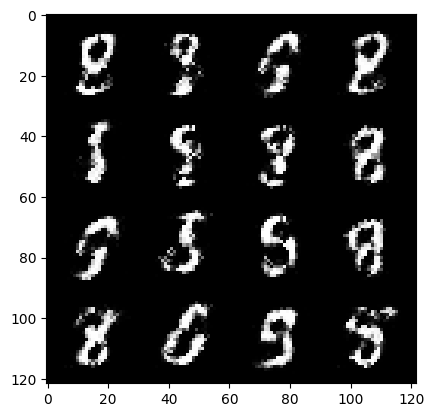

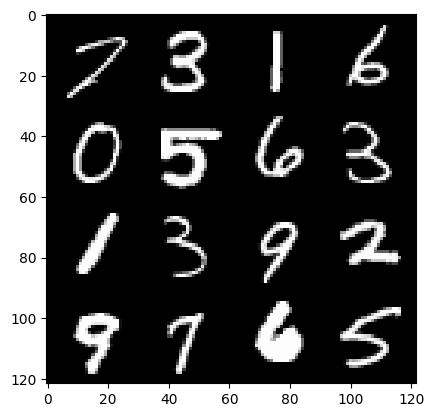

74: step 34800 / Gen loss: 4.261323224703471 / Disc loss: 0.1097885999828578


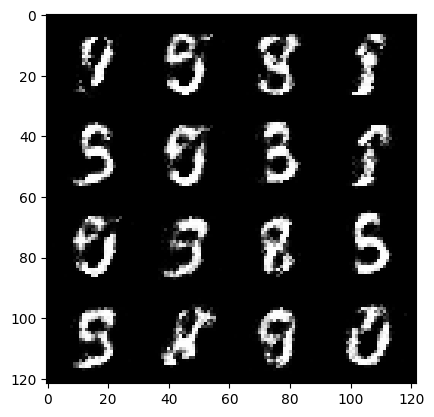

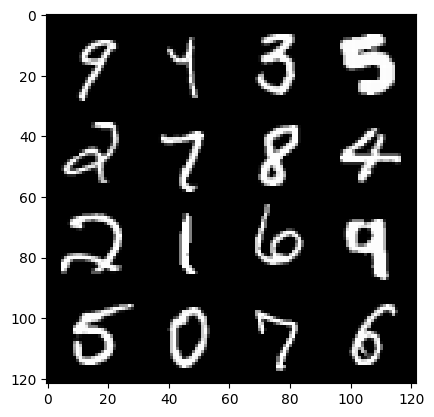

74: step 35100 / Gen loss: 4.193016969362895 / Disc loss: 0.1094781065732241


  0%|          | 0/469 [00:00<?, ?it/s]

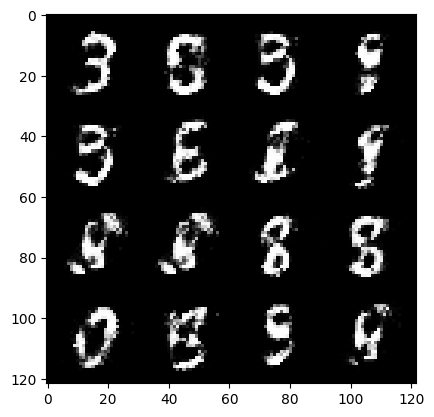

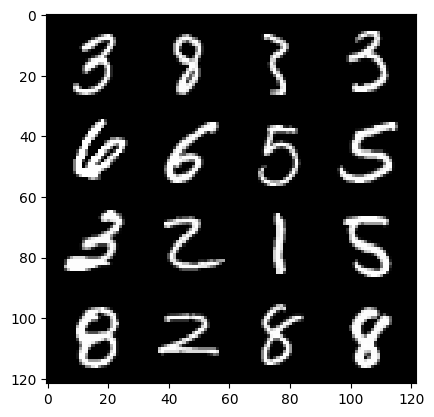

75: step 35400 / Gen loss: 3.9861412819226554 / Disc loss: 0.13199559293687338


  0%|          | 0/469 [00:00<?, ?it/s]

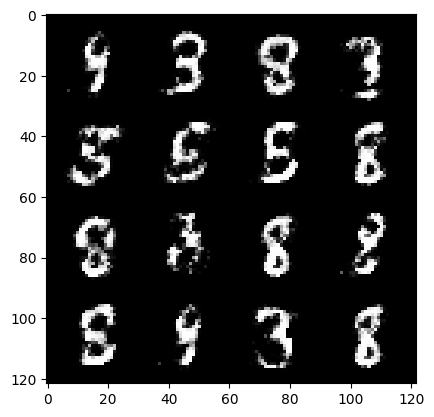

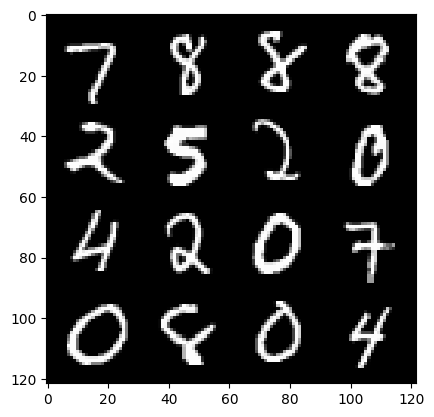

76: step 35700 / Gen loss: 4.074812750021614 / Disc loss: 0.12078552747766176


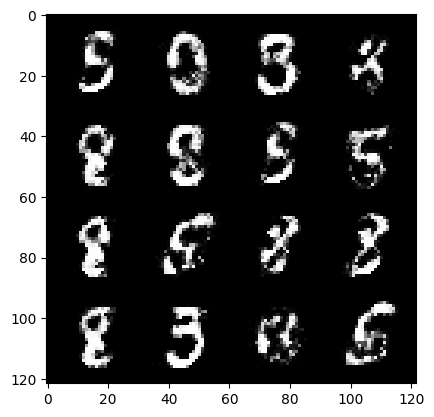

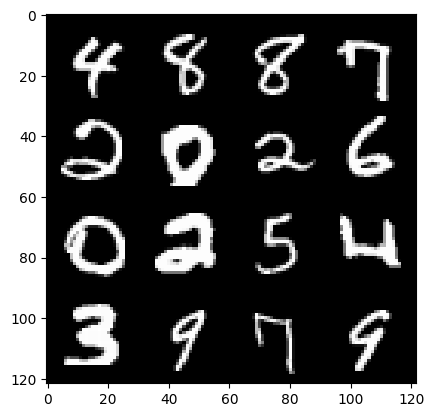

76: step 36000 / Gen loss: 4.016711925665537 / Disc loss: 0.11623733549068369


  0%|          | 0/469 [00:00<?, ?it/s]

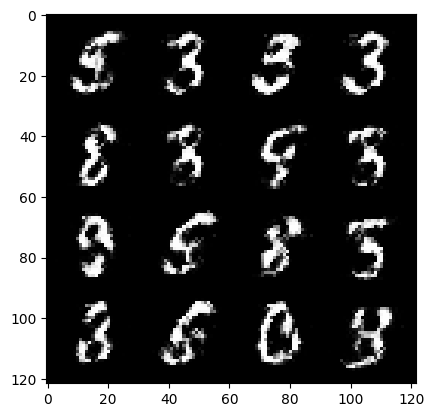

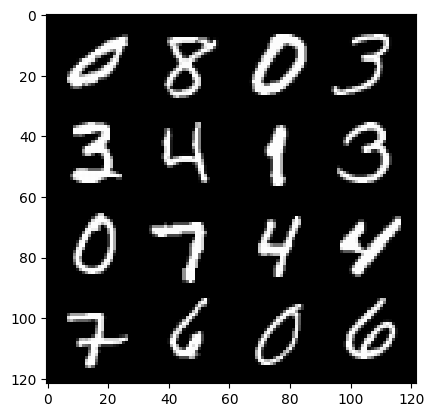

77: step 36300 / Gen loss: 3.87254674275716 / Disc loss: 0.13410416093965374


  0%|          | 0/469 [00:00<?, ?it/s]

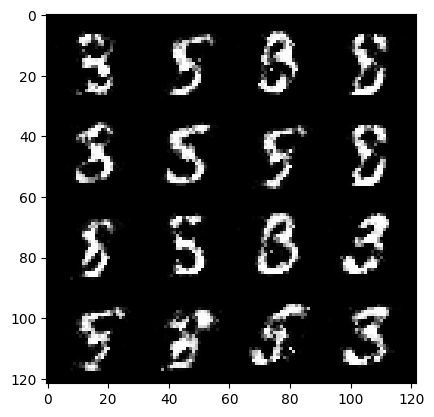

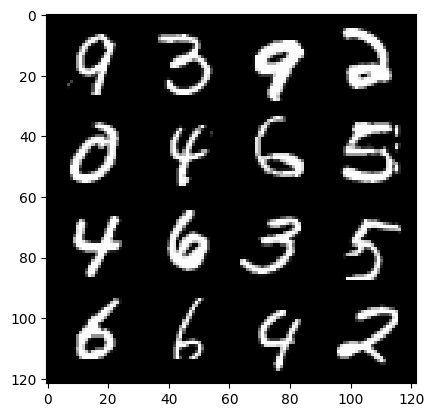

78: step 36600 / Gen loss: 3.8038629953066505 / Disc loss: 0.13311557264377666


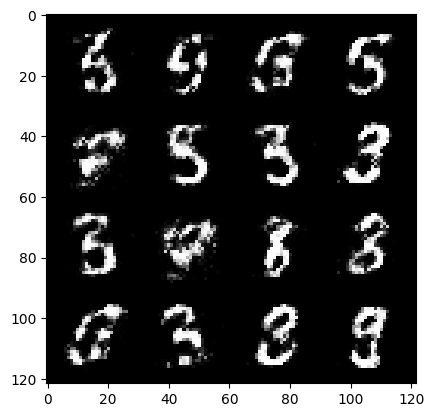

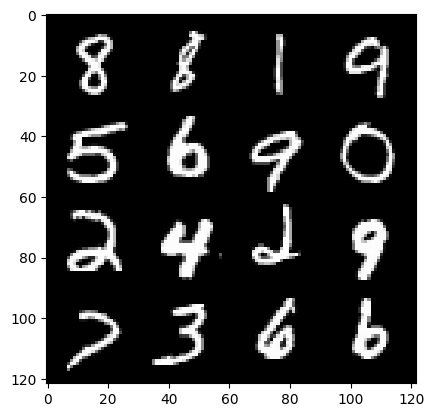

78: step 36900 / Gen loss: 3.9920699667930606 / Disc loss: 0.11744066121677554


  0%|          | 0/469 [00:00<?, ?it/s]

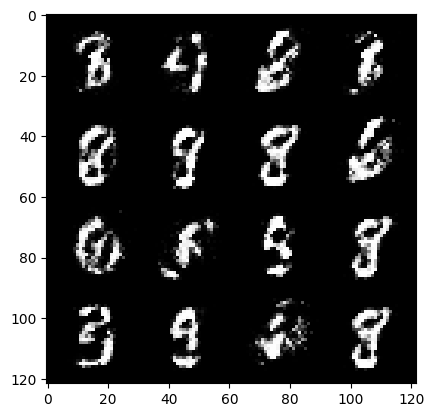

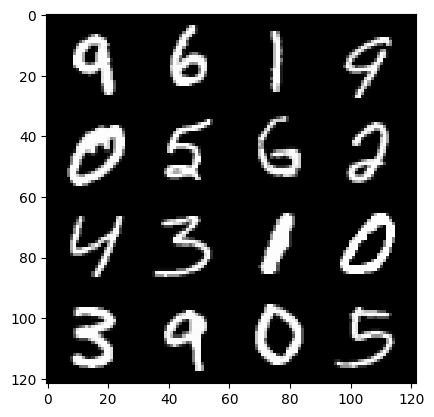

79: step 37200 / Gen loss: 4.048771071434017 / Disc loss: 0.14127753116190434


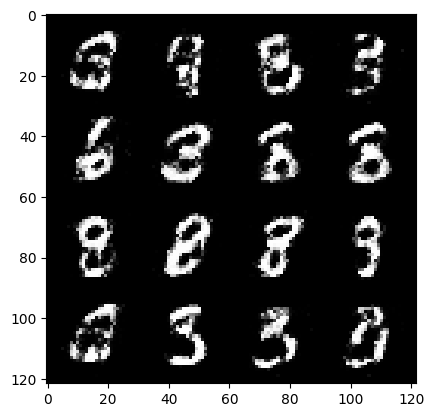

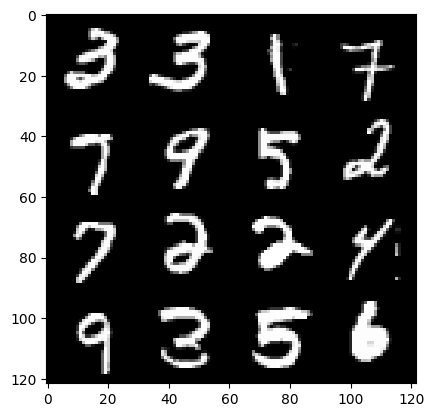

79: step 37500 / Gen loss: 4.084454867045083 / Disc loss: 0.12153409580389664


  0%|          | 0/469 [00:00<?, ?it/s]

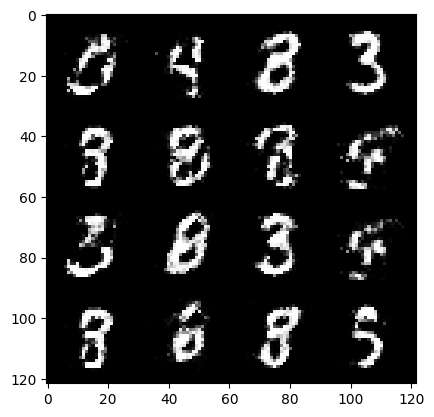

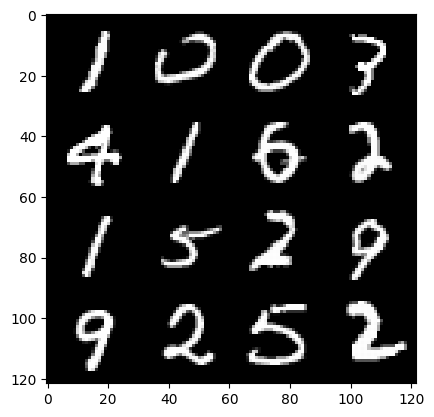

80: step 37800 / Gen loss: 4.066839735507965 / Disc loss: 0.12412665590643873


  0%|          | 0/469 [00:00<?, ?it/s]

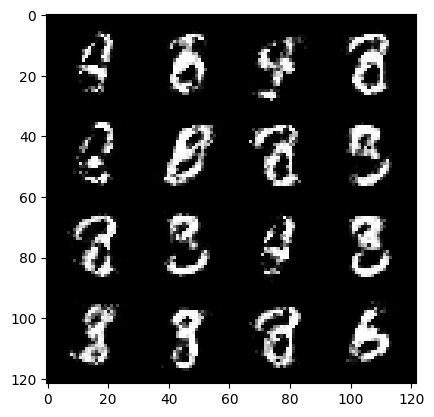

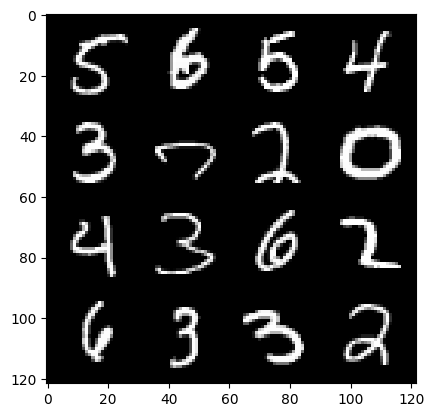

81: step 38100 / Gen loss: 3.8574889485041273 / Disc loss: 0.13297164025406047


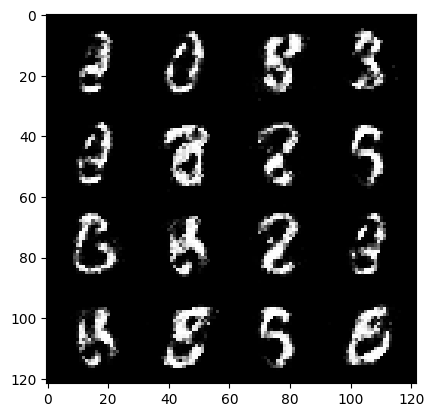

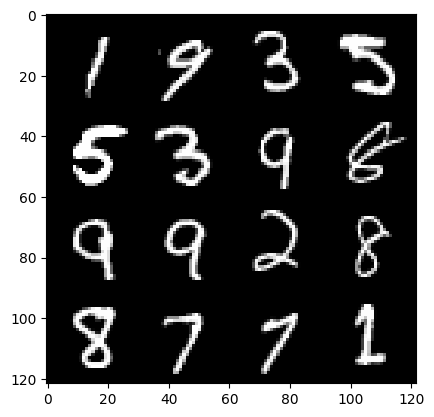

81: step 38400 / Gen loss: 3.858605585892994 / Disc loss: 0.1148214014495412


  0%|          | 0/469 [00:00<?, ?it/s]

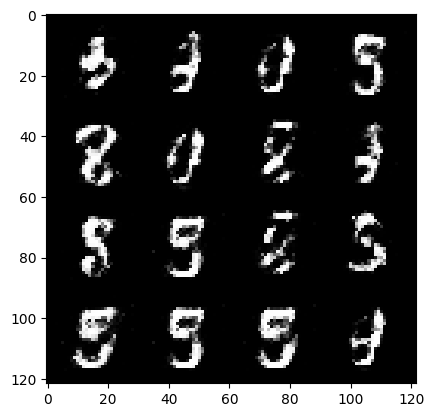

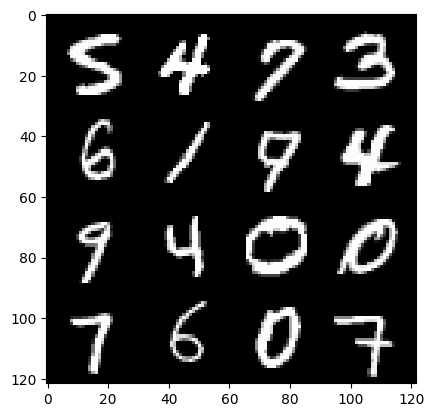

82: step 38700 / Gen loss: 3.869788623650868 / Disc loss: 0.11847292836755517


  0%|          | 0/469 [00:00<?, ?it/s]

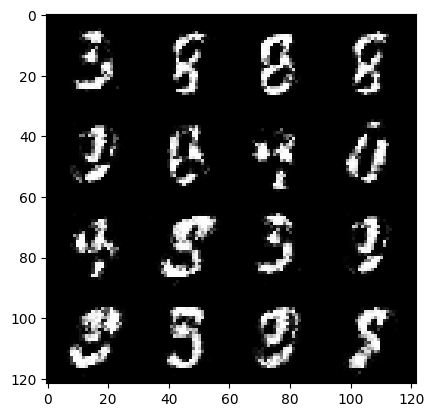

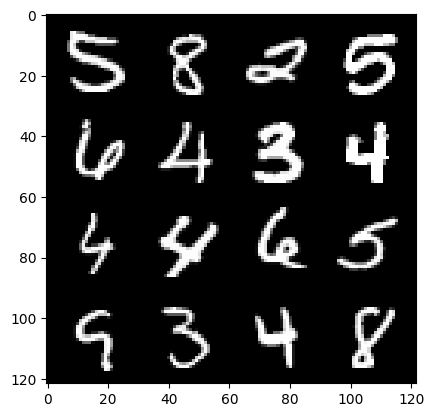

83: step 39000 / Gen loss: 3.864402389526368 / Disc loss: 0.13423159455259648


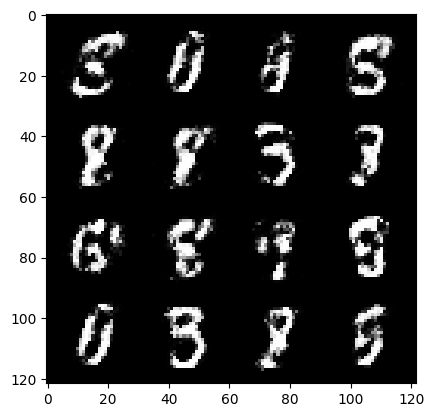

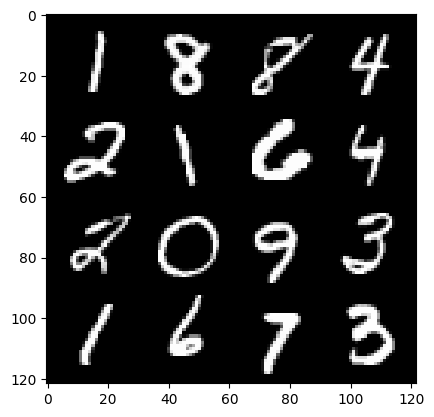

83: step 39300 / Gen loss: 4.055357999006909 / Disc loss: 0.14176703654229644


  0%|          | 0/469 [00:00<?, ?it/s]

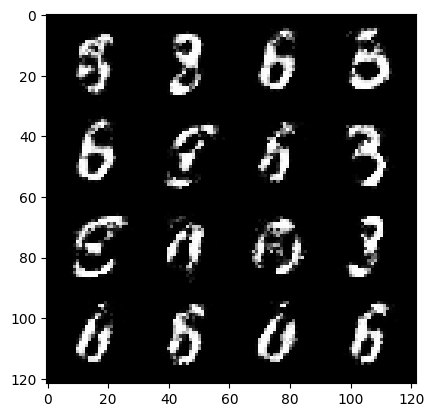

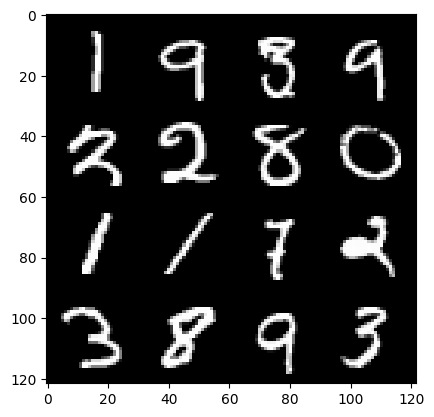

84: step 39600 / Gen loss: 3.872390906016031 / Disc loss: 0.14607082646340128


  0%|          | 0/469 [00:00<?, ?it/s]

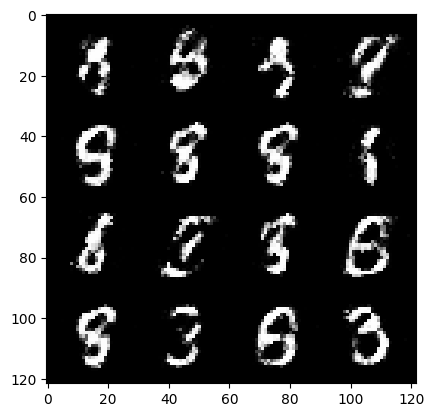

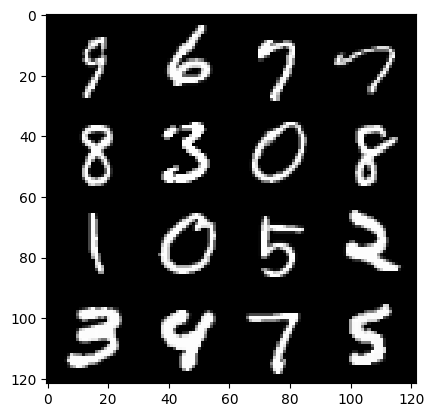

85: step 39900 / Gen loss: 3.8580122192700714 / Disc loss: 0.13008158003290493


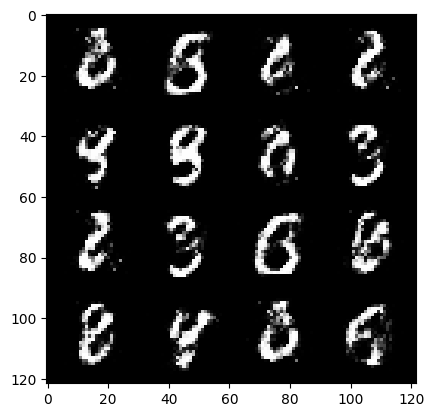

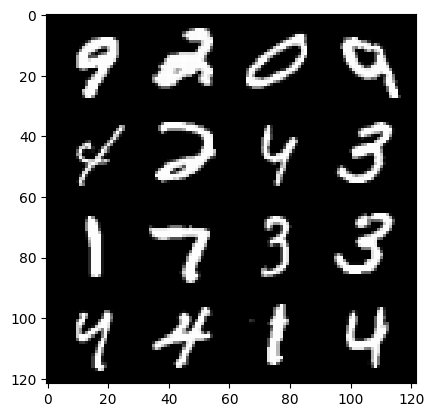

85: step 40200 / Gen loss: 3.83781818072001 / Disc loss: 0.13832289961477126


  0%|          | 0/469 [00:00<?, ?it/s]

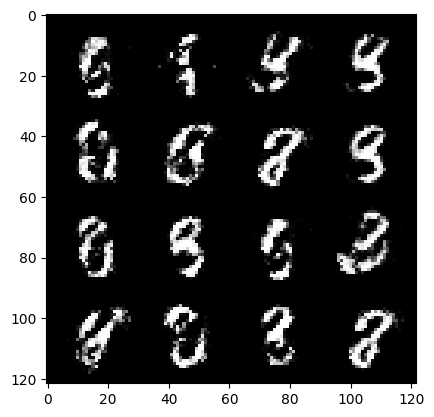

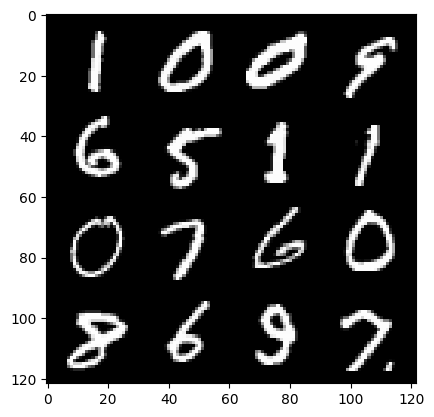

86: step 40500 / Gen loss: 3.9543559996287025 / Disc loss: 0.12538846460481481


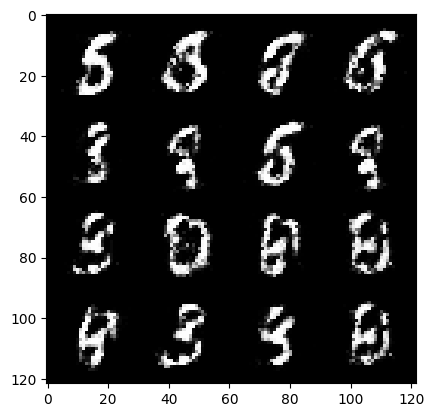

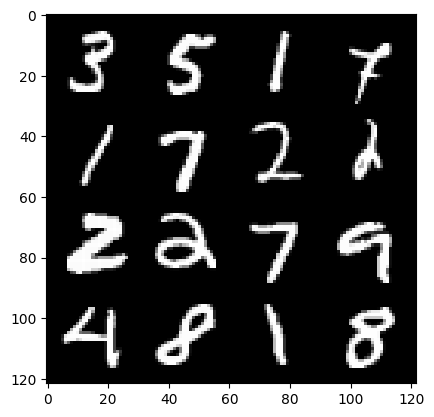

86: step 40800 / Gen loss: 3.9452139854431154 / Disc loss: 0.13804240576922897


  0%|          | 0/469 [00:00<?, ?it/s]

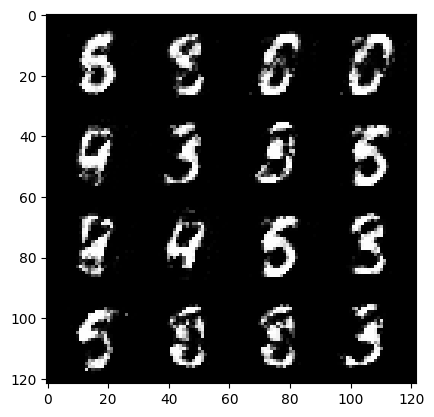

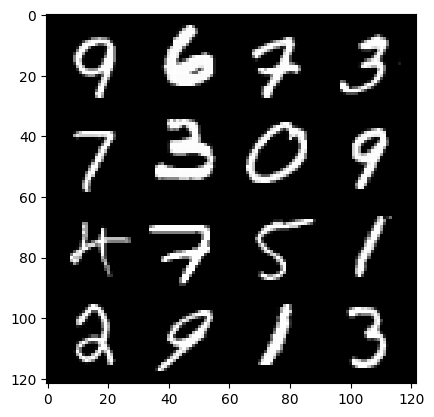

87: step 41100 / Gen loss: 3.8530268176396674 / Disc loss: 0.13121381568411988


  0%|          | 0/469 [00:00<?, ?it/s]

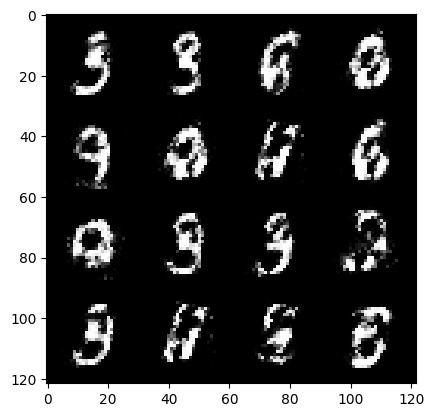

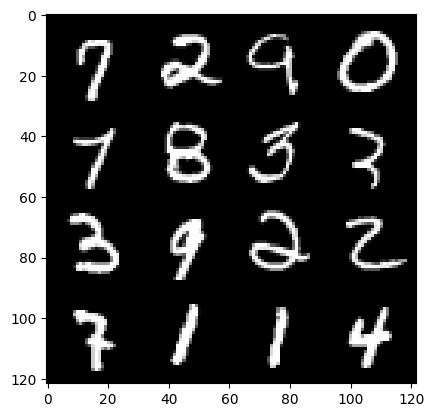

88: step 41400 / Gen loss: 3.7705162970225037 / Disc loss: 0.14495928068955735


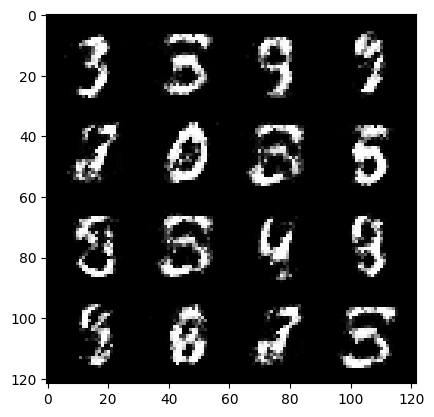

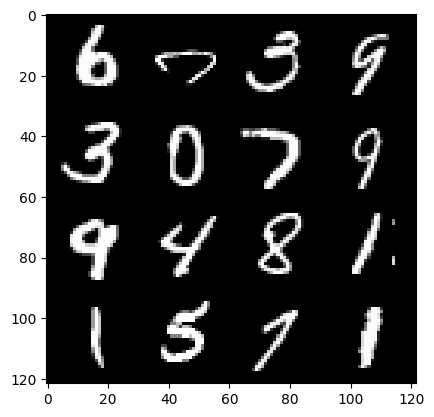

88: step 41700 / Gen loss: 3.7560963900883984 / Disc loss: 0.15649890006830278


  0%|          | 0/469 [00:00<?, ?it/s]

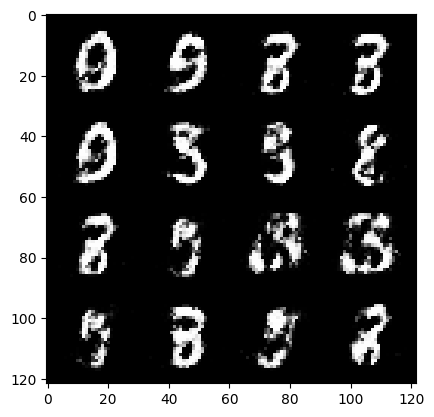

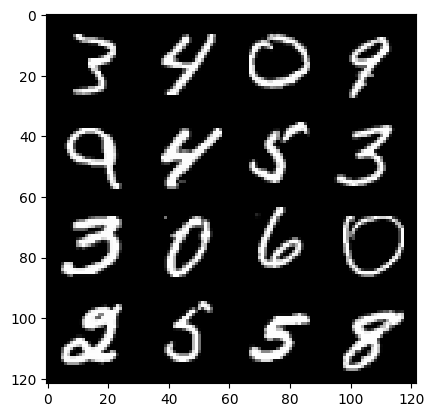

89: step 42000 / Gen loss: 3.5946650250752774 / Disc loss: 0.16018899217247973


  0%|          | 0/469 [00:00<?, ?it/s]

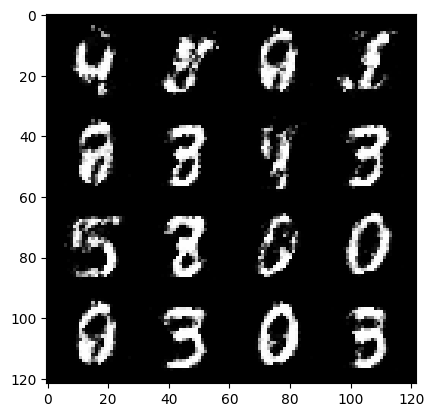

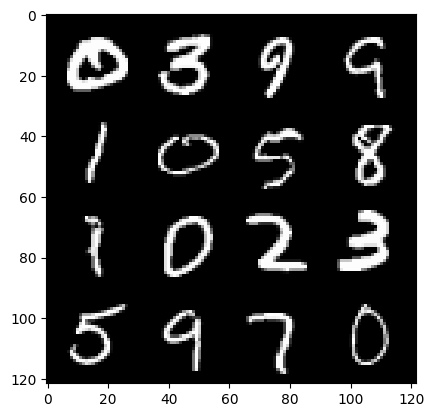

90: step 42300 / Gen loss: 3.6530501071612047 / Disc loss: 0.15709168958167238


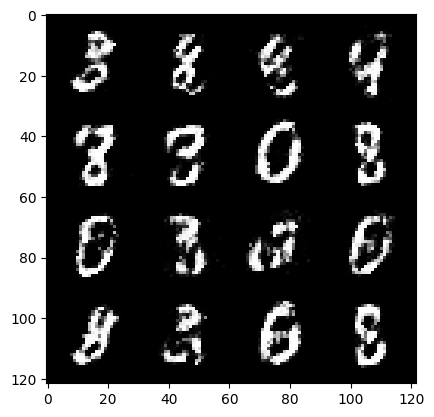

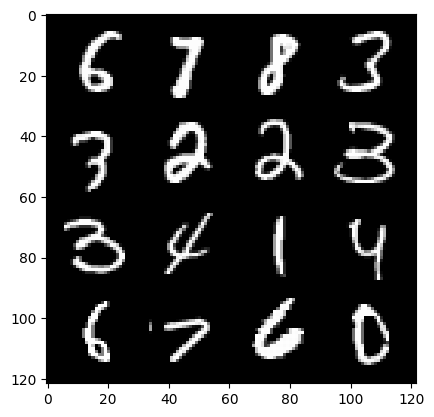

90: step 42600 / Gen loss: 3.6789077671368937 / Disc loss: 0.15777703337371357


  0%|          | 0/469 [00:00<?, ?it/s]

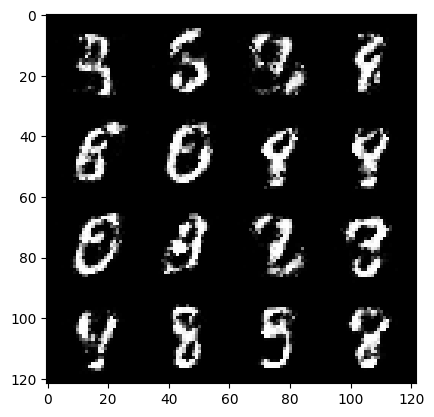

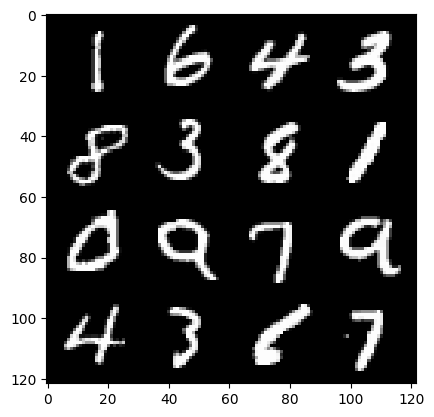

91: step 42900 / Gen loss: 3.5278869374593116 / Disc loss: 0.17759143821895118


  0%|          | 0/469 [00:00<?, ?it/s]

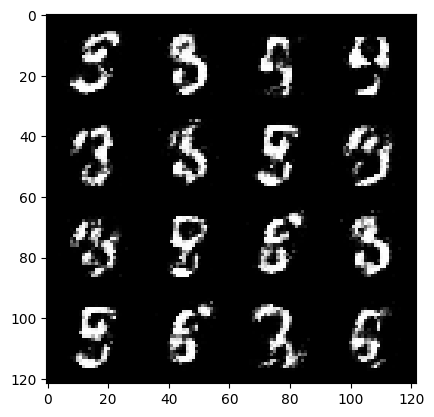

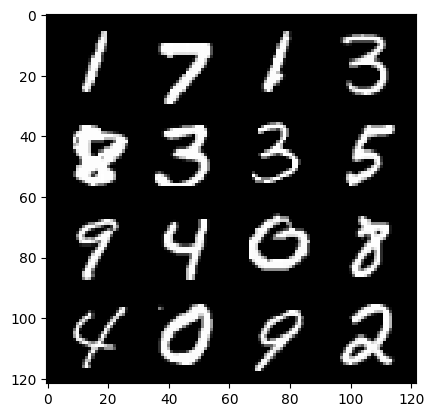

92: step 43200 / Gen loss: 3.541581164995831 / Disc loss: 0.16058101308842493


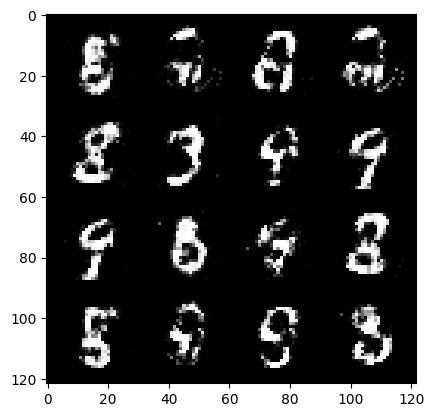

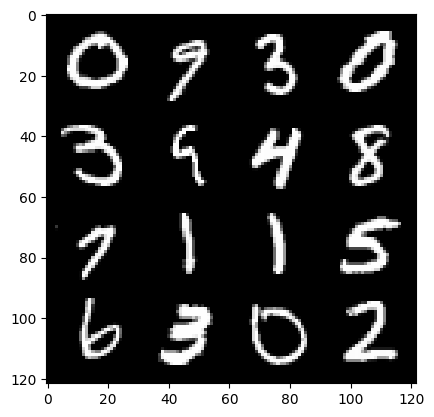

92: step 43500 / Gen loss: 3.564107271830239 / Disc loss: 0.159707552343607


  0%|          | 0/469 [00:00<?, ?it/s]

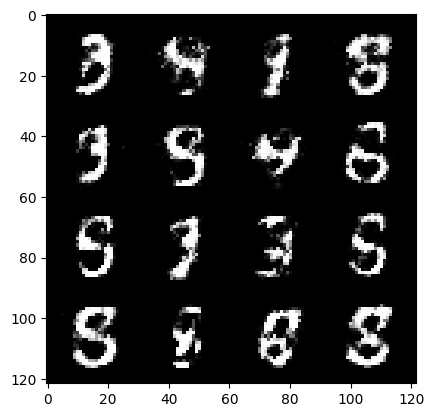

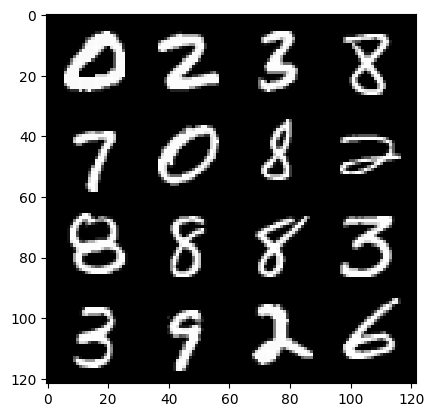

93: step 43800 / Gen loss: 3.596162692705789 / Disc loss: 0.15229110399882


  0%|          | 0/469 [00:00<?, ?it/s]

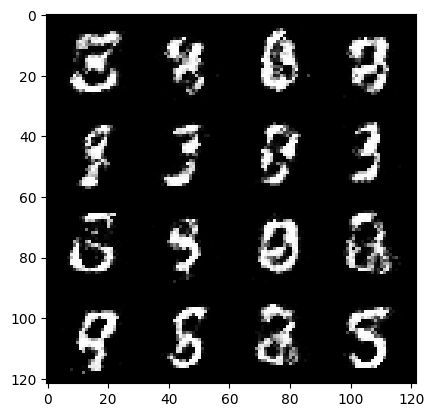

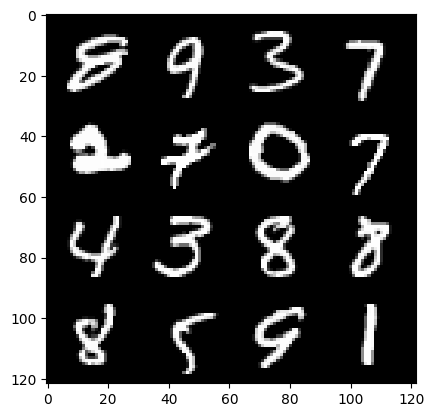

94: step 44100 / Gen loss: 3.7169269029299414 / Disc loss: 0.13705588420232134


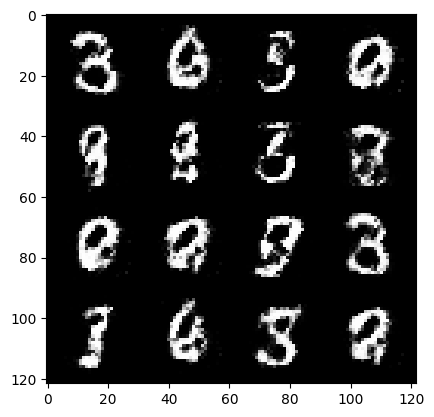

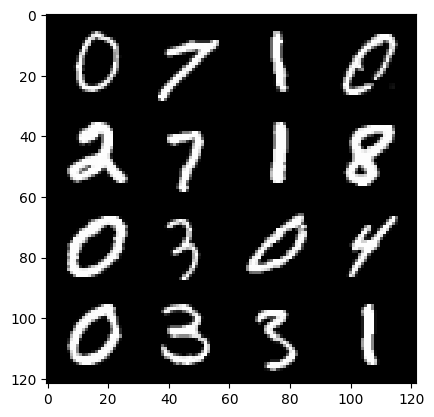

94: step 44400 / Gen loss: 3.455724549293519 / Disc loss: 0.17059129563470668


  0%|          | 0/469 [00:00<?, ?it/s]

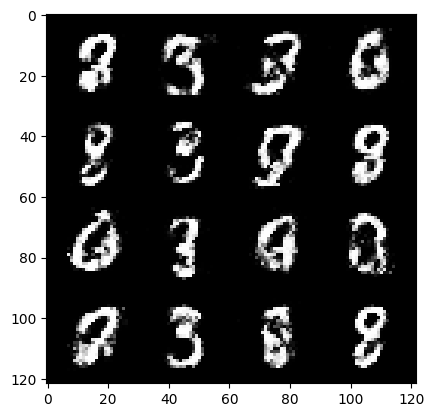

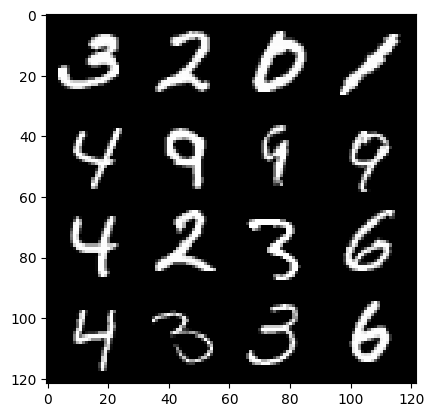

95: step 44700 / Gen loss: 3.496999084949494 / Disc loss: 0.15676554170747592


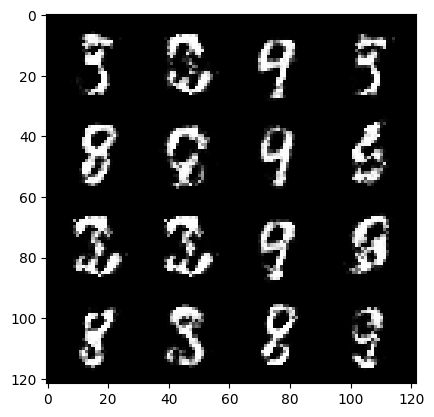

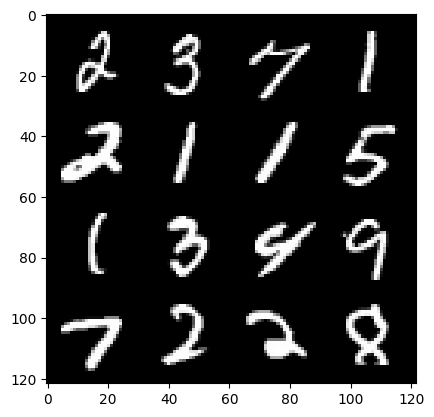

95: step 45000 / Gen loss: 3.518438253402708 / Disc loss: 0.15254309855401513


  0%|          | 0/469 [00:00<?, ?it/s]

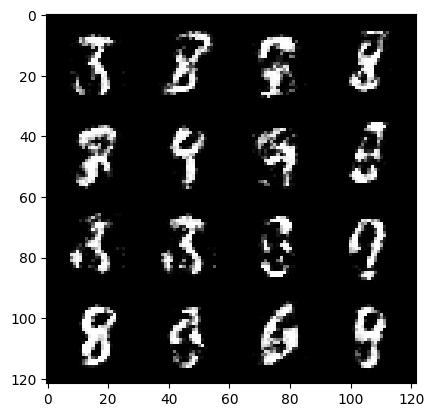

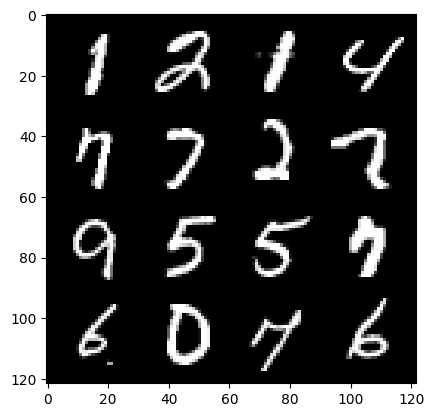

96: step 45300 / Gen loss: 3.341387943426768 / Disc loss: 0.16854069277644151


  0%|          | 0/469 [00:00<?, ?it/s]

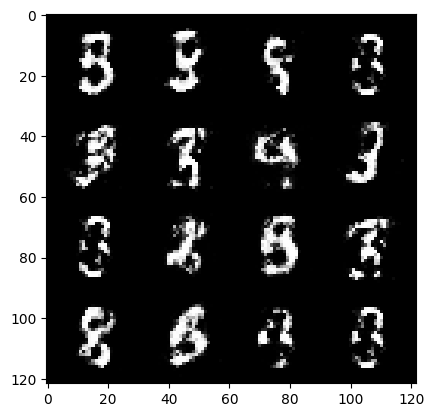

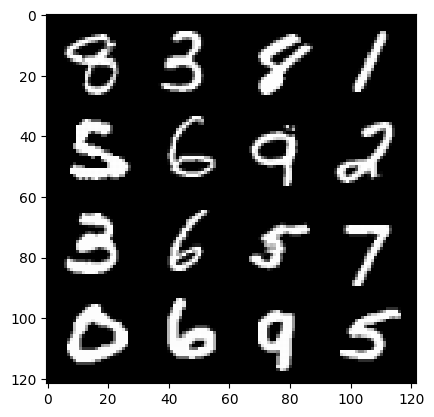

97: step 45600 / Gen loss: 3.377574318250021 / Disc loss: 0.18010440600415062


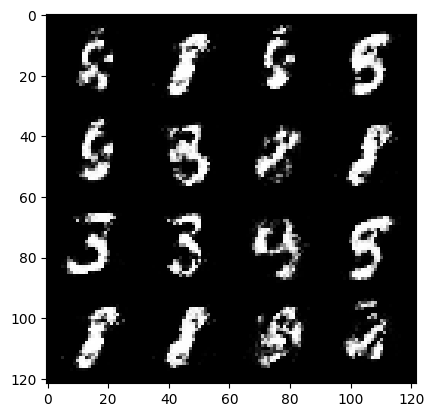

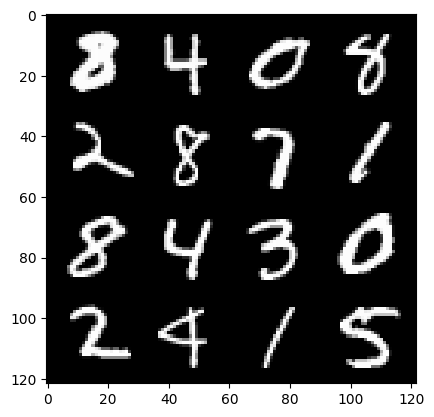

97: step 45900 / Gen loss: 3.3686402106285116 / Disc loss: 0.183639399036765


  0%|          | 0/469 [00:00<?, ?it/s]

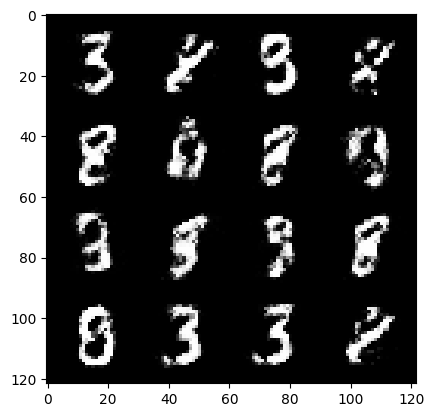

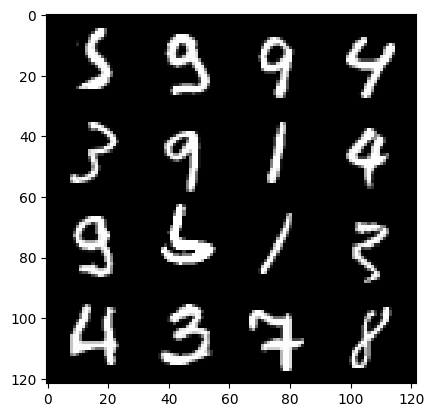

98: step 46200 / Gen loss: 3.4024006168047594 / Disc loss: 0.18053319332500303


  0%|          | 0/469 [00:00<?, ?it/s]

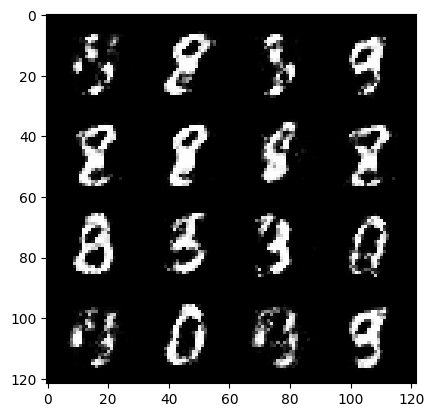

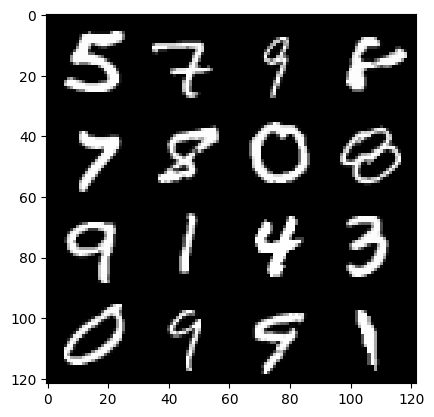

99: step 46500 / Gen loss: 3.2224521183967596 / Disc loss: 0.19421376287937153


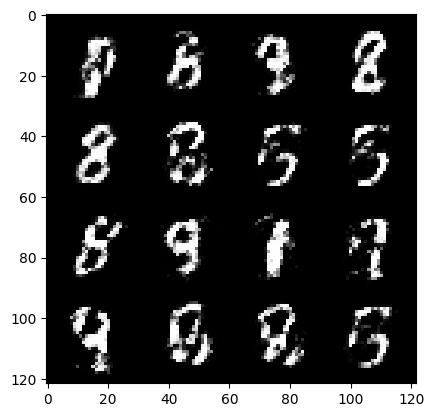

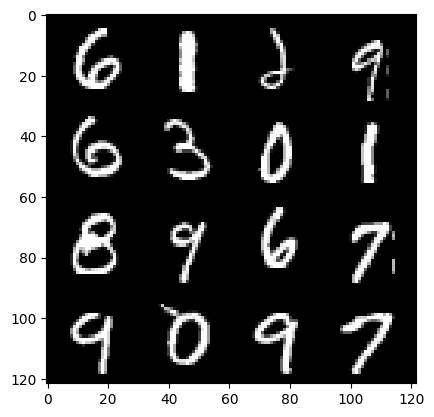

99: step 46800 / Gen loss: 3.3158041890462258 / Disc loss: 0.17205802003542592


  0%|          | 0/469 [00:00<?, ?it/s]

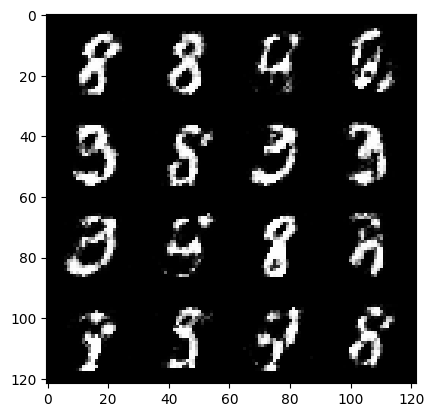

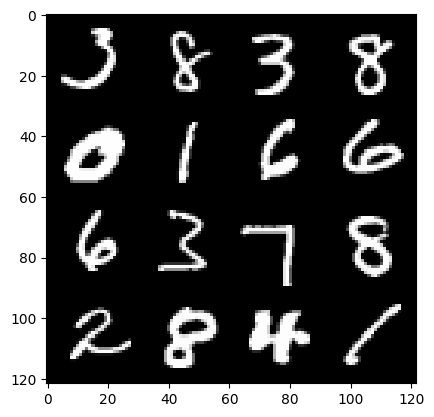

100: step 47100 / Gen loss: 3.4016515994071965 / Disc loss: 0.17450726372500258


  0%|          | 0/469 [00:00<?, ?it/s]

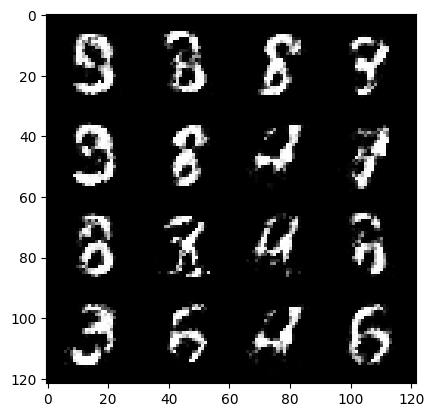

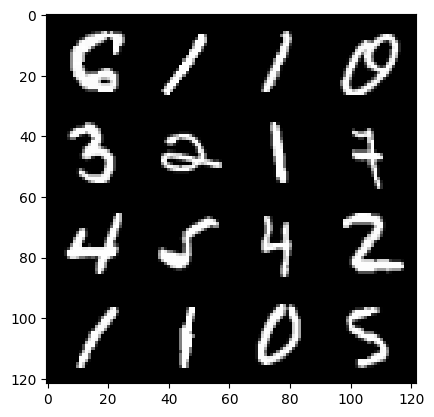

101: step 47400 / Gen loss: 3.3954792332649233 / Disc loss: 0.16705412449936077


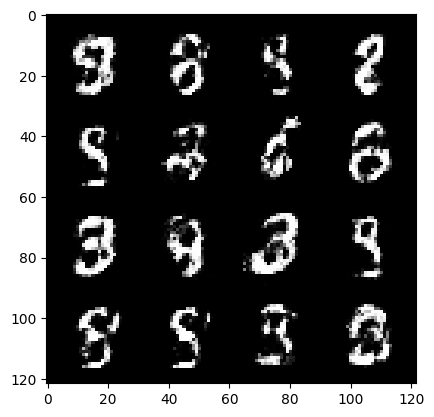

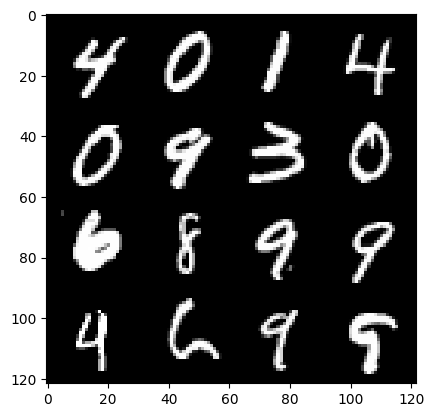

101: step 47700 / Gen loss: 3.2072854383786504 / Disc loss: 0.20019077864785986


  0%|          | 0/469 [00:00<?, ?it/s]

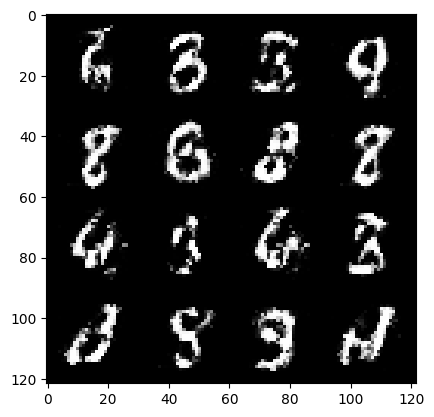

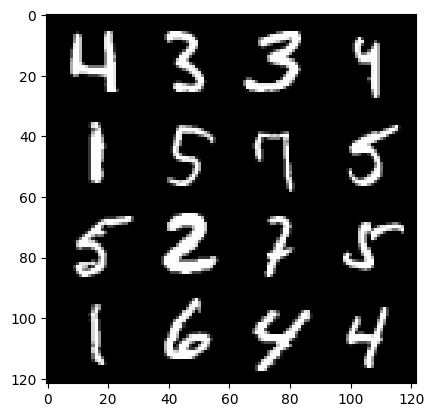

102: step 48000 / Gen loss: 3.3269626339276623 / Disc loss: 0.1903344064950943


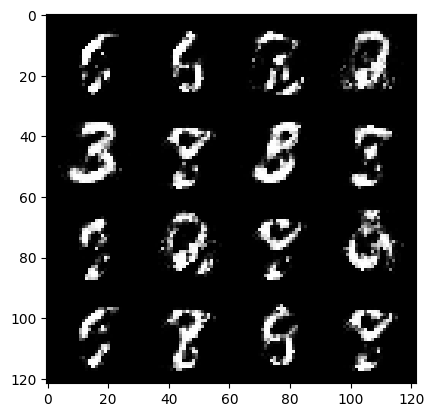

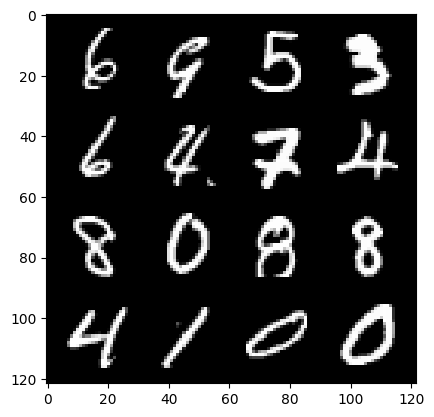

102: step 48300 / Gen loss: 3.2695998167991633 / Disc loss: 0.1928107327967882


  0%|          | 0/469 [00:00<?, ?it/s]

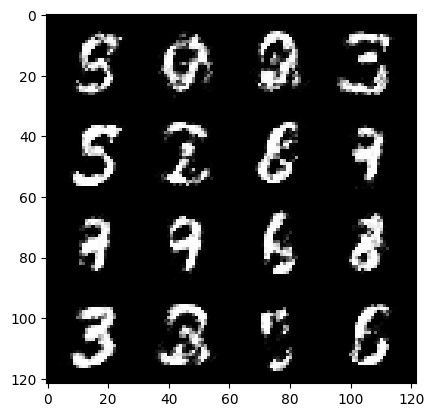

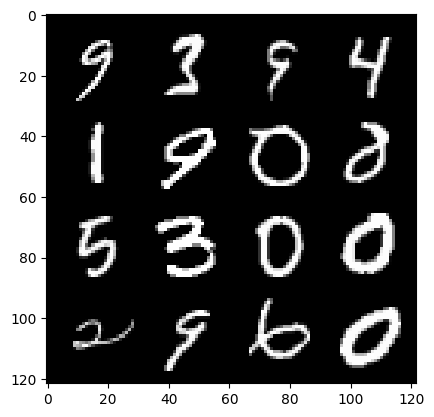

103: step 48600 / Gen loss: 3.197696784337361 / Disc loss: 0.1999283878008525


  0%|          | 0/469 [00:00<?, ?it/s]

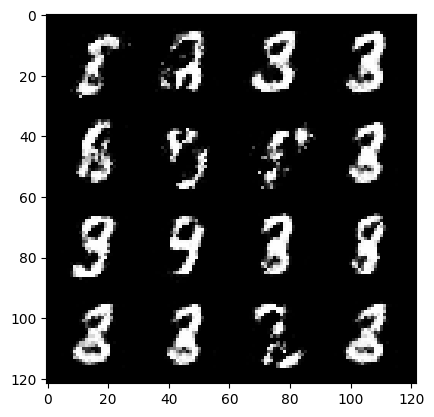

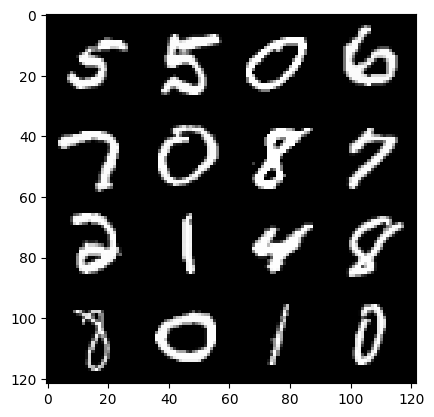

104: step 48900 / Gen loss: 3.160729410648347 / Disc loss: 0.20039666578173645


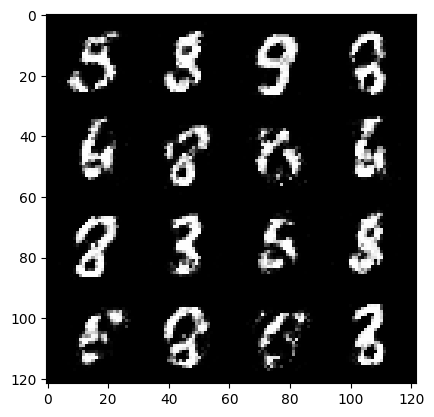

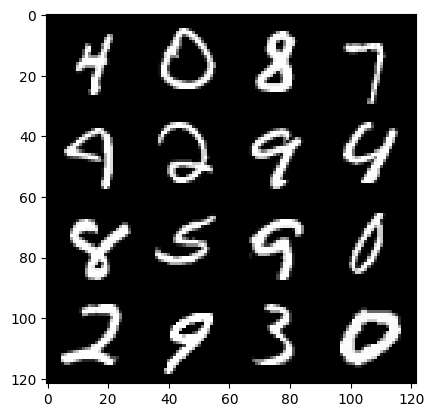

104: step 49200 / Gen loss: 3.218646078904471 / Disc loss: 0.20065356413523355


  0%|          | 0/469 [00:00<?, ?it/s]

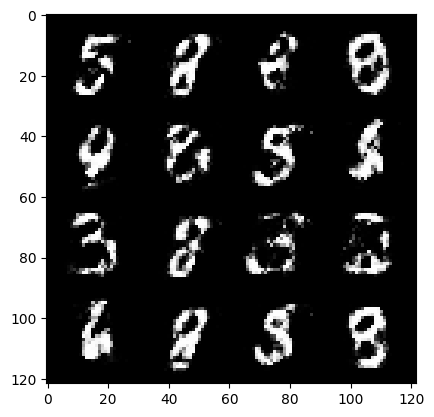

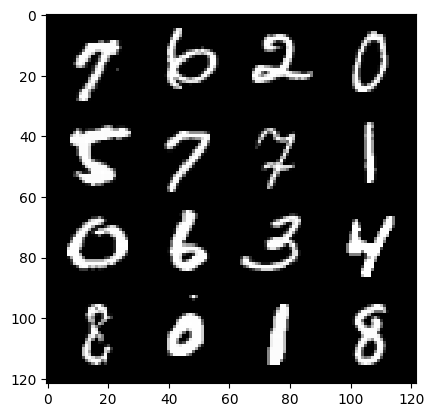

105: step 49500 / Gen loss: 3.27458187977473 / Disc loss: 0.1863214414566756


  0%|          | 0/469 [00:00<?, ?it/s]

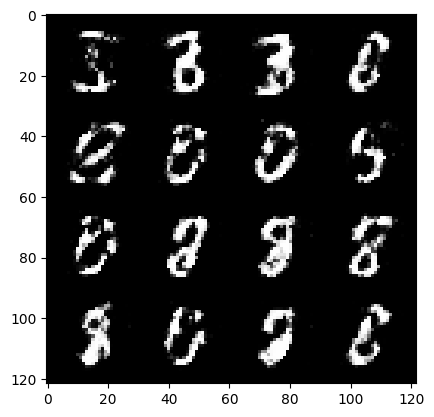

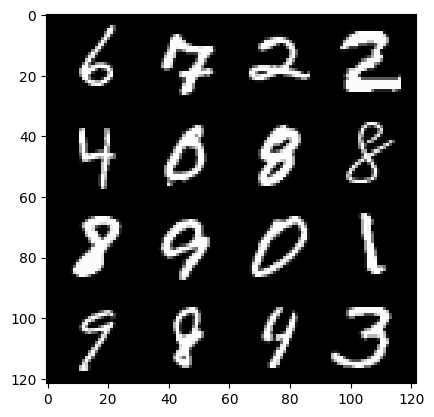

106: step 49800 / Gen loss: 3.2664276186625147 / Disc loss: 0.16903070305784548


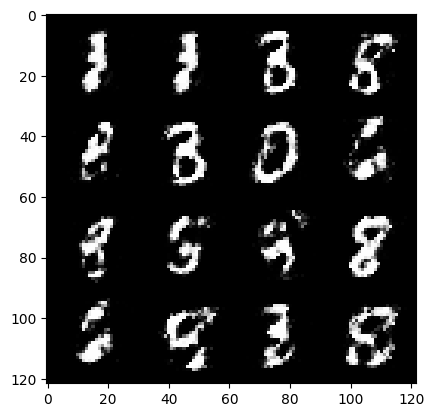

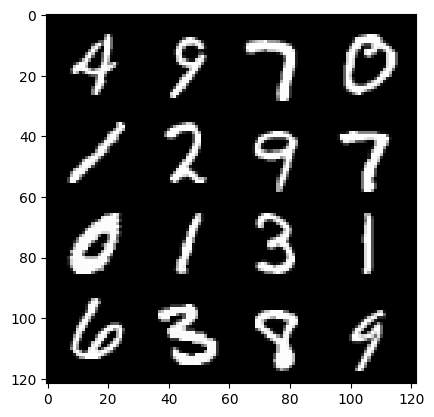

106: step 50100 / Gen loss: 3.1522590573628757 / Disc loss: 0.18353784846762822


  0%|          | 0/469 [00:00<?, ?it/s]

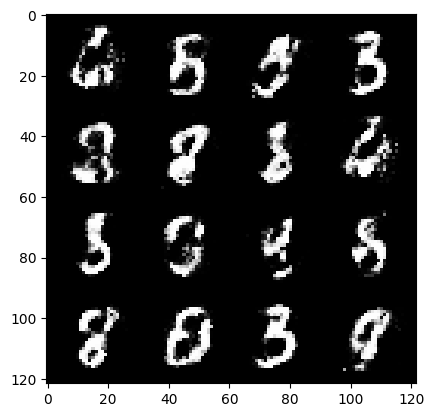

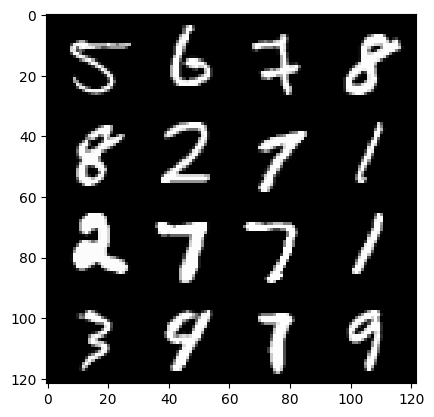

107: step 50400 / Gen loss: 3.3269005719820672 / Disc loss: 0.17418508723378176


  0%|          | 0/469 [00:00<?, ?it/s]

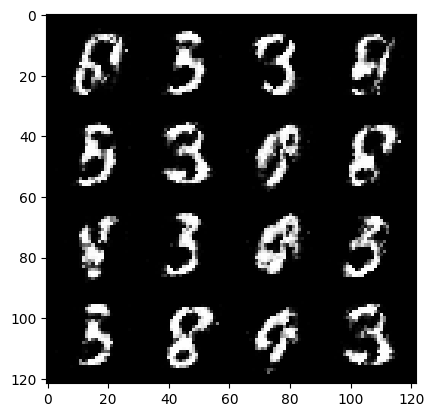

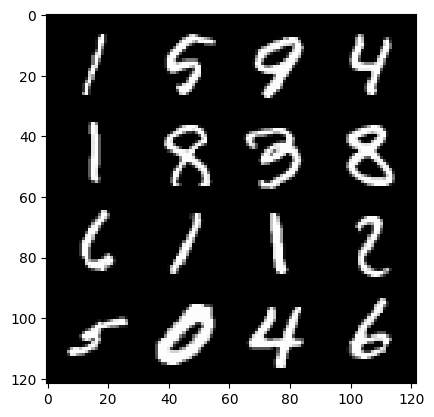

108: step 50700 / Gen loss: 3.0990956862767534 / Disc loss: 0.2025571556886037


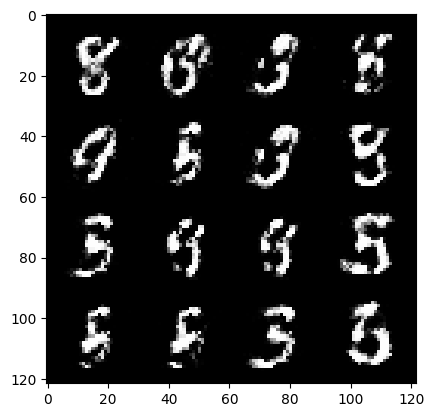

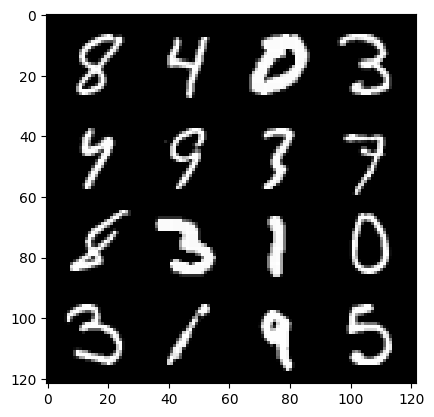

108: step 51000 / Gen loss: 3.0171153903007513 / Disc loss: 0.20262851585944486


  0%|          | 0/469 [00:00<?, ?it/s]

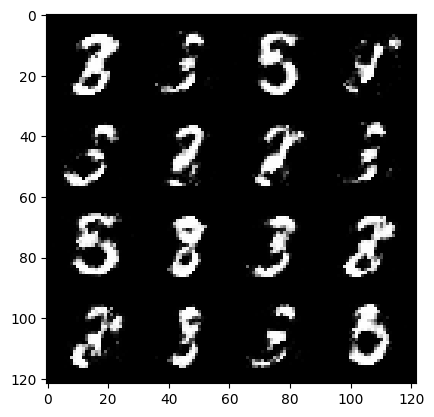

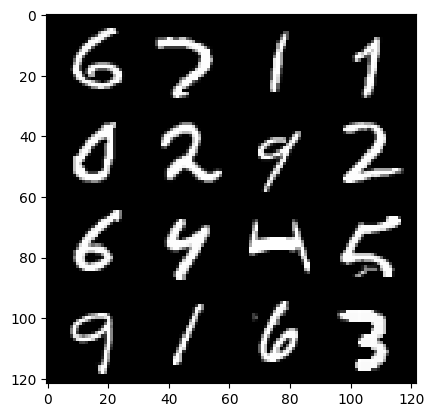

109: step 51300 / Gen loss: 3.107430651187897 / Disc loss: 0.1954256053517264


  0%|          | 0/469 [00:00<?, ?it/s]

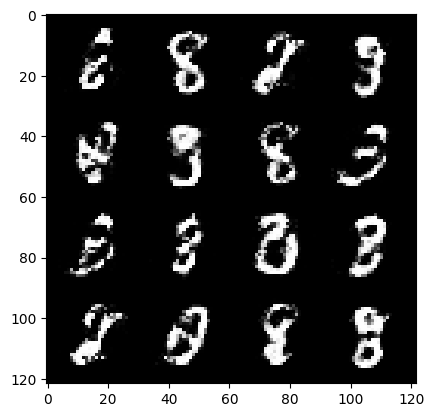

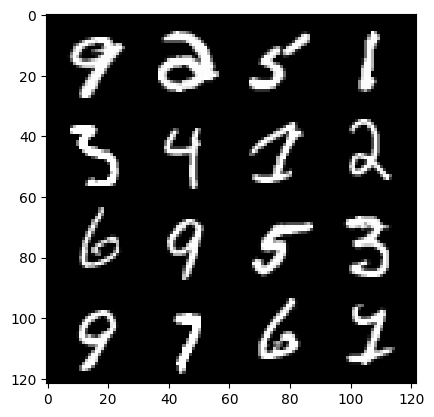

110: step 51600 / Gen loss: 3.200849816799166 / Disc loss: 0.18876873791217802


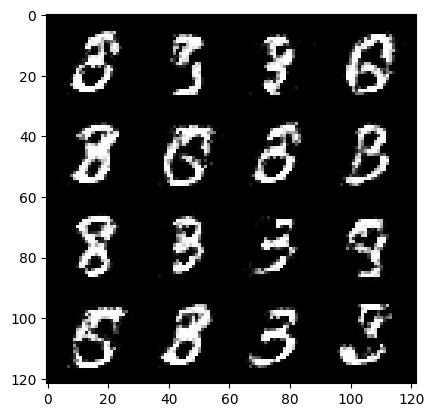

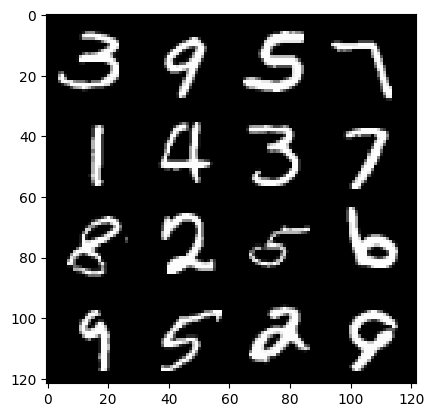

110: step 51900 / Gen loss: 3.0792700966199242 / Disc loss: 0.1995918234686054


  0%|          | 0/469 [00:00<?, ?it/s]

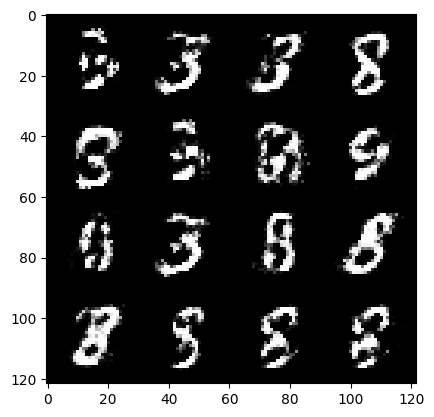

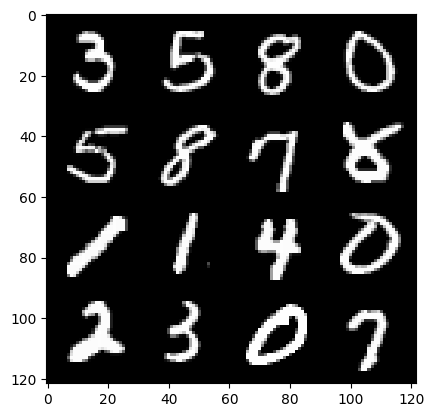

111: step 52200 / Gen loss: 3.0955423124631243 / Disc loss: 0.18564218784372016


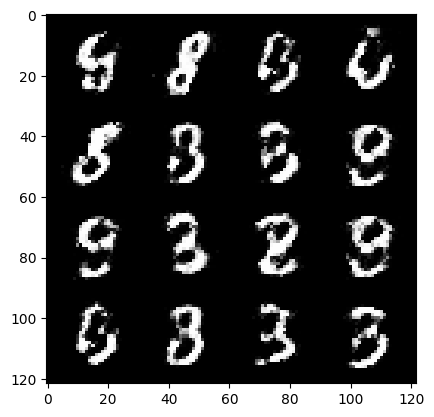

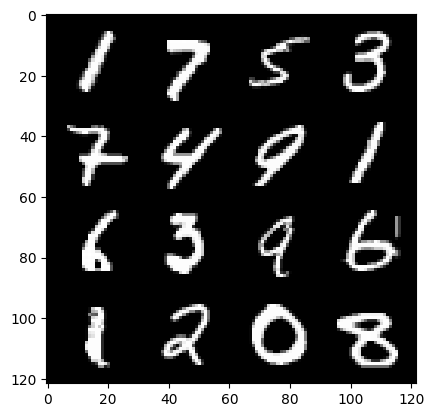

111: step 52500 / Gen loss: 3.1608053406079604 / Disc loss: 0.1884702369074027


  0%|          | 0/469 [00:00<?, ?it/s]

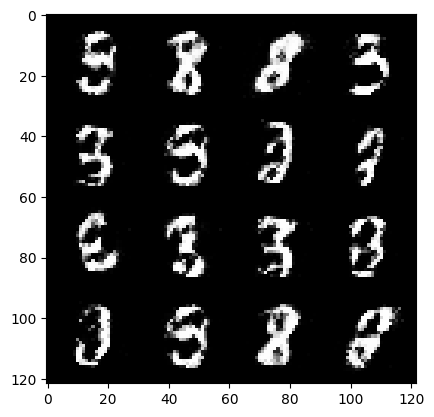

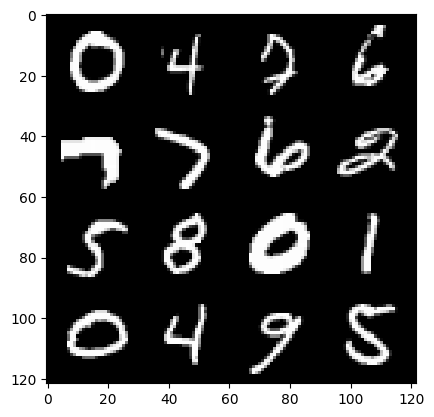

112: step 52800 / Gen loss: 3.222149902979532 / Disc loss: 0.17335937465230625


  0%|          | 0/469 [00:00<?, ?it/s]

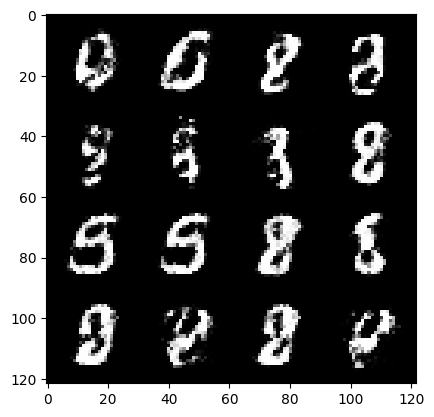

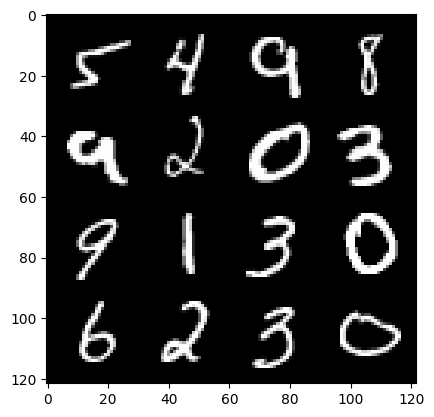

113: step 53100 / Gen loss: 3.2160562427838655 / Disc loss: 0.19212000725169995


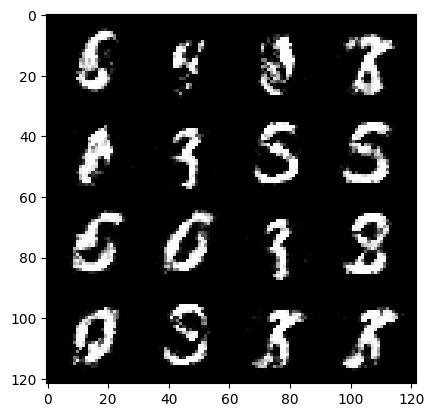

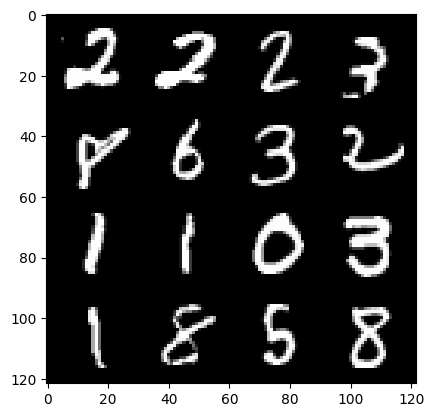

113: step 53400 / Gen loss: 3.082329747676848 / Disc loss: 0.1935803332924843


  0%|          | 0/469 [00:00<?, ?it/s]

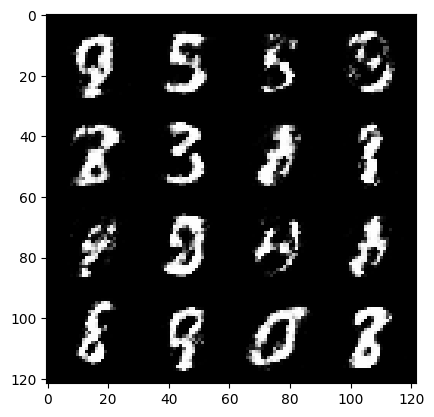

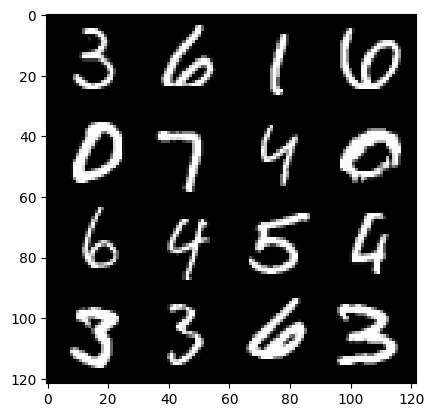

114: step 53700 / Gen loss: 3.02721739689509 / Disc loss: 0.18949237070977695


  0%|          | 0/469 [00:00<?, ?it/s]

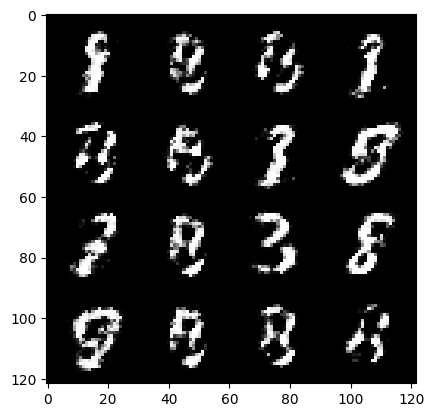

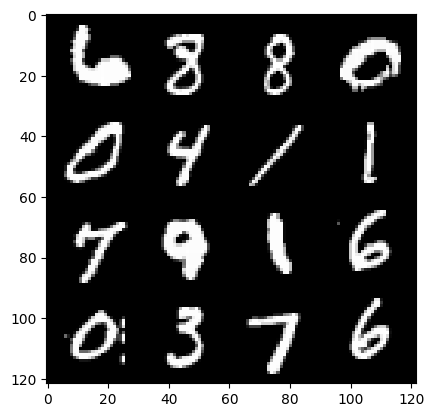

115: step 54000 / Gen loss: 3.0814092214902264 / Disc loss: 0.18519555665552628


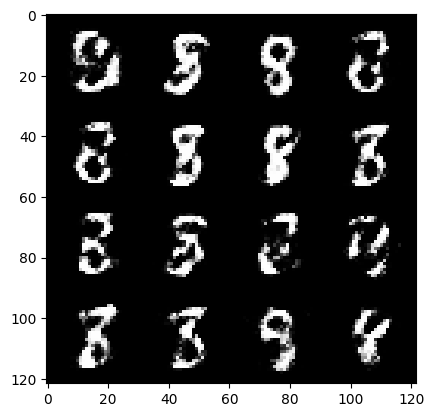

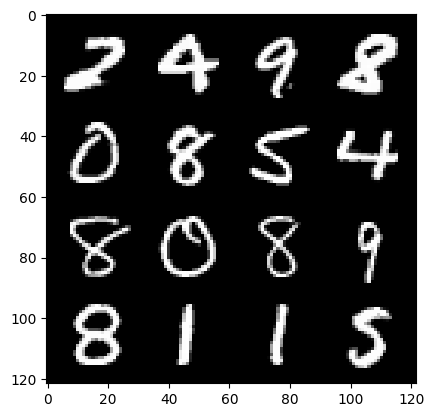

115: step 54300 / Gen loss: 3.0300838367144256 / Disc loss: 0.18739401062329616


  0%|          | 0/469 [00:00<?, ?it/s]

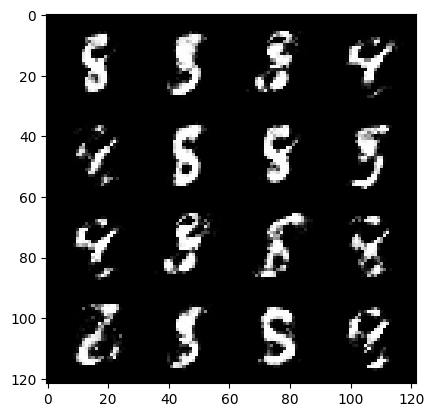

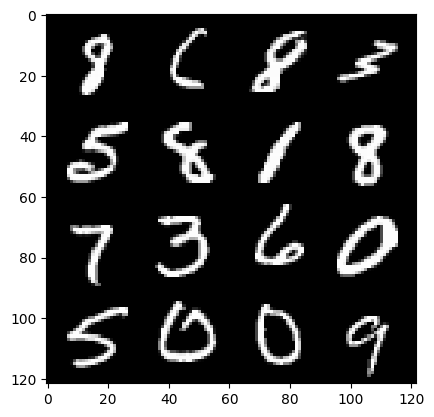

116: step 54600 / Gen loss: 3.0007143608729057 / Disc loss: 0.19856586826344338


  0%|          | 0/469 [00:00<?, ?it/s]

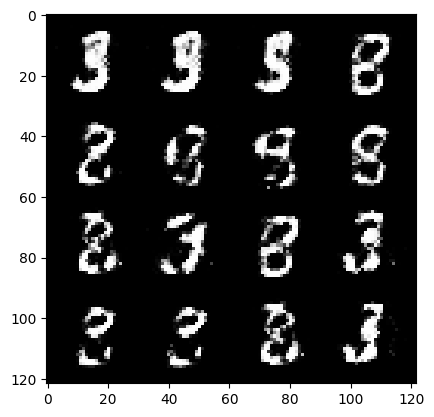

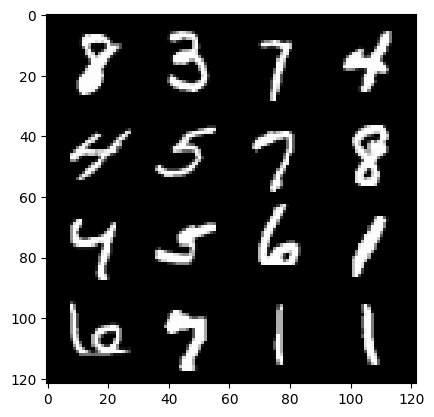

117: step 54900 / Gen loss: 2.9606186699867276 / Disc loss: 0.20826169426242525


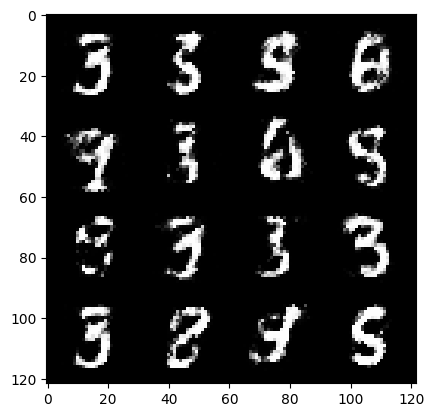

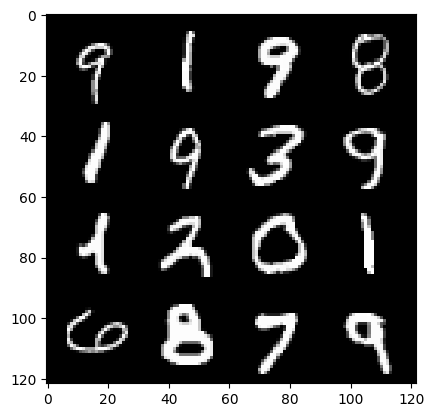

117: step 55200 / Gen loss: 2.9230210463205966 / Disc loss: 0.2117615888019403


  0%|          | 0/469 [00:00<?, ?it/s]

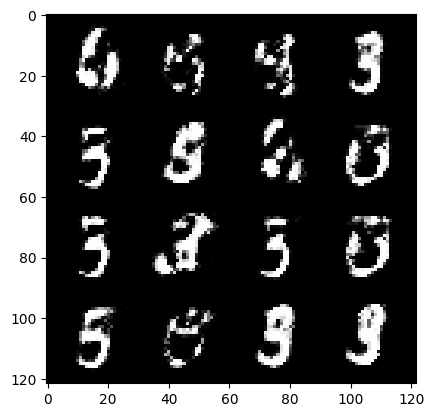

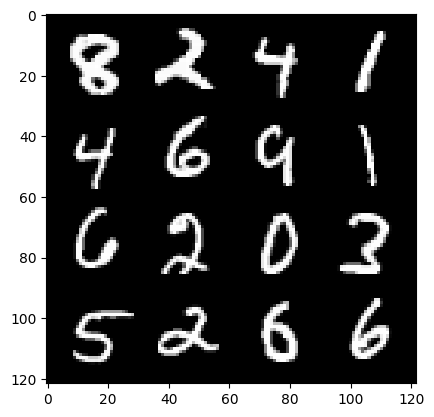

118: step 55500 / Gen loss: 3.0196967514355975 / Disc loss: 0.20882556796073912


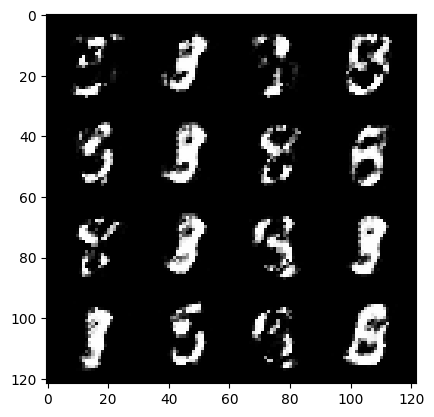

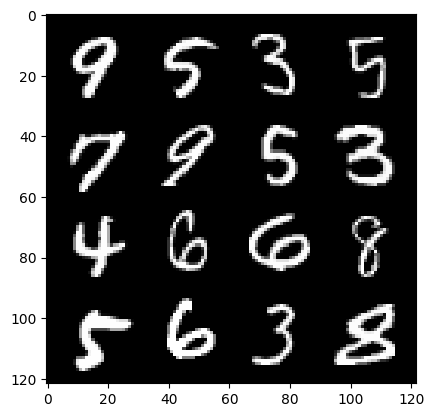

118: step 55800 / Gen loss: 2.8989675013224265 / Disc loss: 0.23069335425893456


  0%|          | 0/469 [00:00<?, ?it/s]

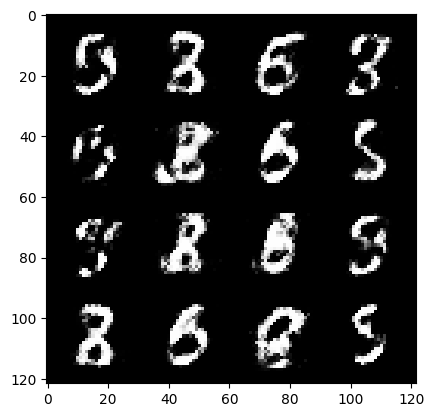

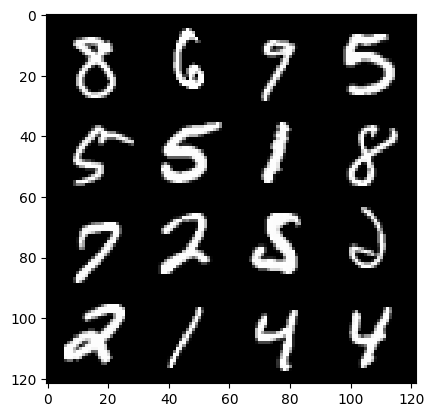

119: step 56100 / Gen loss: 2.8624151825904858 / Disc loss: 0.21971326425671586


  0%|          | 0/469 [00:00<?, ?it/s]

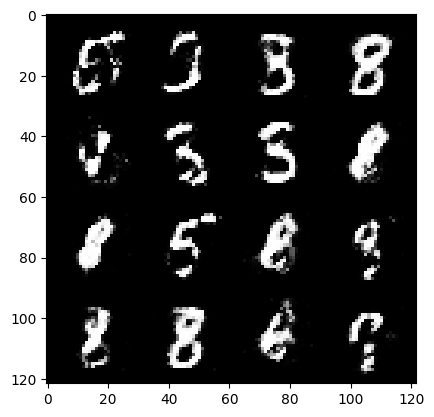

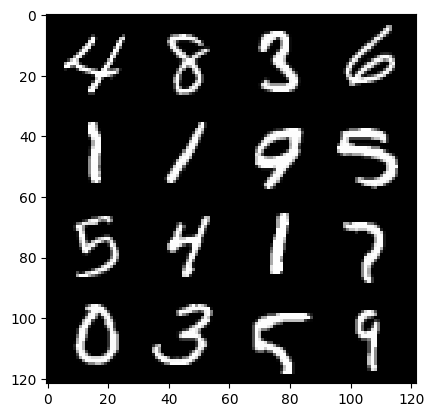

120: step 56400 / Gen loss: 2.9377932071685797 / Disc loss: 0.2064584746708473


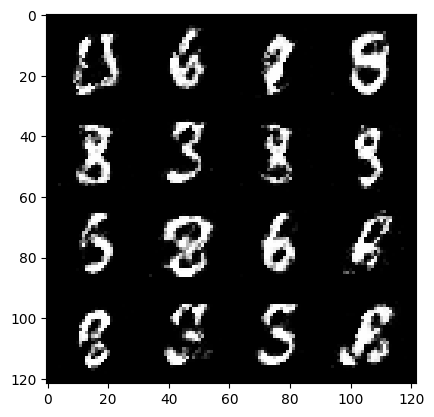

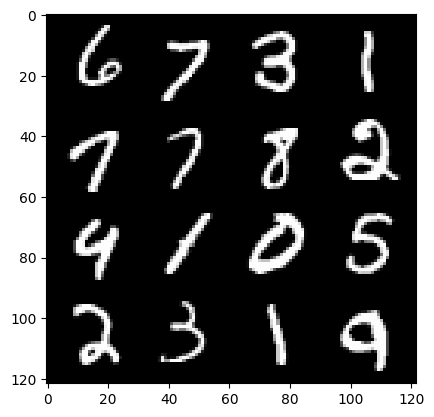

120: step 56700 / Gen loss: 2.9892367688814807 / Disc loss: 0.19387096506853882


  0%|          | 0/469 [00:00<?, ?it/s]

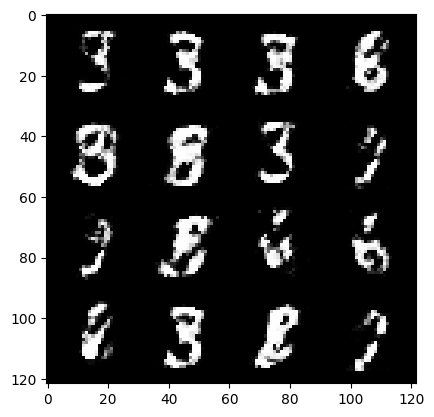

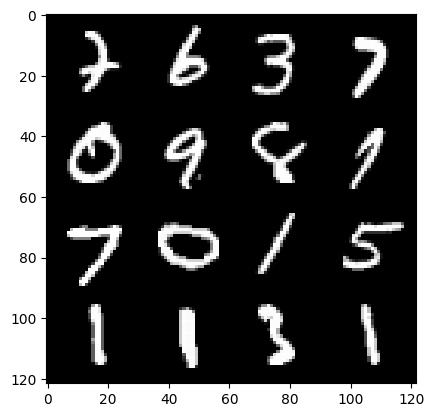

121: step 57000 / Gen loss: 2.954167124430338 / Disc loss: 0.19648765541613097


  0%|          | 0/469 [00:00<?, ?it/s]

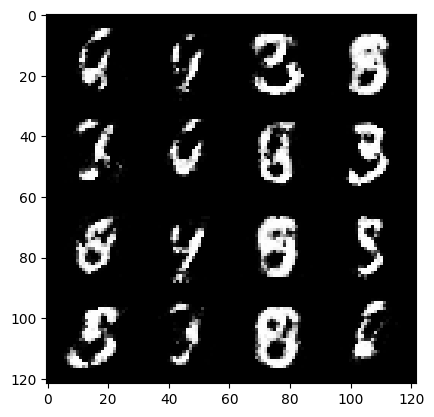

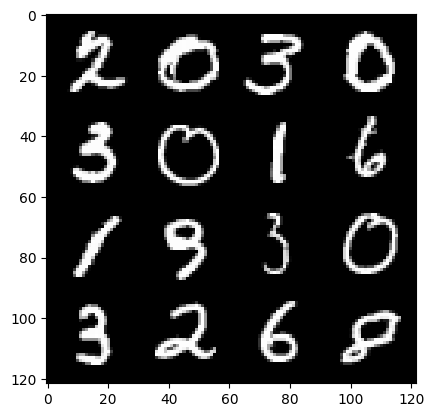

122: step 57300 / Gen loss: 2.7925479046503714 / Disc loss: 0.2446184601883094


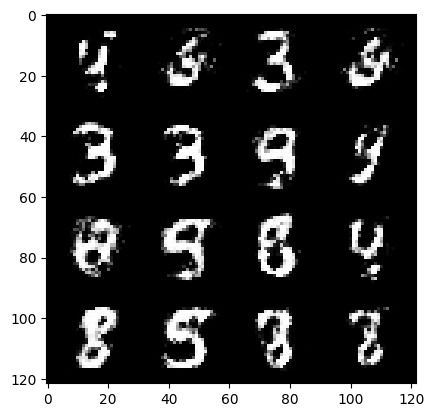

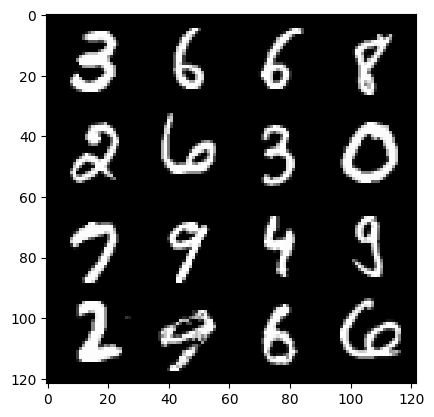

122: step 57600 / Gen loss: 2.801369531154632 / Disc loss: 0.2284872178733349


  0%|          | 0/469 [00:00<?, ?it/s]

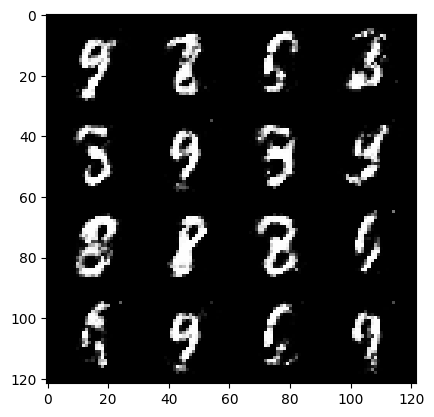

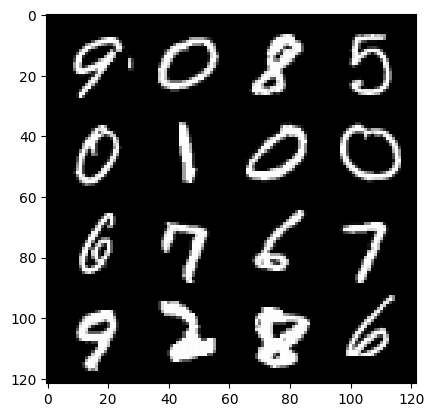

123: step 57900 / Gen loss: 2.756480893294017 / Disc loss: 0.2291168506443502


  0%|          | 0/469 [00:00<?, ?it/s]

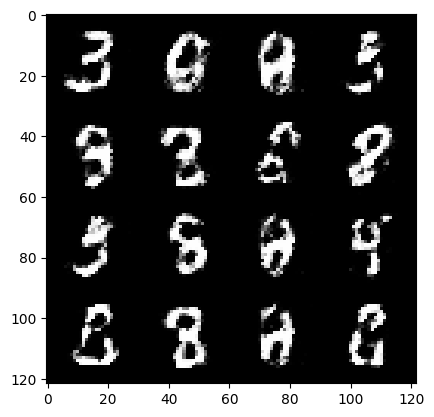

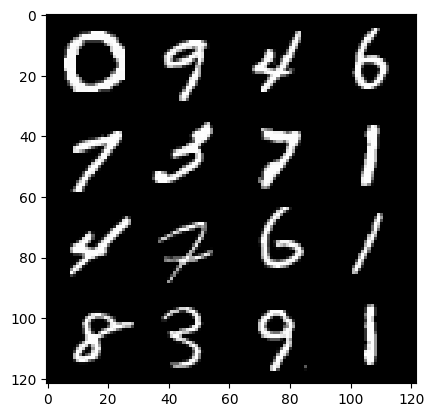

124: step 58200 / Gen loss: 2.8276374109586078 / Disc loss: 0.21730803971489274


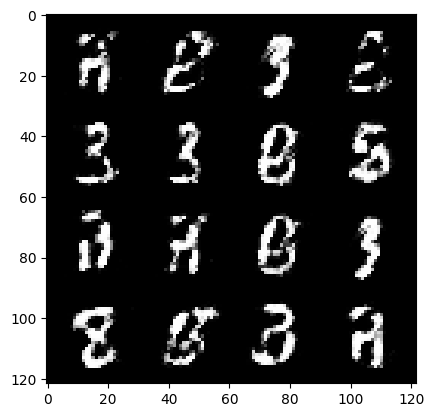

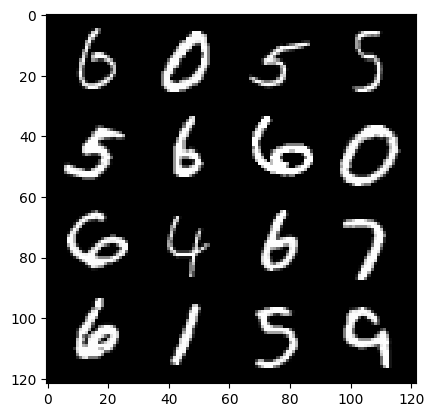

124: step 58500 / Gen loss: 2.9245713615417483 / Disc loss: 0.20325941902895772


  0%|          | 0/469 [00:00<?, ?it/s]

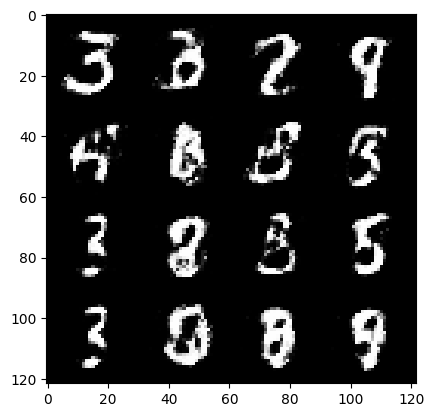

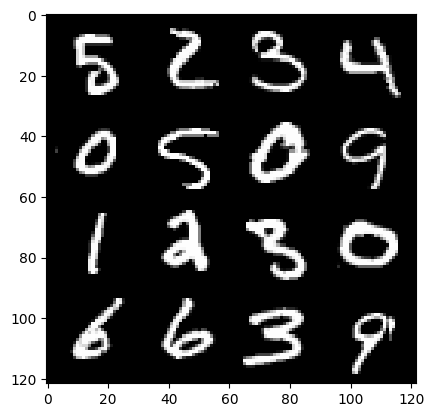

125: step 58800 / Gen loss: 2.800360746383668 / Disc loss: 0.23205707815786208


  0%|          | 0/469 [00:00<?, ?it/s]

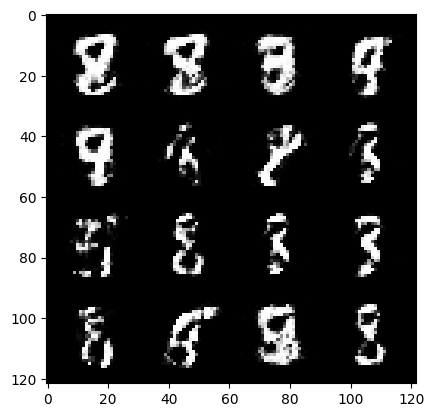

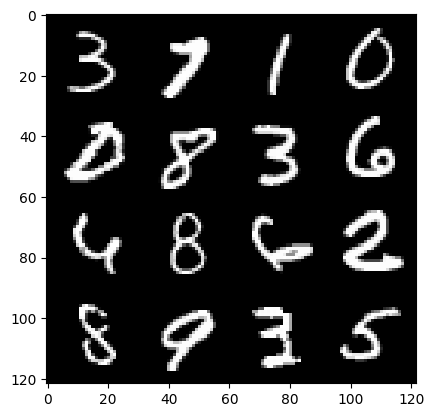

126: step 59100 / Gen loss: 2.746247675418855 / Disc loss: 0.23454249337315555


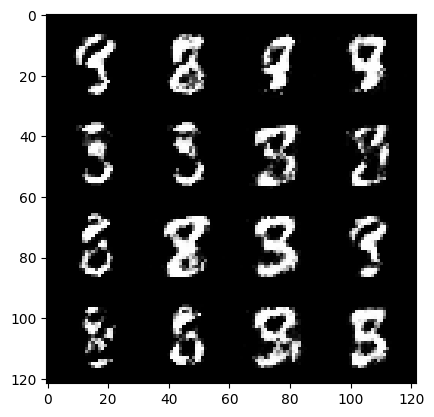

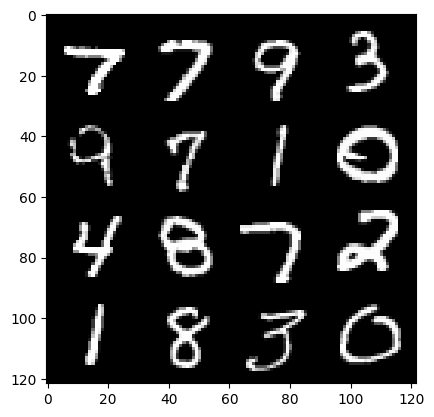

126: step 59400 / Gen loss: 2.7511748091379813 / Disc loss: 0.22203847986956454


  0%|          | 0/469 [00:00<?, ?it/s]

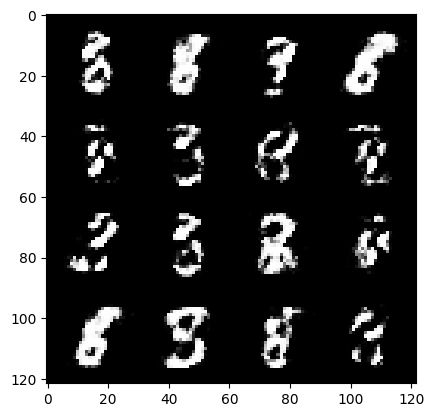

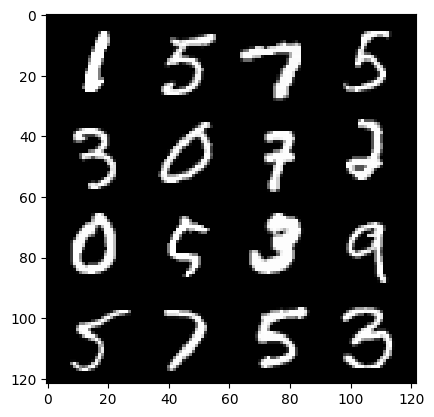

127: step 59700 / Gen loss: 2.636962878306708 / Disc loss: 0.23532514785726869


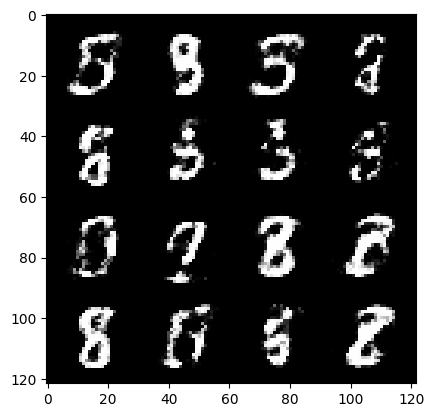

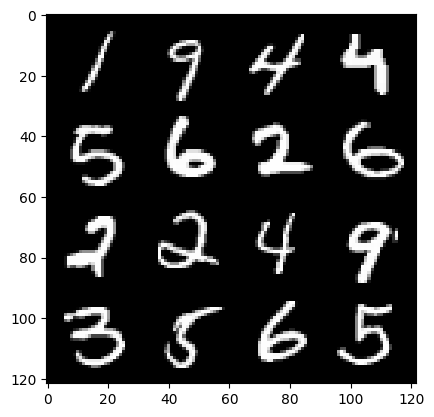

127: step 60000 / Gen loss: 2.831269545157751 / Disc loss: 0.2114762978752453


  0%|          | 0/469 [00:00<?, ?it/s]

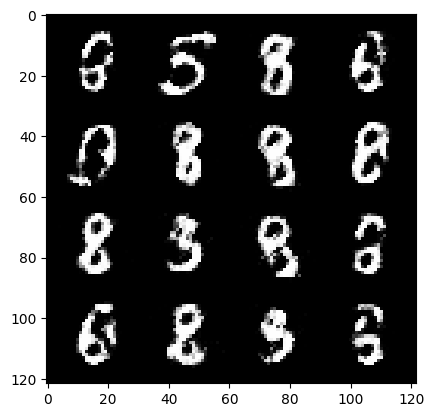

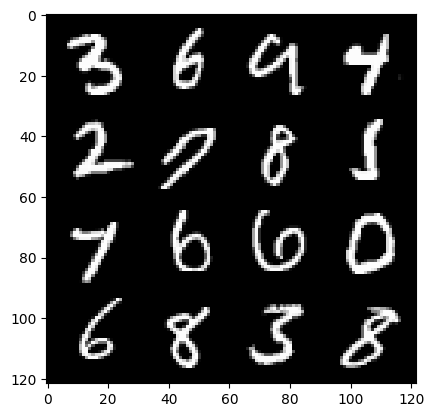

128: step 60300 / Gen loss: 2.850206012725833 / Disc loss: 0.20428273300329824


  0%|          | 0/469 [00:00<?, ?it/s]

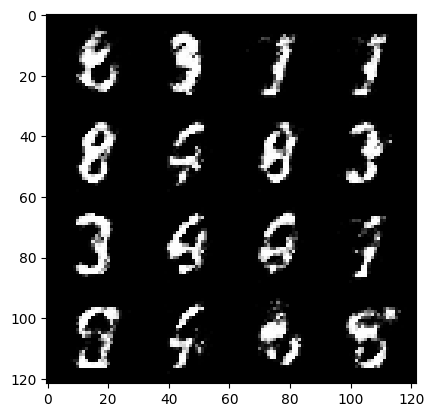

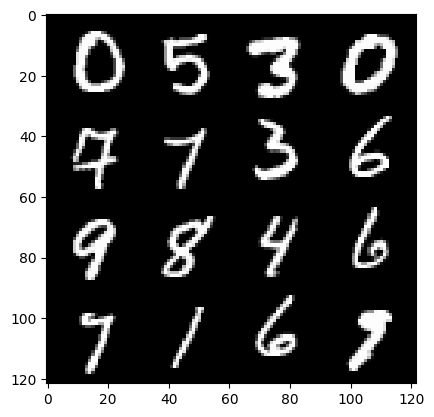

129: step 60600 / Gen loss: 2.900803019205727 / Disc loss: 0.19999625841776536


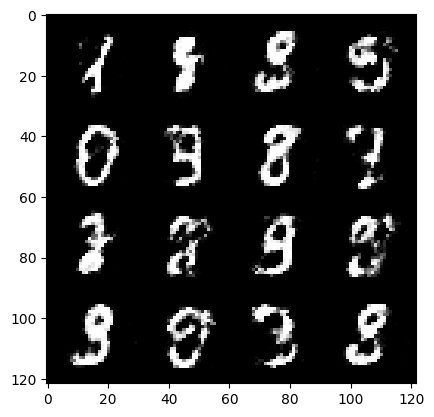

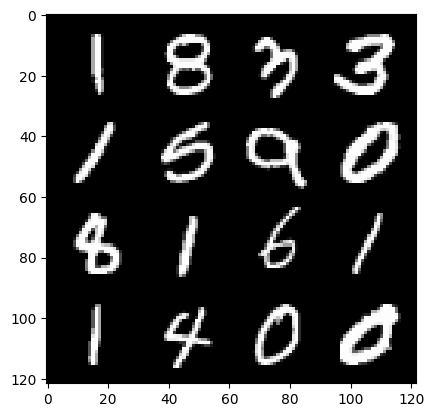

129: step 60900 / Gen loss: 2.904725944201153 / Disc loss: 0.21400105973084776


  0%|          | 0/469 [00:00<?, ?it/s]

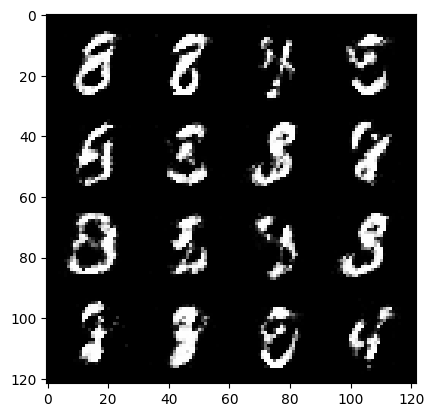

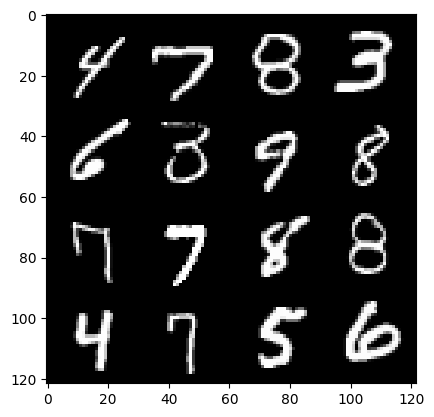

130: step 61200 / Gen loss: 2.6562902983029657 / Disc loss: 0.24524509290854118


  0%|          | 0/469 [00:00<?, ?it/s]

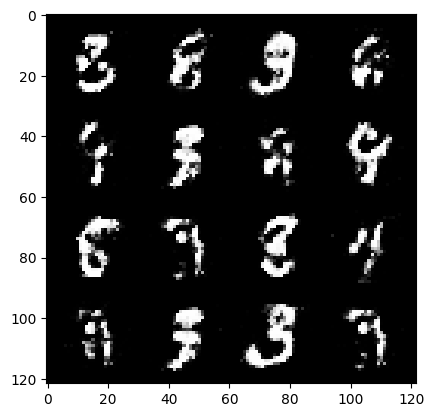

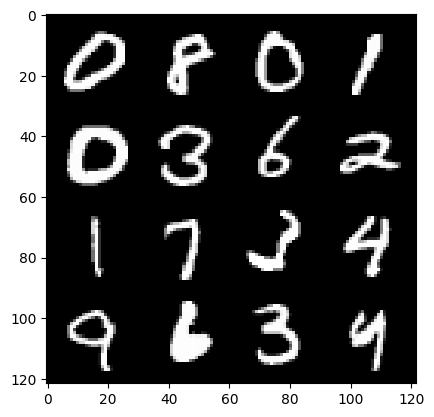

131: step 61500 / Gen loss: 2.7681385993957504 / Disc loss: 0.21587524607777575


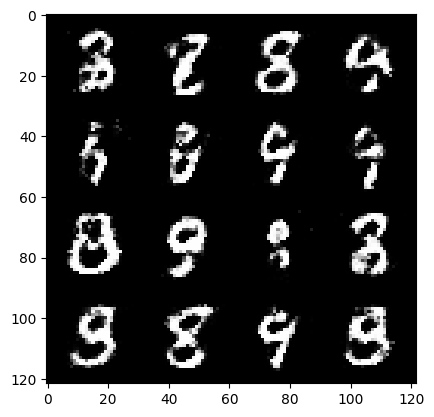

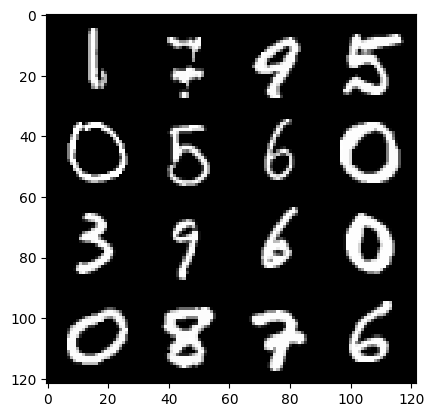

131: step 61800 / Gen loss: 2.7333530982335392 / Disc loss: 0.2268401704231898


  0%|          | 0/469 [00:00<?, ?it/s]

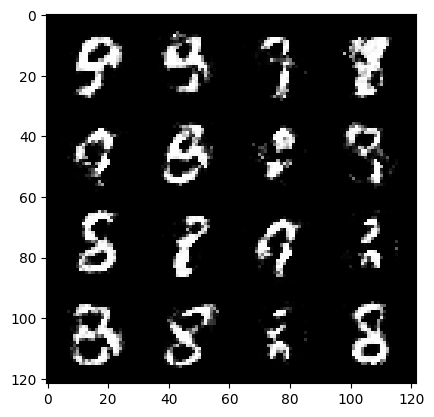

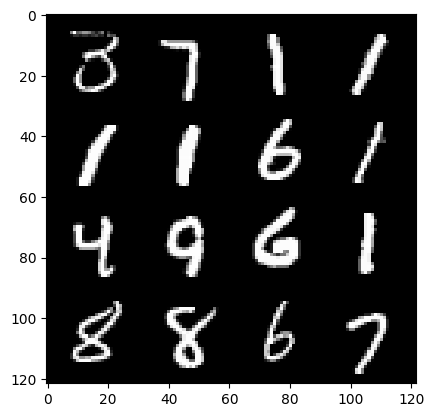

132: step 62100 / Gen loss: 2.73381600777308 / Disc loss: 0.2247524714966617


  0%|          | 0/469 [00:00<?, ?it/s]

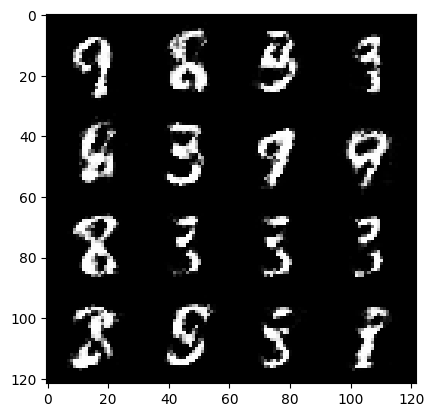

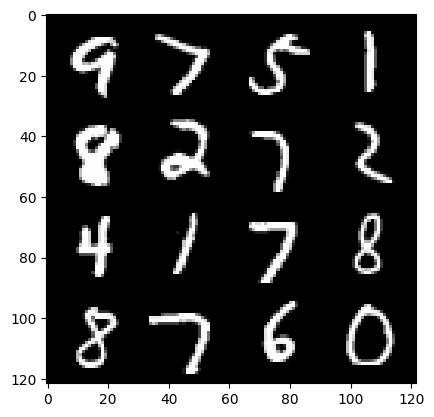

133: step 62400 / Gen loss: 2.7635694376627606 / Disc loss: 0.2155209671954314


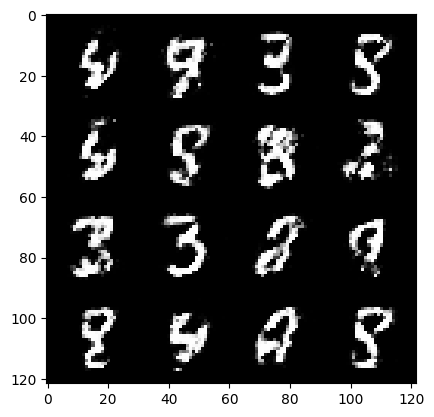

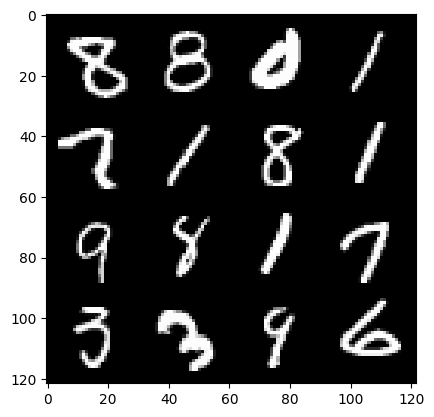

133: step 62700 / Gen loss: 2.6936663301785786 / Disc loss: 0.23379490522046892


  0%|          | 0/469 [00:00<?, ?it/s]

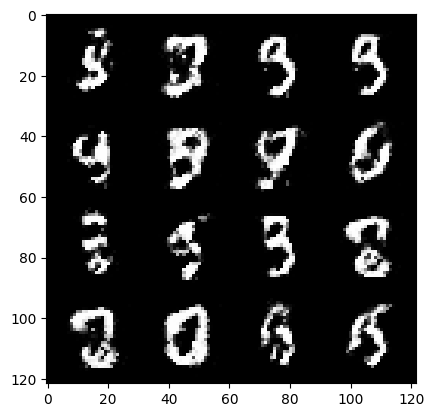

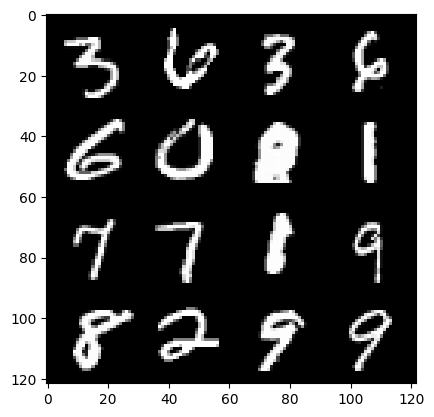

134: step 63000 / Gen loss: 2.699371872742969 / Disc loss: 0.23174314280351016


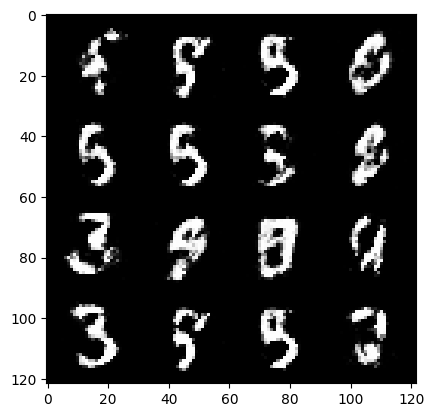

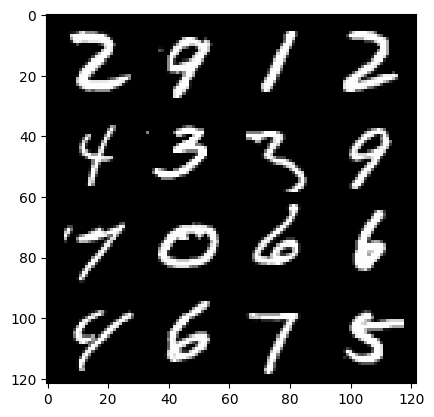

134: step 63300 / Gen loss: 2.6783974607785566 / Disc loss: 0.24202123035987222


  0%|          | 0/469 [00:00<?, ?it/s]

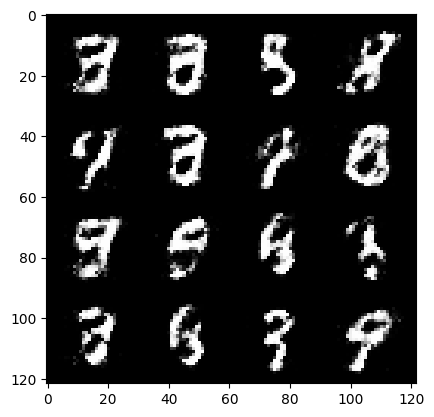

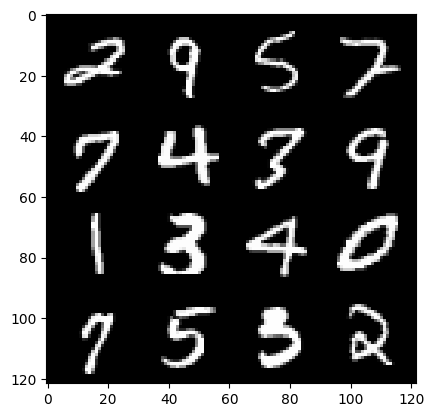

135: step 63600 / Gen loss: 2.733783234755197 / Disc loss: 0.22565550635258347


  0%|          | 0/469 [00:00<?, ?it/s]

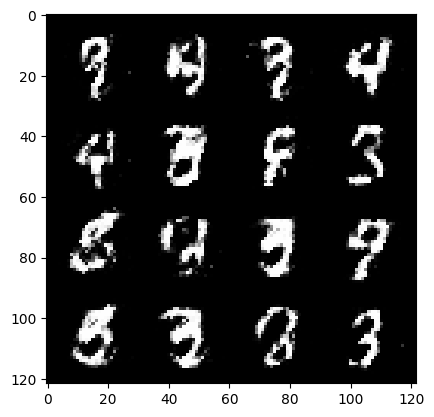

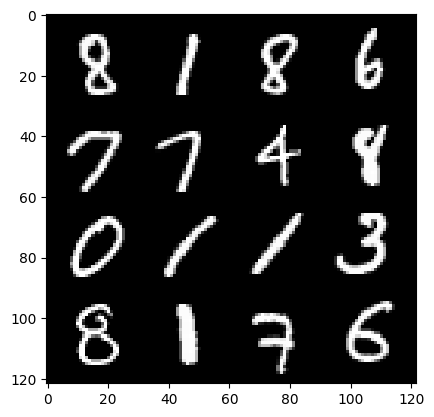

136: step 63900 / Gen loss: 2.8951268625259408 / Disc loss: 0.18990133558710426


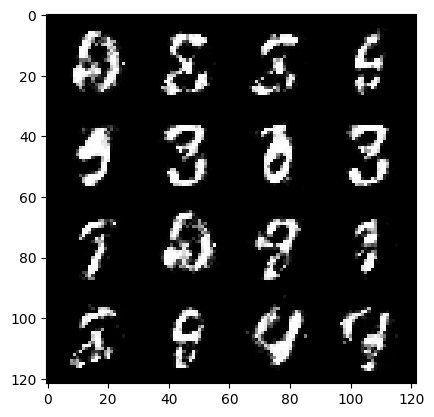

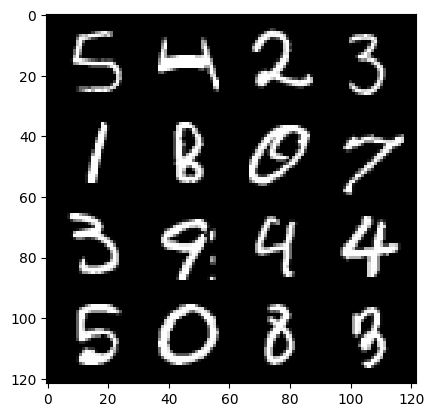

136: step 64200 / Gen loss: 2.7040337228775004 / Disc loss: 0.24276627699534103


  0%|          | 0/469 [00:00<?, ?it/s]

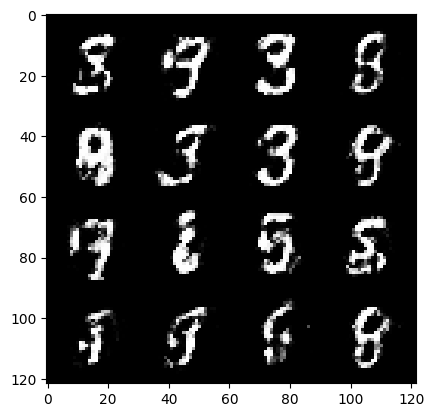

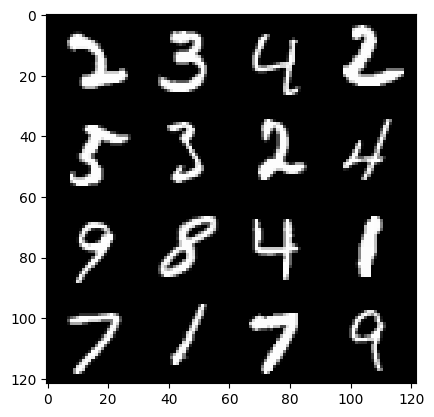

137: step 64500 / Gen loss: 2.7236625305811564 / Disc loss: 0.21252667630712205


  0%|          | 0/469 [00:00<?, ?it/s]

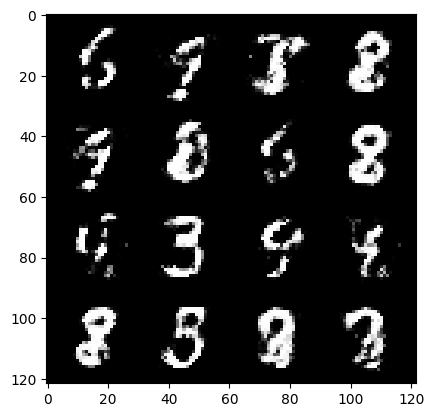

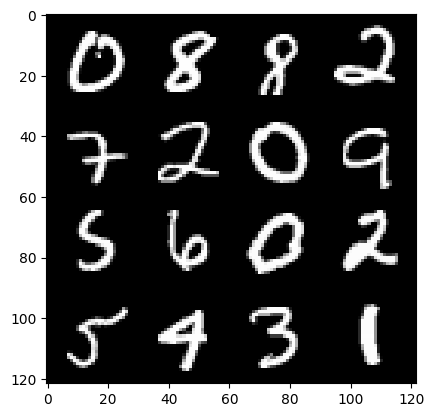

138: step 64800 / Gen loss: 2.71068552573522 / Disc loss: 0.25091140339771895


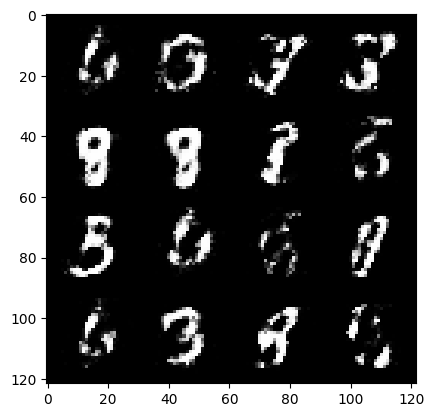

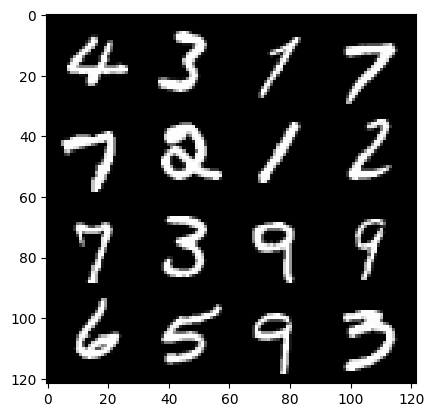

138: step 65100 / Gen loss: 2.6324031519889823 / Disc loss: 0.2515128283699352


  0%|          | 0/469 [00:00<?, ?it/s]

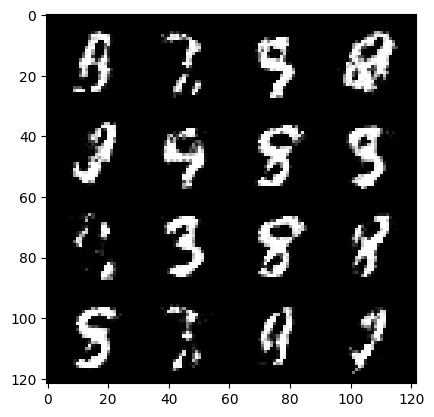

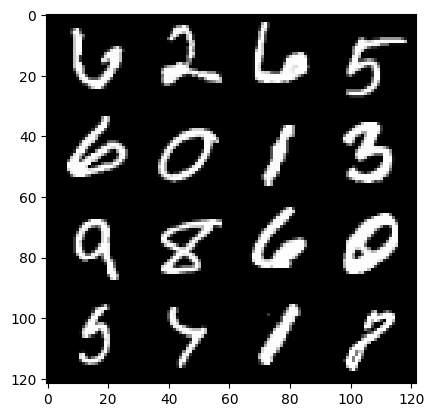

139: step 65400 / Gen loss: 2.602477735678355 / Disc loss: 0.25280578225851064


  0%|          | 0/469 [00:00<?, ?it/s]

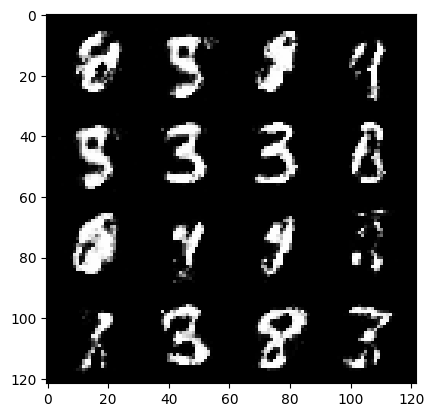

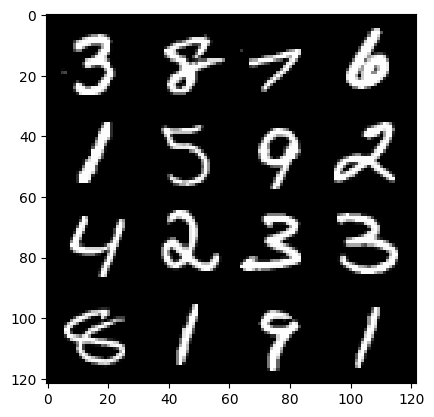

140: step 65700 / Gen loss: 2.6057496102650965 / Disc loss: 0.2385364124178886


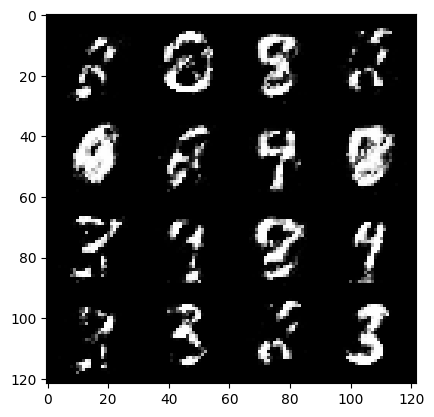

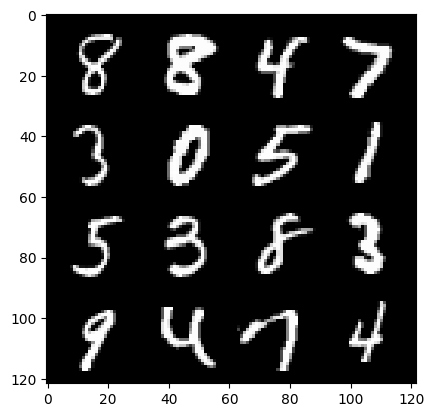

140: step 66000 / Gen loss: 2.45342142542203 / Disc loss: 0.2693978736301263


  0%|          | 0/469 [00:00<?, ?it/s]

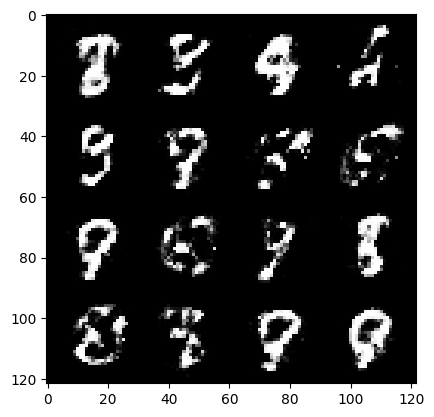

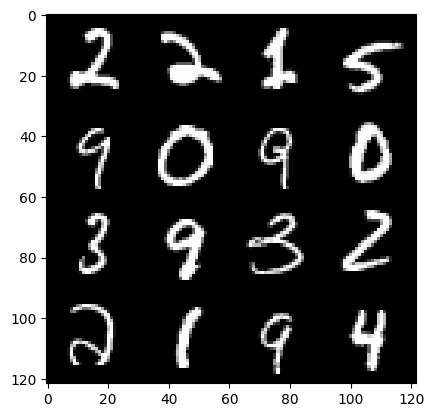

141: step 66300 / Gen loss: 2.400418932437898 / Disc loss: 0.28818502192695916


  0%|          | 0/469 [00:00<?, ?it/s]

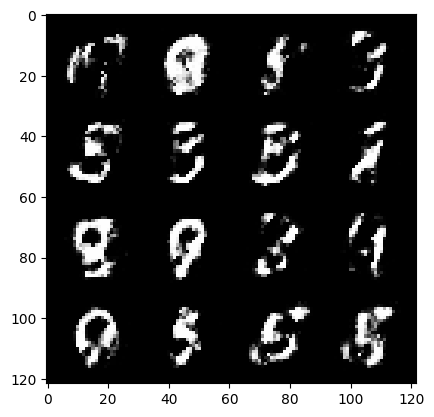

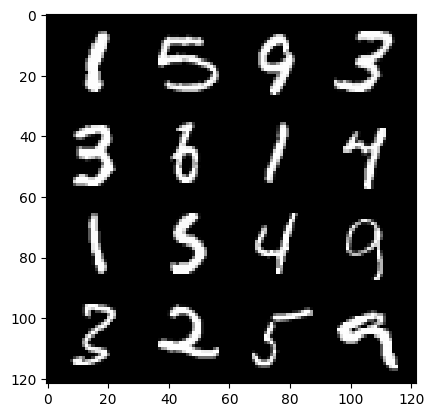

142: step 66600 / Gen loss: 2.4966540233294165 / Disc loss: 0.2525253035624822


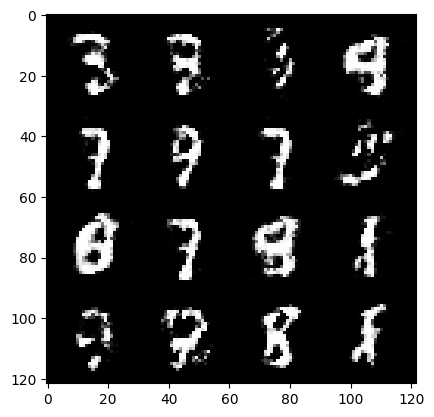

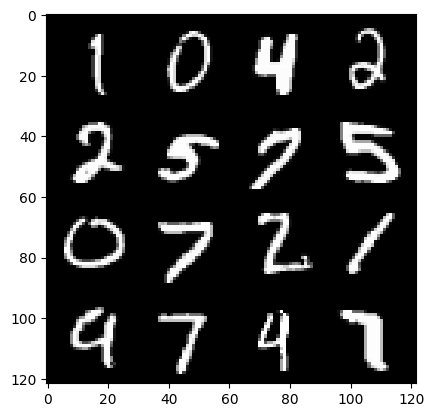

142: step 66900 / Gen loss: 2.4999612243970235 / Disc loss: 0.25619831775625546


  0%|          | 0/469 [00:00<?, ?it/s]

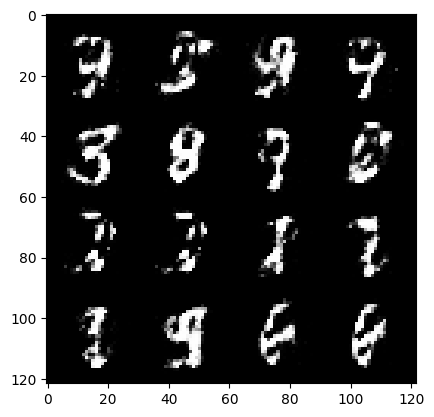

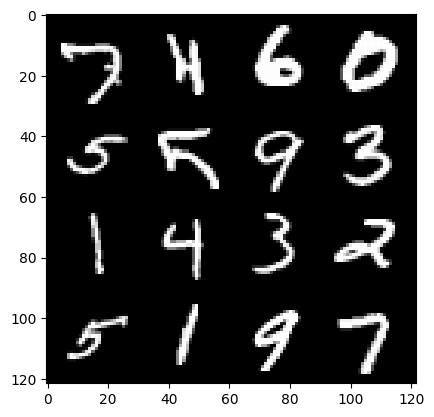

143: step 67200 / Gen loss: 2.576212983131406 / Disc loss: 0.24598531420032183


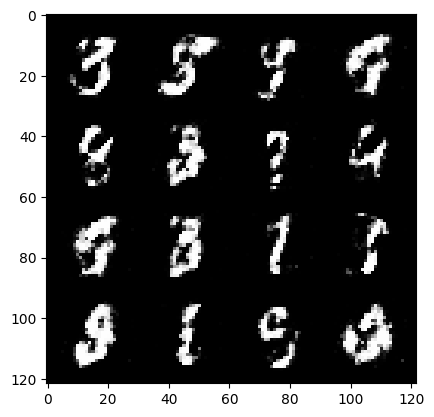

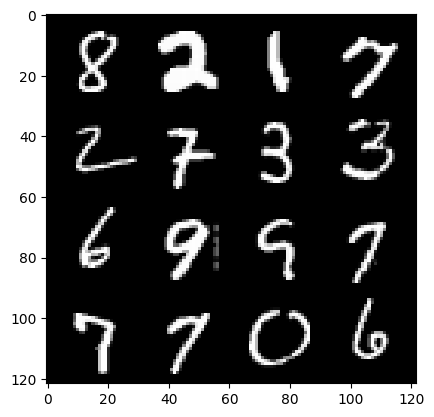

143: step 67500 / Gen loss: 2.5199895226955396 / Disc loss: 0.25696354488531753


  0%|          | 0/469 [00:00<?, ?it/s]

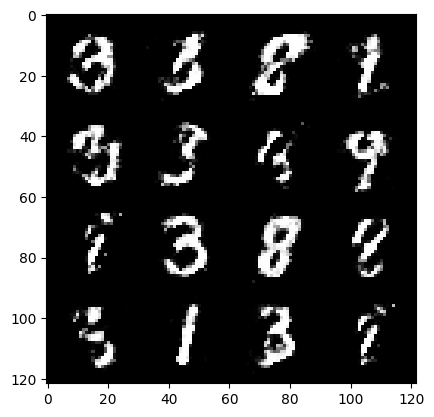

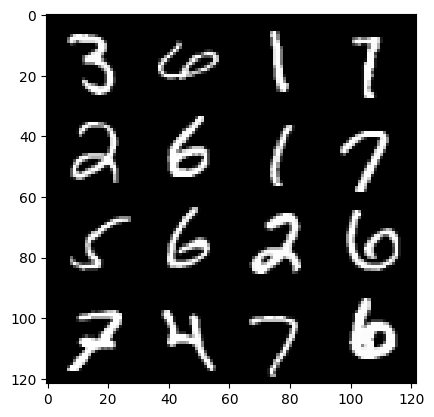

144: step 67800 / Gen loss: 2.5536587039629617 / Disc loss: 0.256818921218316


  0%|          | 0/469 [00:00<?, ?it/s]

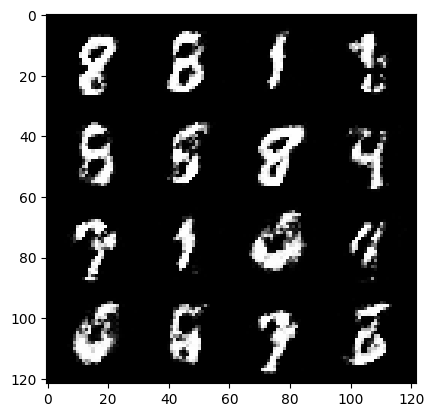

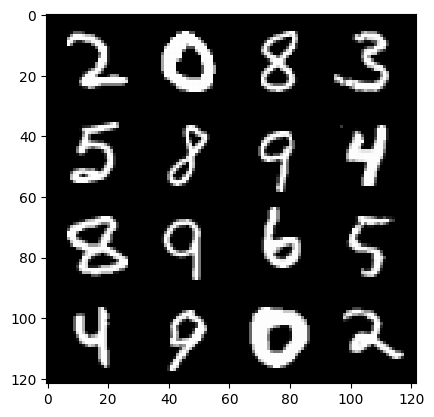

145: step 68100 / Gen loss: 2.3616173005104053 / Disc loss: 0.29184549535314247


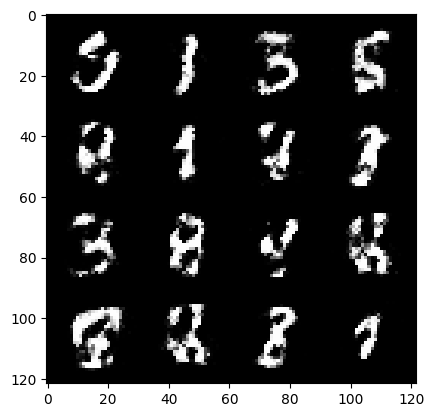

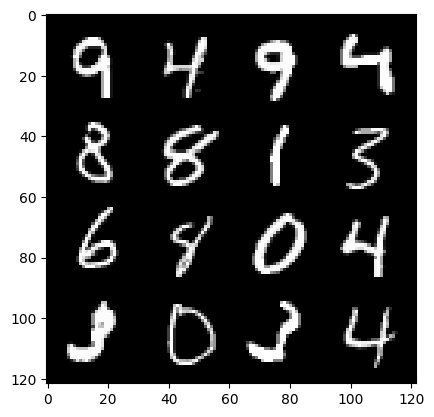

145: step 68400 / Gen loss: 2.4043335425853725 / Disc loss: 0.2735754229128359


  0%|          | 0/469 [00:00<?, ?it/s]

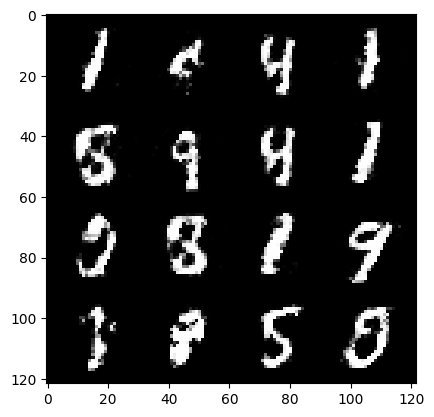

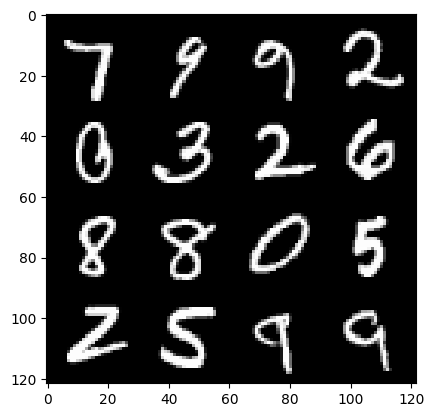

146: step 68700 / Gen loss: 2.469274500211079 / Disc loss: 0.2619022463262082


  0%|          | 0/469 [00:00<?, ?it/s]

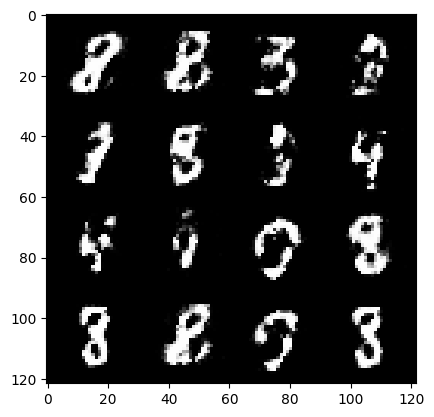

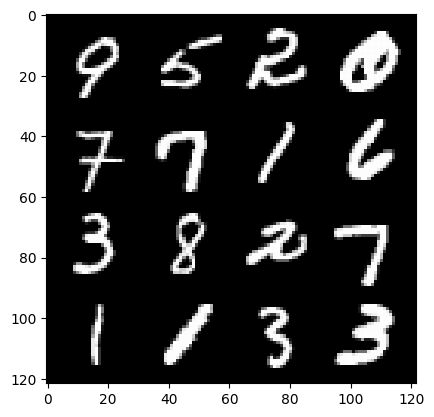

147: step 69000 / Gen loss: 2.3811428141593938 / Disc loss: 0.29225722307960217


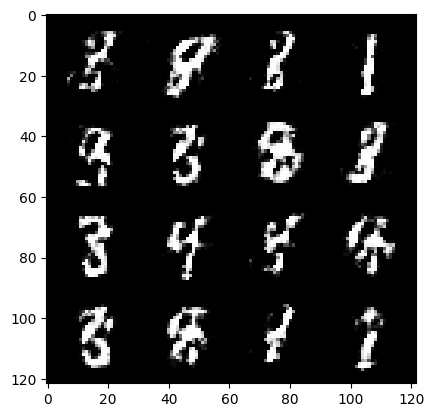

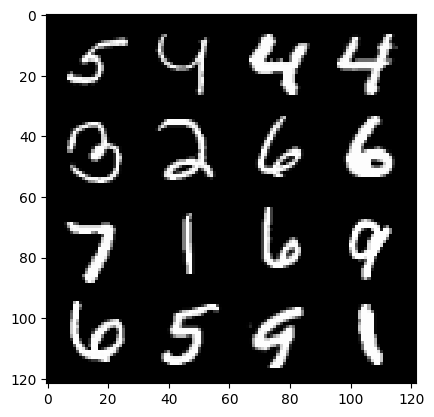

147: step 69300 / Gen loss: 2.4329373880227405 / Disc loss: 0.2780209514498708


  0%|          | 0/469 [00:00<?, ?it/s]

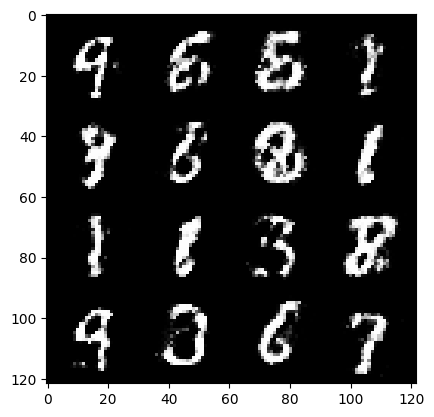

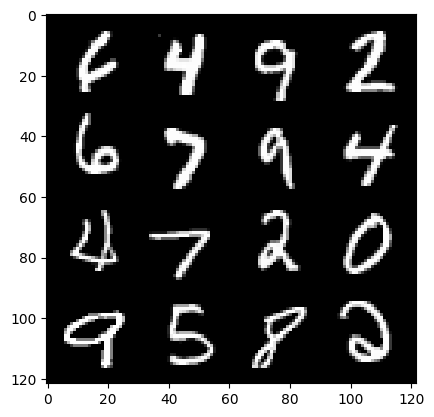

148: step 69600 / Gen loss: 2.256270327170689 / Disc loss: 0.318295911749204


  0%|          | 0/469 [00:00<?, ?it/s]

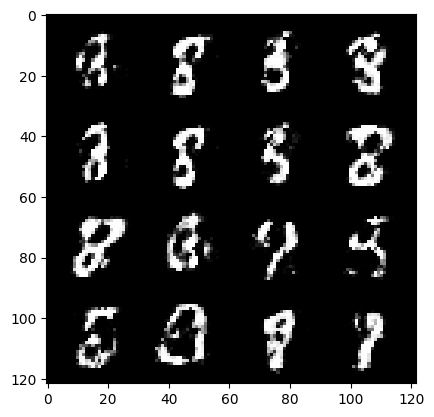

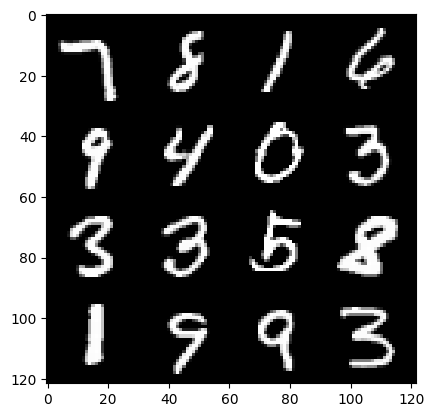

149: step 69900 / Gen loss: 2.2330448242028553 / Disc loss: 0.2987232615550359


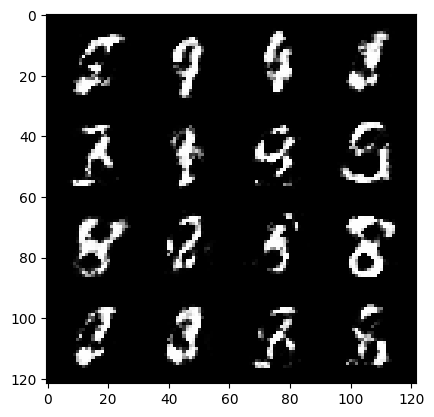

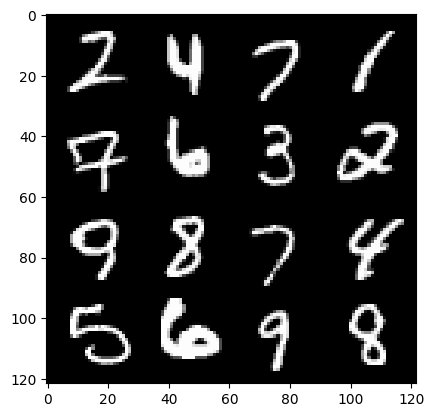

149: step 70200 / Gen loss: 2.3819709956645974 / Disc loss: 0.27505999969939393


  0%|          | 0/469 [00:00<?, ?it/s]

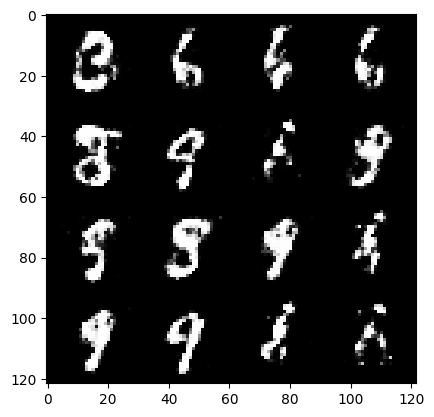

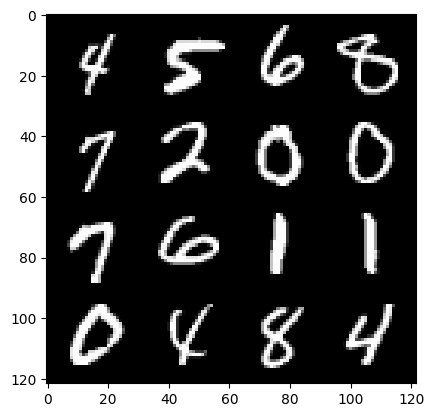

150: step 70500 / Gen loss: 2.3348258487383533 / Disc loss: 0.29880715996026996


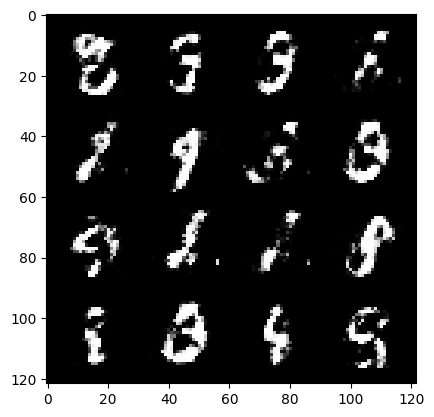

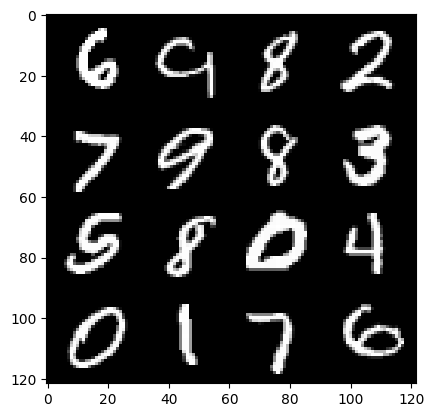

150: step 70800 / Gen loss: 2.2894305090109484 / Disc loss: 0.29133980075518295


  0%|          | 0/469 [00:00<?, ?it/s]

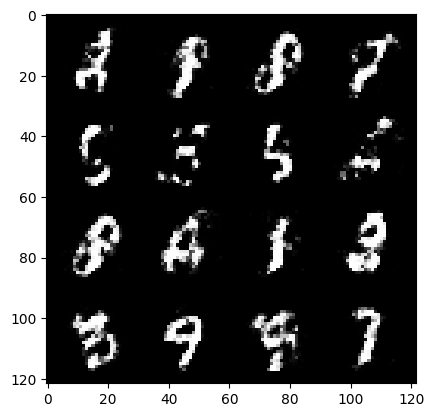

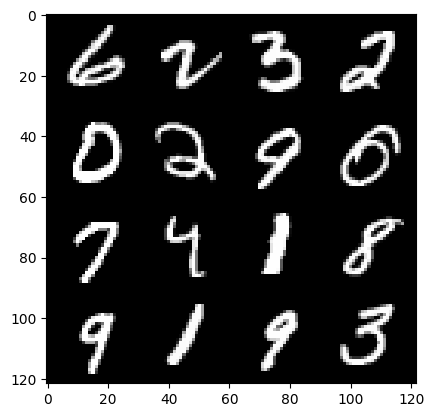

151: step 71100 / Gen loss: 2.360568188826246 / Disc loss: 0.2651345462600389


  0%|          | 0/469 [00:00<?, ?it/s]

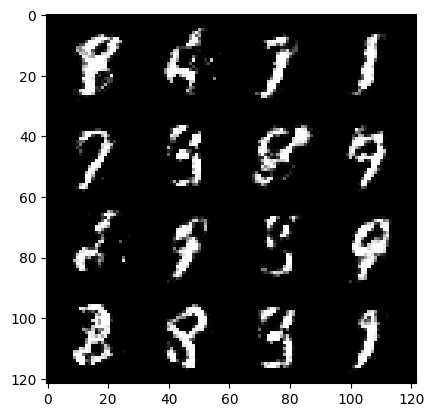

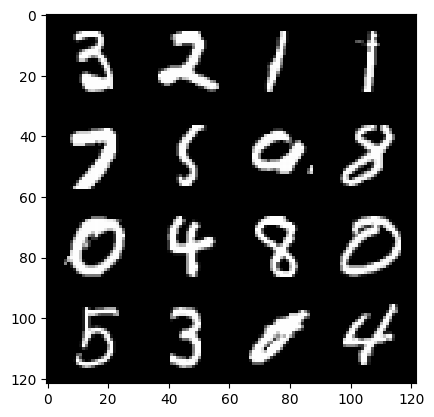

152: step 71400 / Gen loss: 2.3208781635761278 / Disc loss: 0.2663672628502052


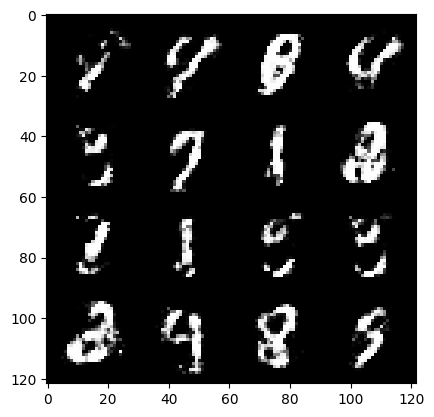

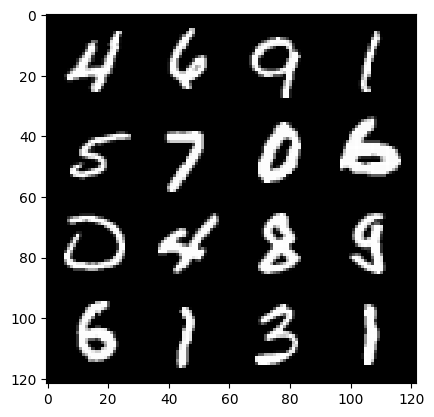

152: step 71700 / Gen loss: 2.1906689027945196 / Disc loss: 0.30718440388639756


  0%|          | 0/469 [00:00<?, ?it/s]

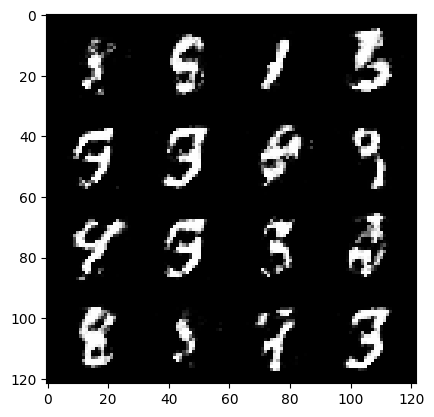

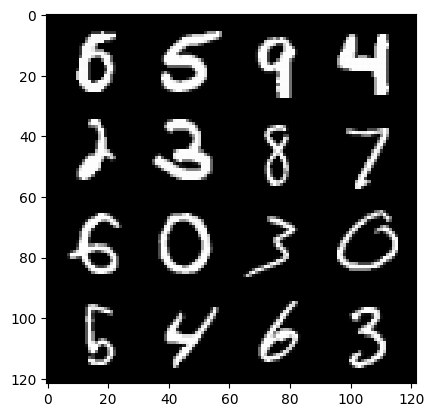

153: step 72000 / Gen loss: 2.3058436147371935 / Disc loss: 0.28265635947386436


  0%|          | 0/469 [00:00<?, ?it/s]

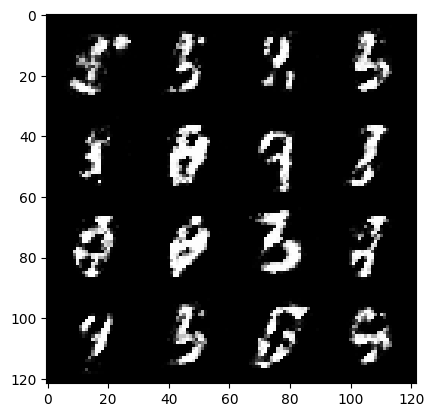

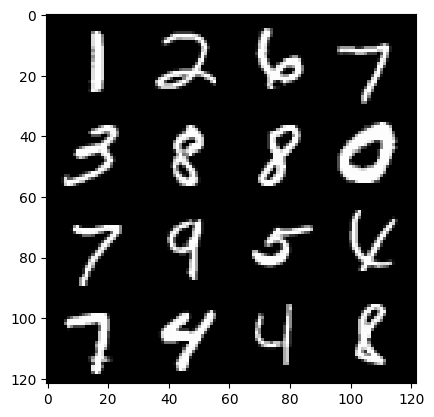

154: step 72300 / Gen loss: 2.226834743817647 / Disc loss: 0.28197988952199604


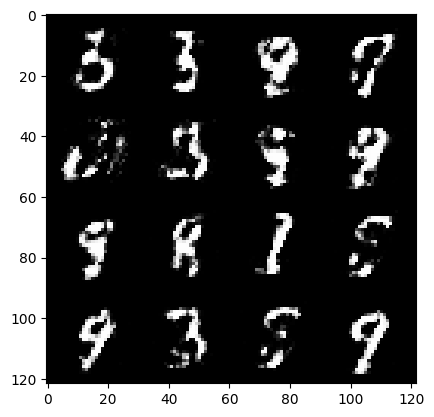

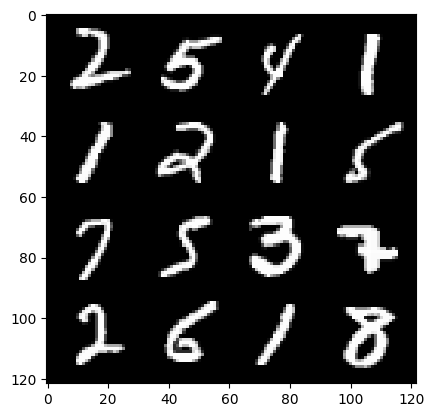

154: step 72600 / Gen loss: 2.2525117234388996 / Disc loss: 0.2973496231933435


  0%|          | 0/469 [00:00<?, ?it/s]

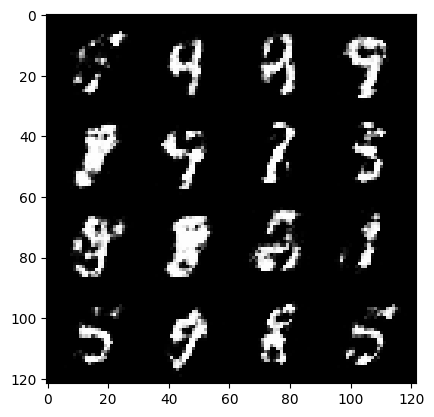

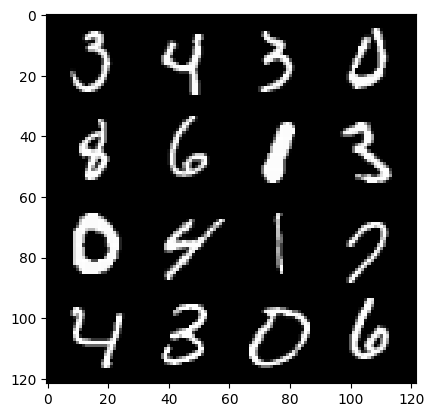

155: step 72900 / Gen loss: 2.144581596851348 / Disc loss: 0.3119044849276545


  0%|          | 0/469 [00:00<?, ?it/s]

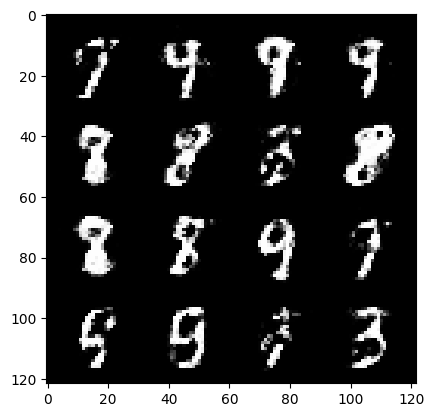

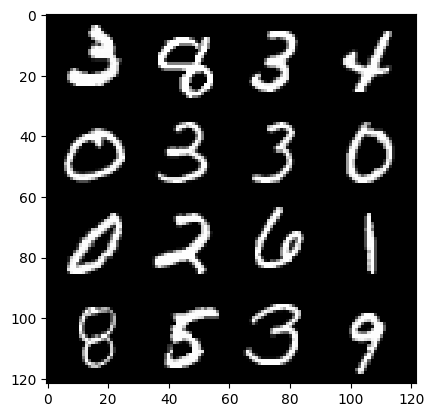

156: step 73200 / Gen loss: 2.1877436546484637 / Disc loss: 0.2930778101086616


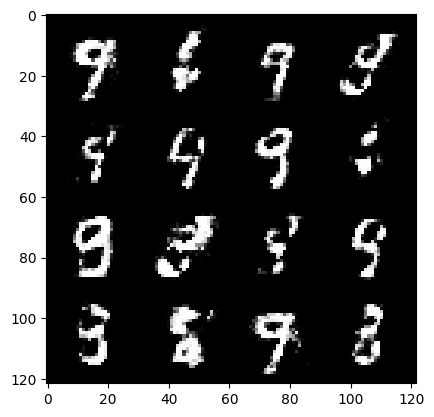

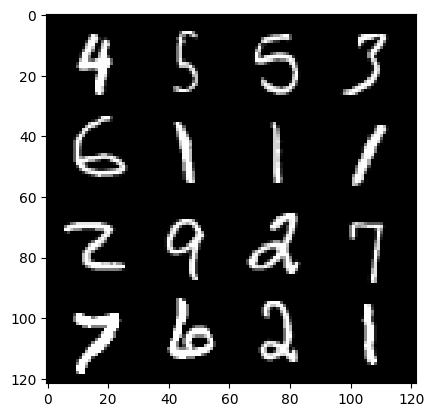

156: step 73500 / Gen loss: 2.1289098747571304 / Disc loss: 0.3057127989828586


  0%|          | 0/469 [00:00<?, ?it/s]

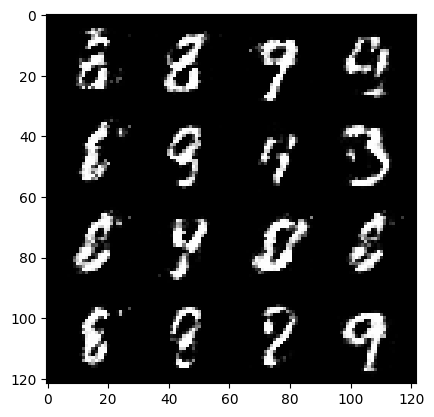

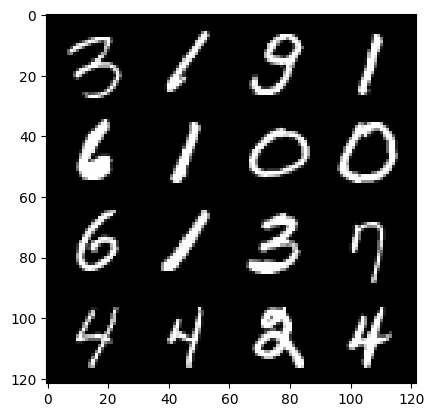

157: step 73800 / Gen loss: 2.2189137562116 / Disc loss: 0.2850557754437131


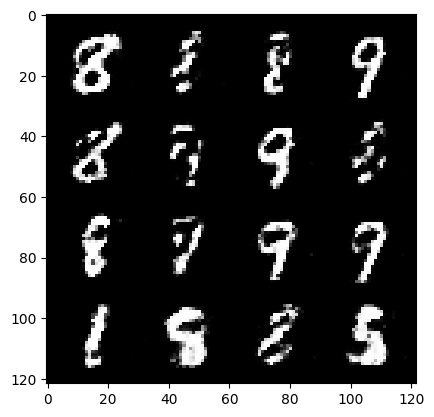

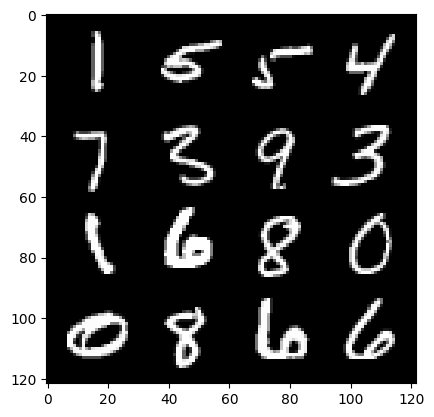

157: step 74100 / Gen loss: 2.1996890850861863 / Disc loss: 0.2844738040367762


  0%|          | 0/469 [00:00<?, ?it/s]

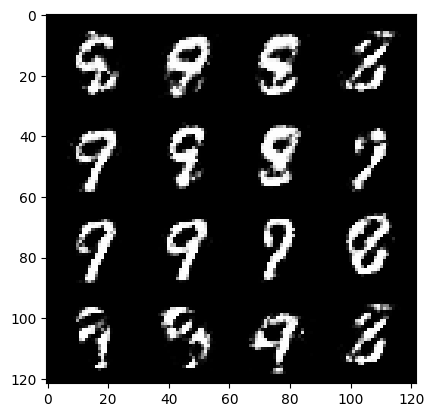

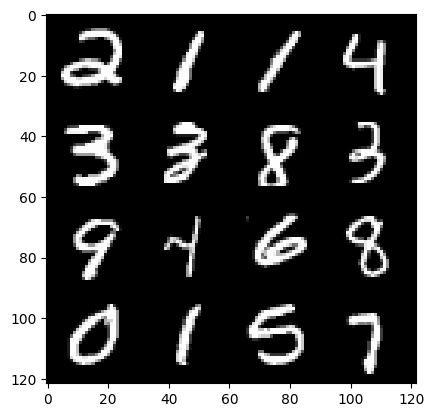

158: step 74400 / Gen loss: 2.1158850864569345 / Disc loss: 0.30121814067165054


  0%|          | 0/469 [00:00<?, ?it/s]

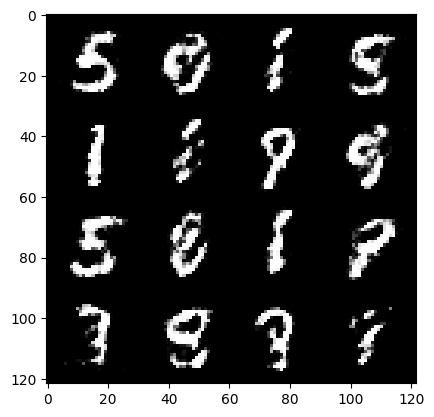

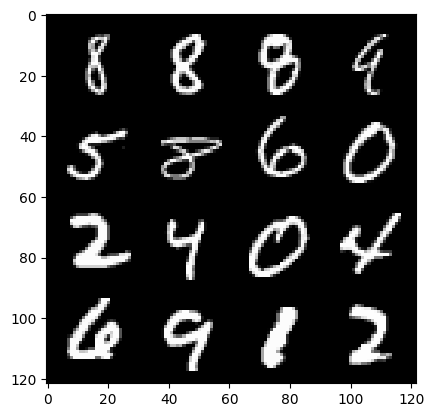

159: step 74700 / Gen loss: 2.1226848995685583 / Disc loss: 0.31433944314718254


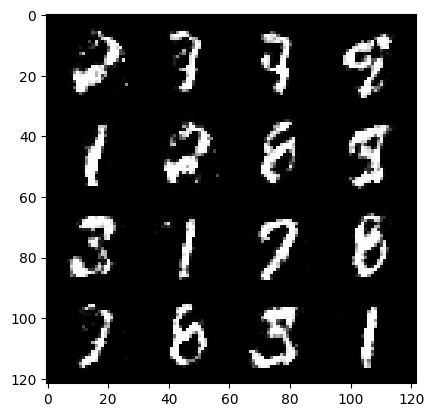

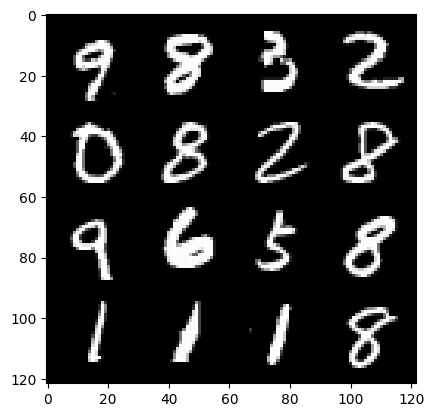

159: step 75000 / Gen loss: 2.1046127883593244 / Disc loss: 0.3197636602322261


  0%|          | 0/469 [00:00<?, ?it/s]

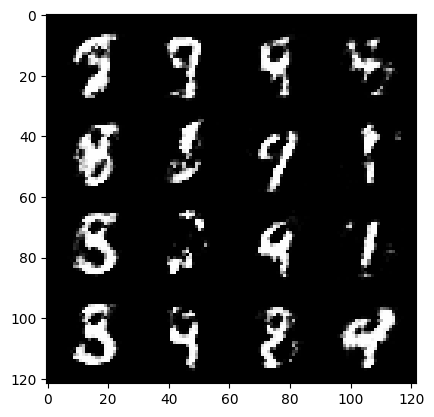

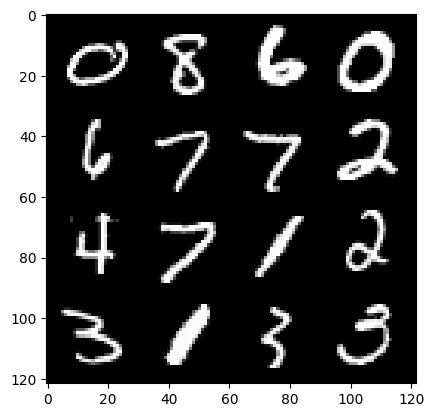

160: step 75300 / Gen loss: 2.056871902942658 / Disc loss: 0.3175141835709414


  0%|          | 0/469 [00:00<?, ?it/s]

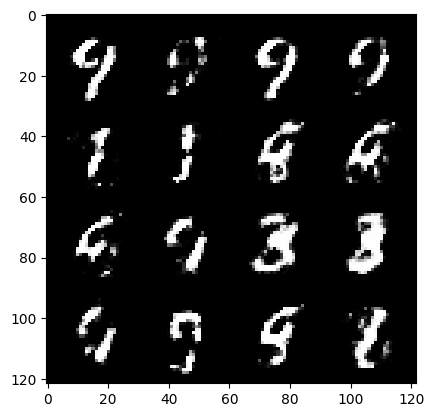

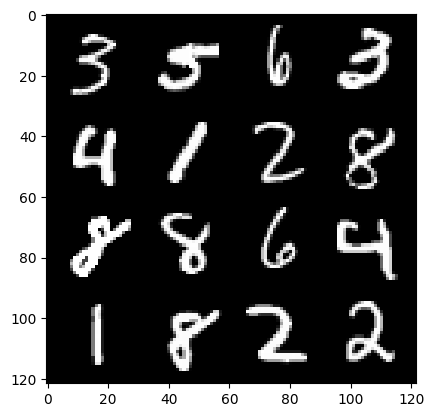

161: step 75600 / Gen loss: 2.0528528034687037 / Disc loss: 0.31608169704675704


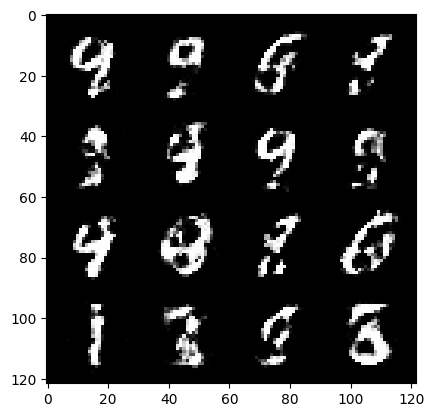

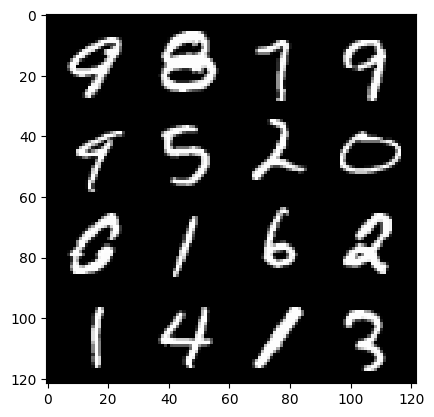

161: step 75900 / Gen loss: 2.0691519474983204 / Disc loss: 0.31311408768097565


  0%|          | 0/469 [00:00<?, ?it/s]

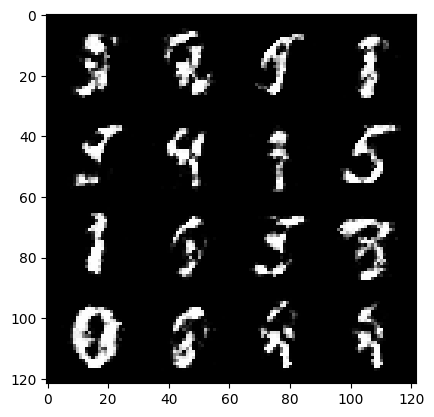

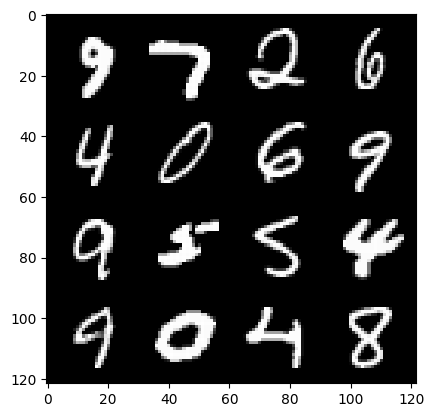

162: step 76200 / Gen loss: 2.157753721078236 / Disc loss: 0.29596380139390627


  0%|          | 0/469 [00:00<?, ?it/s]

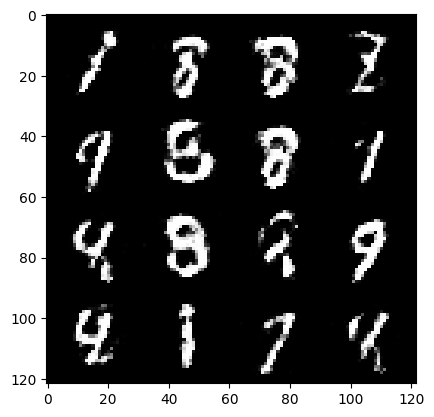

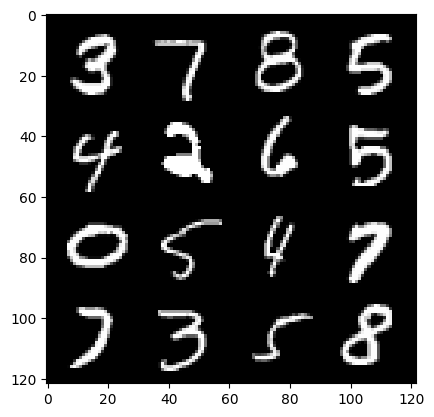

163: step 76500 / Gen loss: 2.129980540275574 / Disc loss: 0.29218128586808834


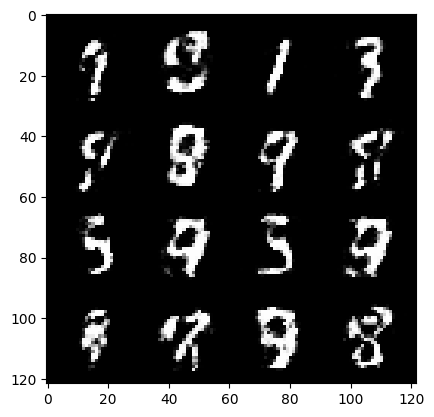

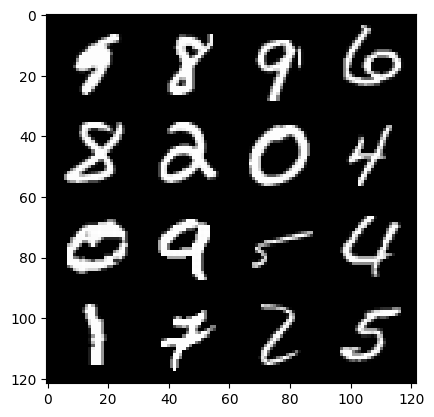

163: step 76800 / Gen loss: 2.069416433175405 / Disc loss: 0.3166202194988727


  0%|          | 0/469 [00:00<?, ?it/s]

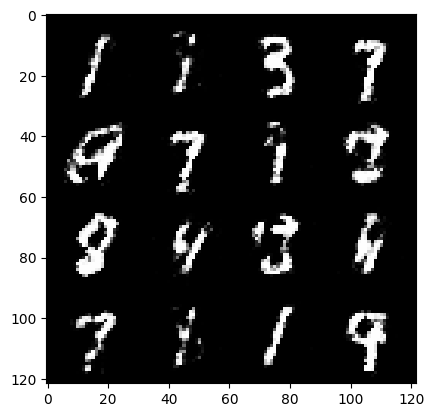

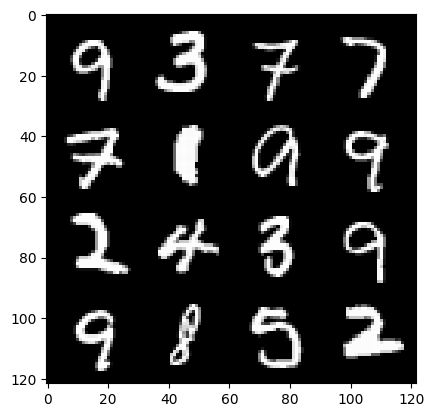

164: step 77100 / Gen loss: 1.9373958671093 / Disc loss: 0.3293381117781004


  0%|          | 0/469 [00:00<?, ?it/s]

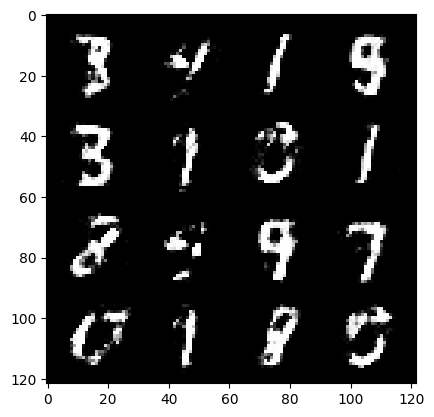

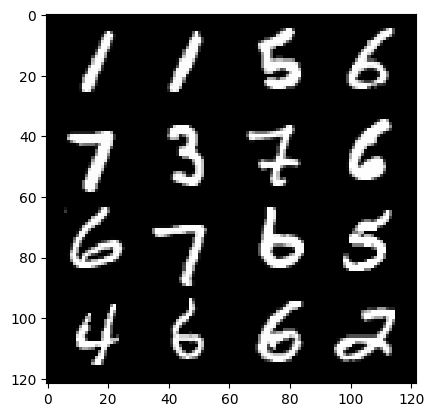

165: step 77400 / Gen loss: 1.884598341782888 / Disc loss: 0.3594701689481734


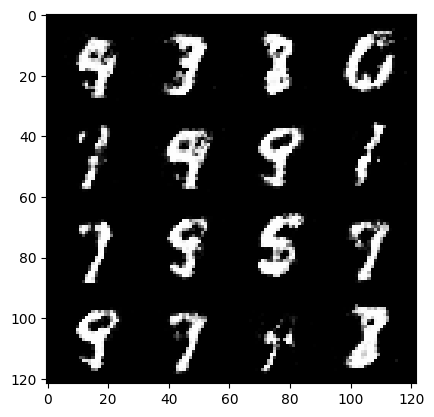

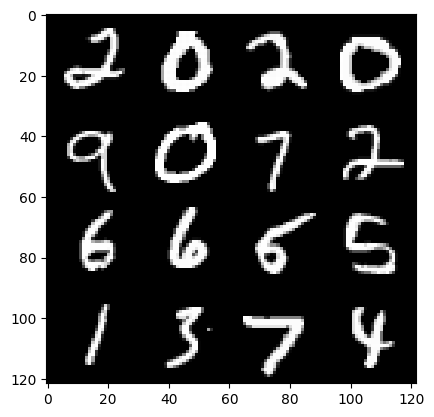

165: step 77700 / Gen loss: 1.9038958338896426 / Disc loss: 0.33970293730497353


  0%|          | 0/469 [00:00<?, ?it/s]

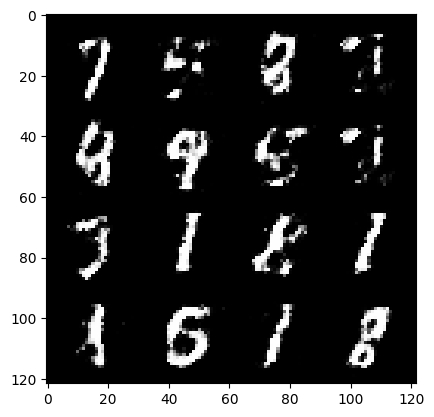

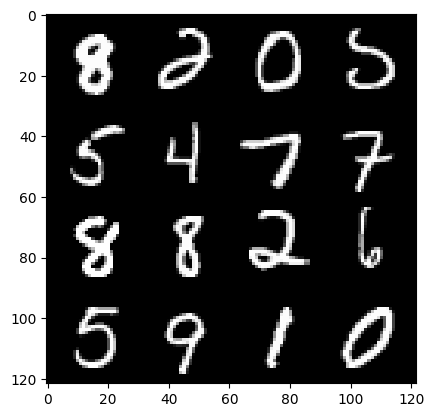

166: step 78000 / Gen loss: 2.0031998940308884 / Disc loss: 0.32459677189588554


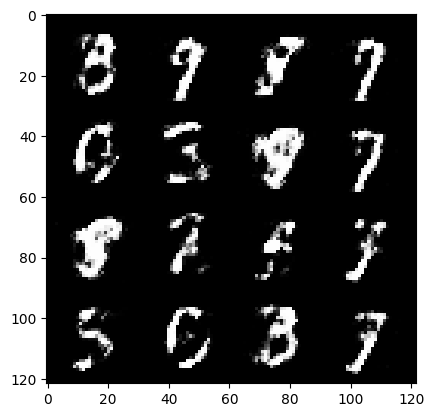

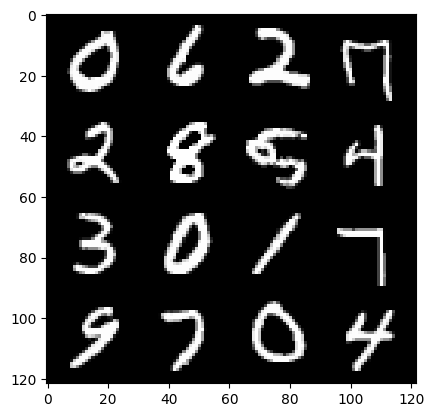

166: step 78300 / Gen loss: 1.9658507275581347 / Disc loss: 0.3292493527630966


  0%|          | 0/469 [00:00<?, ?it/s]

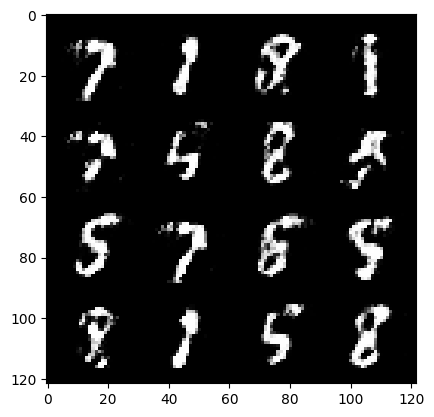

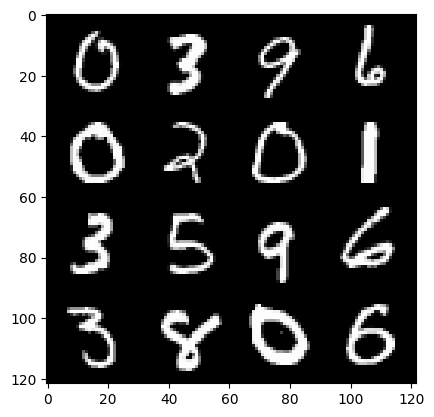

167: step 78600 / Gen loss: 1.9549613062540674 / Disc loss: 0.3463071305553119


  0%|          | 0/469 [00:00<?, ?it/s]

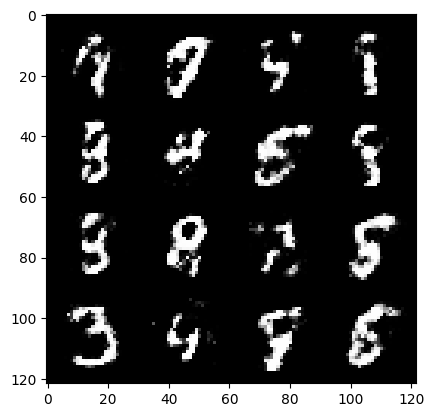

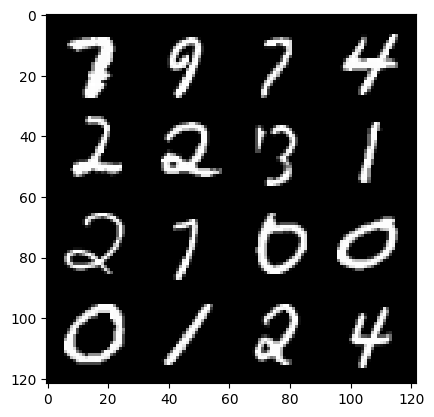

168: step 78900 / Gen loss: 1.8735509165128075 / Disc loss: 0.3543732735514642


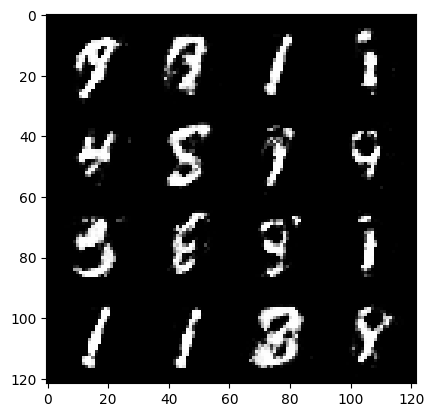

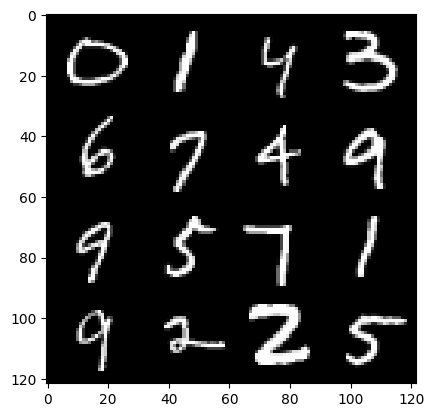

168: step 79200 / Gen loss: 1.993800609509151 / Disc loss: 0.32474995712439203


  0%|          | 0/469 [00:00<?, ?it/s]

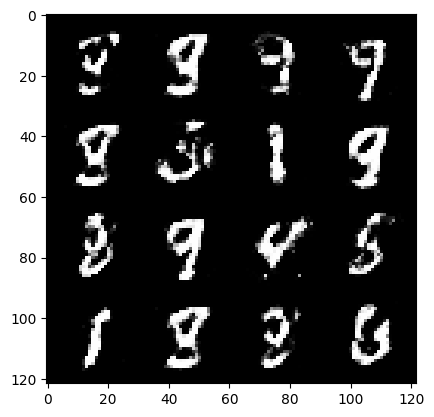

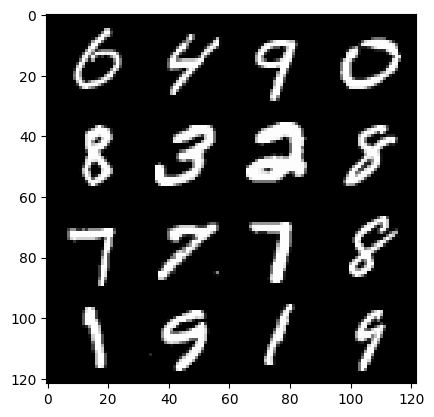

169: step 79500 / Gen loss: 1.9012285383542369 / Disc loss: 0.33576565821965504


  0%|          | 0/469 [00:00<?, ?it/s]

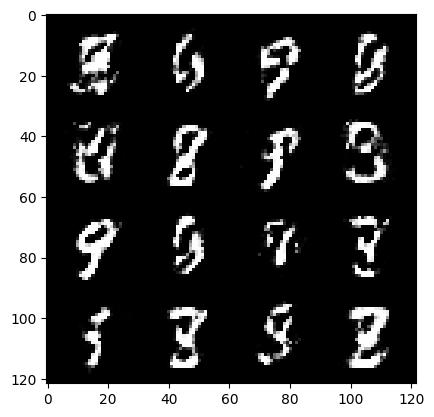

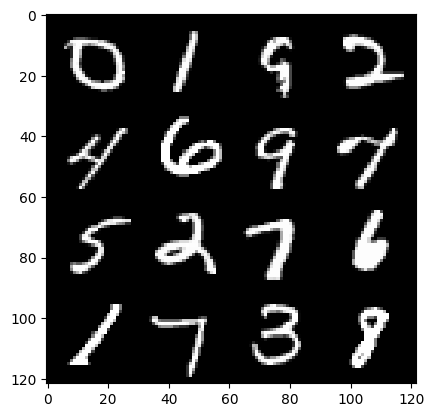

170: step 79800 / Gen loss: 1.9622754470507306 / Disc loss: 0.3296171148121355


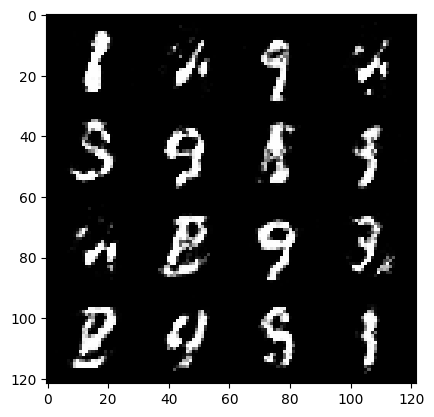

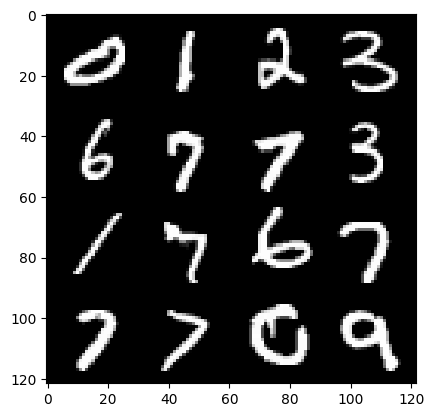

170: step 80100 / Gen loss: 2.0177394016583756 / Disc loss: 0.31983614126841214


  0%|          | 0/469 [00:00<?, ?it/s]

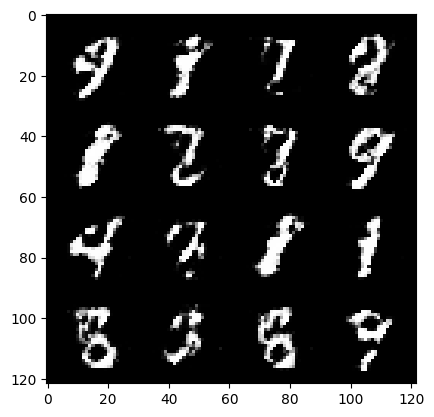

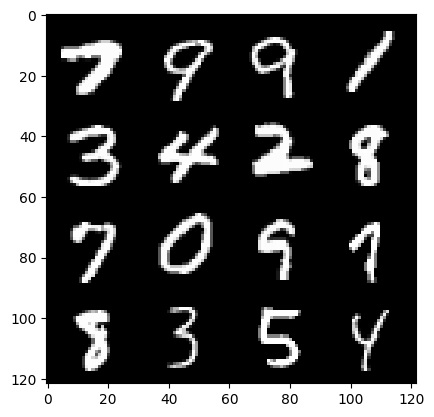

171: step 80400 / Gen loss: 2.0707416403293606 / Disc loss: 0.30189033885796857


  0%|          | 0/469 [00:00<?, ?it/s]

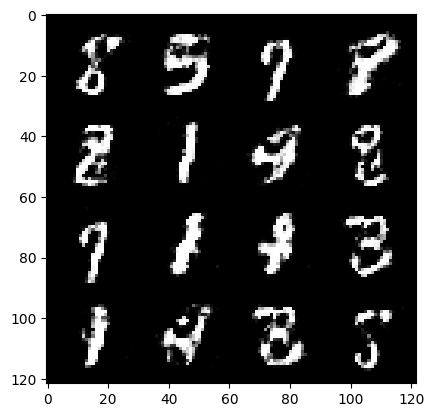

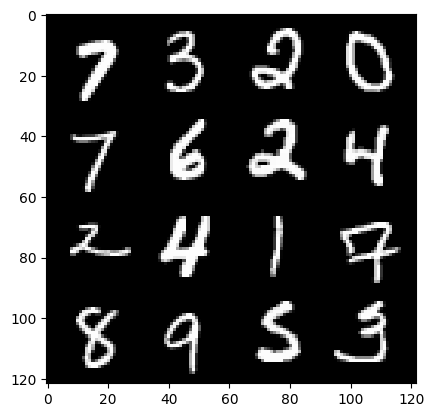

172: step 80700 / Gen loss: 1.9450688119729358 / Disc loss: 0.3346550537149114


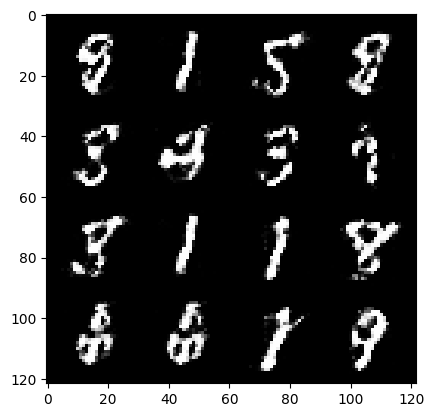

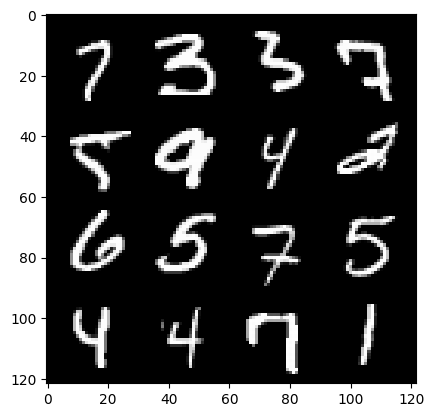

172: step 81000 / Gen loss: 1.9031549012660975 / Disc loss: 0.3331881681084635


  0%|          | 0/469 [00:00<?, ?it/s]

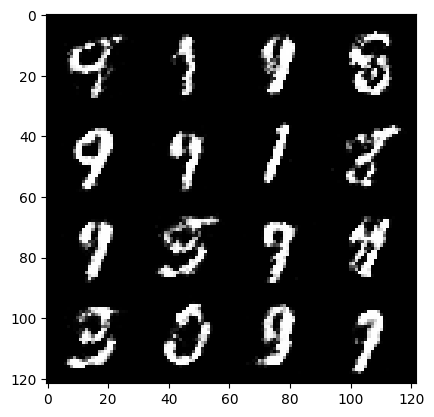

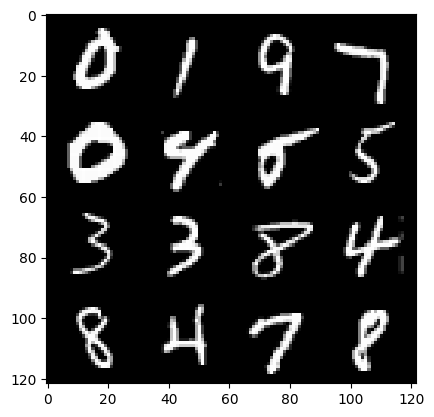

173: step 81300 / Gen loss: 2.039251254796981 / Disc loss: 0.31508380557099996


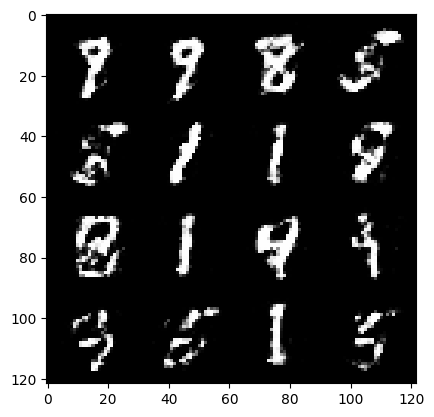

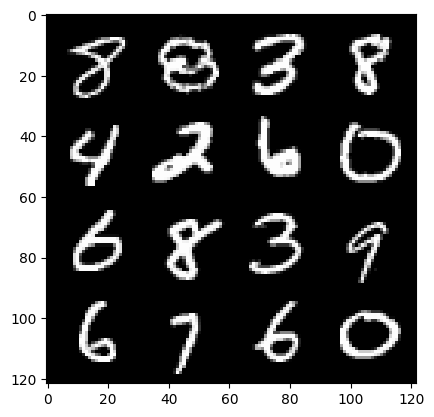

173: step 81600 / Gen loss: 1.939786338806153 / Disc loss: 0.33472573647896425


  0%|          | 0/469 [00:00<?, ?it/s]

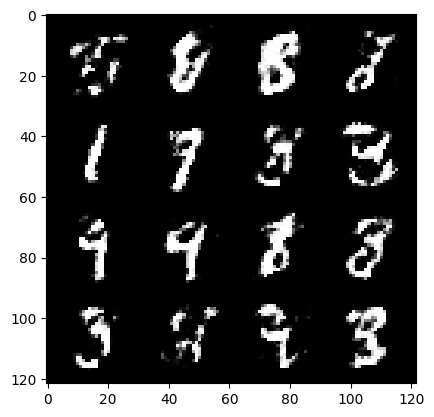

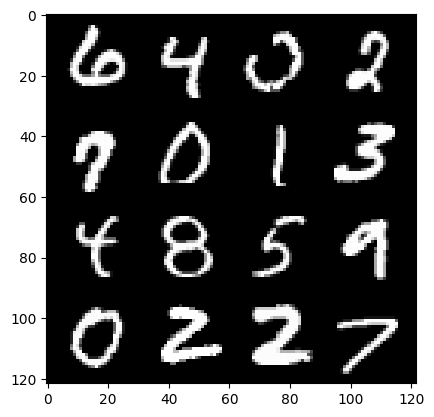

174: step 81900 / Gen loss: 1.904530231157939 / Disc loss: 0.3464288409550986


  0%|          | 0/469 [00:00<?, ?it/s]

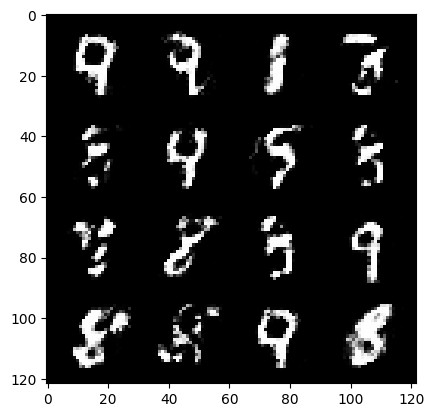

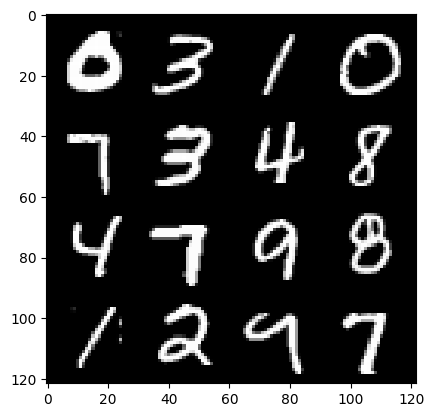

175: step 82200 / Gen loss: 1.849947024186451 / Disc loss: 0.3536833485960963


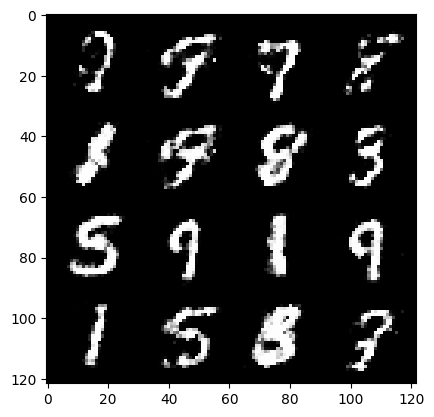

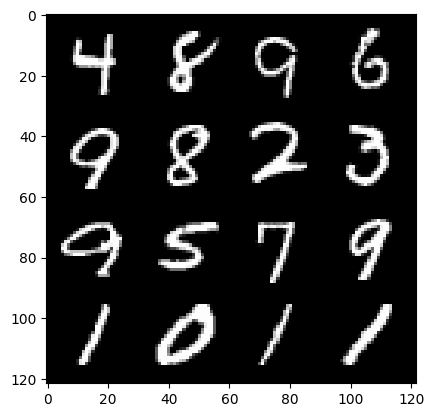

175: step 82500 / Gen loss: 1.7754675563176465 / Disc loss: 0.36404270668824507


  0%|          | 0/469 [00:00<?, ?it/s]

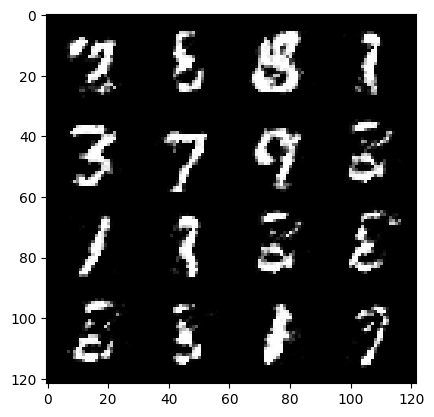

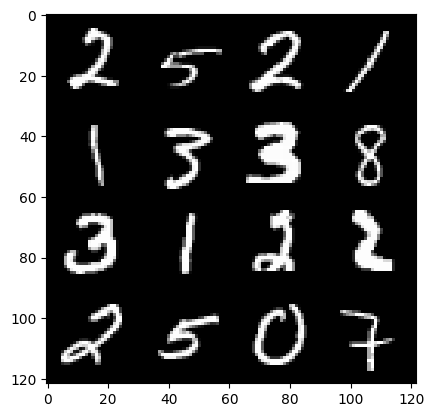

176: step 82800 / Gen loss: 1.7157114923000336 / Disc loss: 0.3856520566344261


  0%|          | 0/469 [00:00<?, ?it/s]

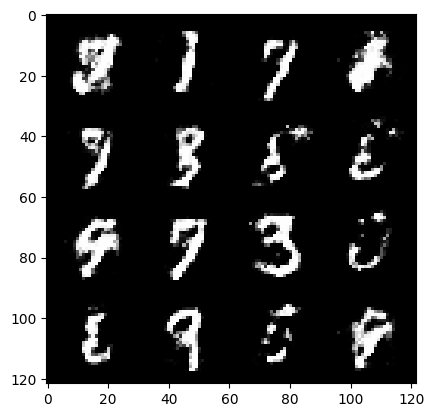

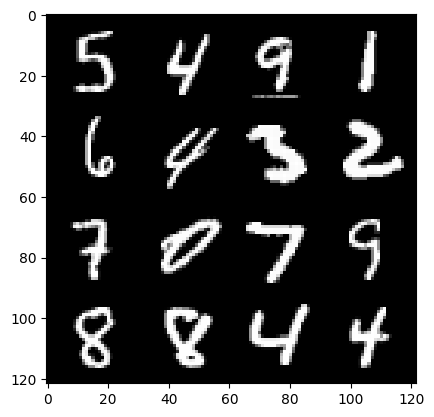

177: step 83100 / Gen loss: 1.7021769817670183 / Disc loss: 0.3743399838606514


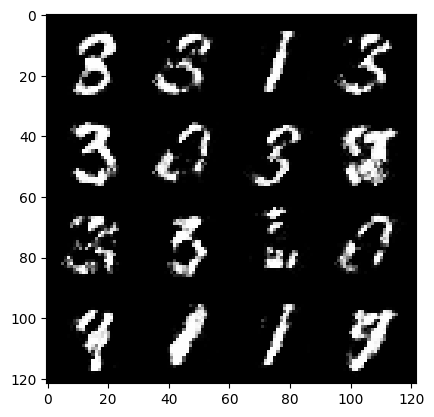

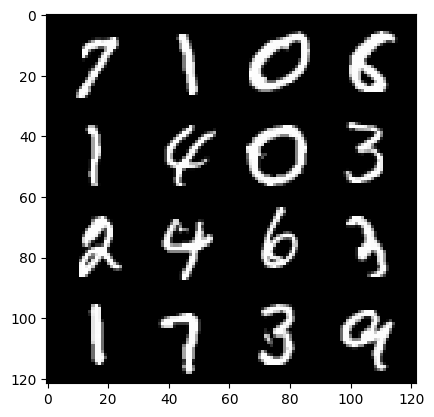

177: step 83400 / Gen loss: 1.6941773279507968 / Disc loss: 0.3774951233466468


  0%|          | 0/469 [00:00<?, ?it/s]

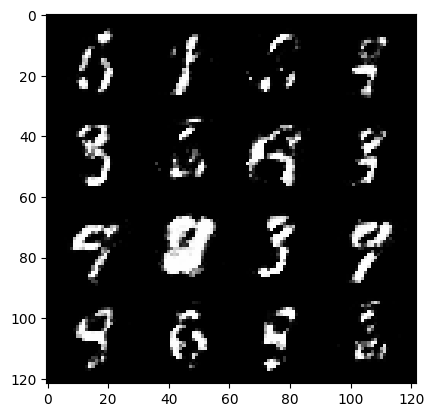

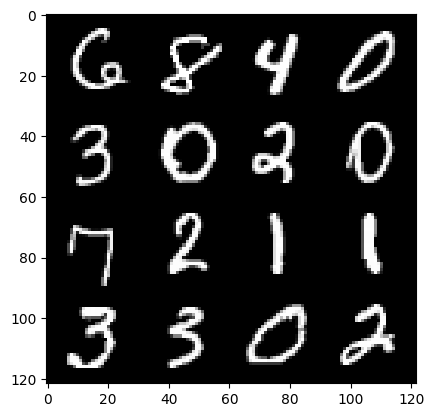

178: step 83700 / Gen loss: 1.6892731694380447 / Disc loss: 0.37869756157199513


  0%|          | 0/469 [00:00<?, ?it/s]

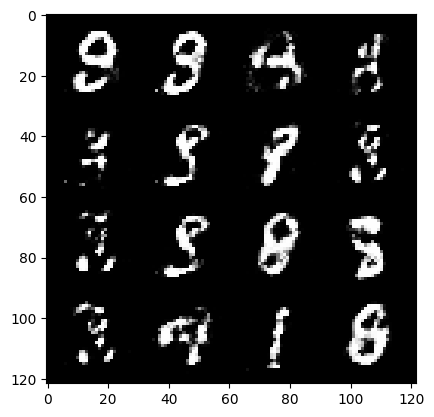

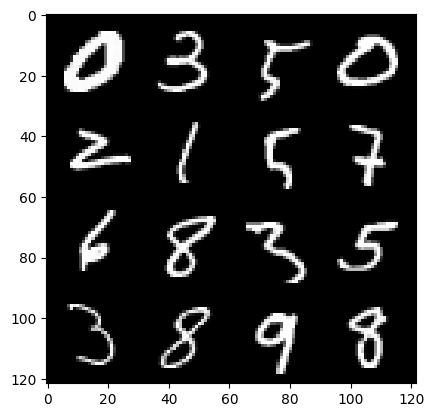

179: step 84000 / Gen loss: 1.6855669240156823 / Disc loss: 0.3716545470555624


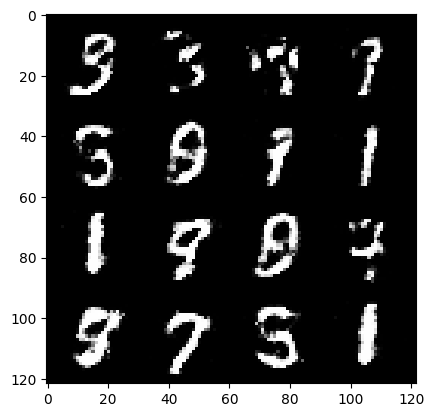

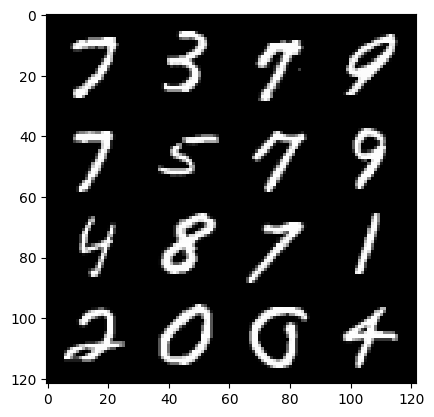

179: step 84300 / Gen loss: 1.8021707503000906 / Disc loss: 0.33671335751811654


  0%|          | 0/469 [00:00<?, ?it/s]

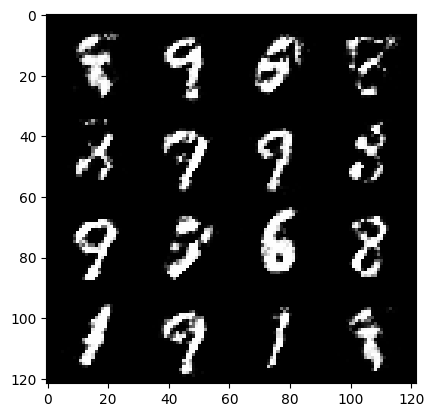

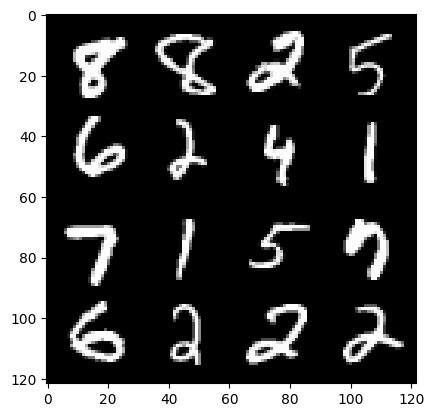

180: step 84600 / Gen loss: 1.8363471968968714 / Disc loss: 0.35890493541955953


  0%|          | 0/469 [00:00<?, ?it/s]

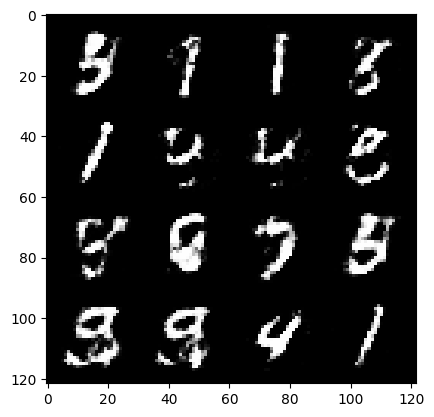

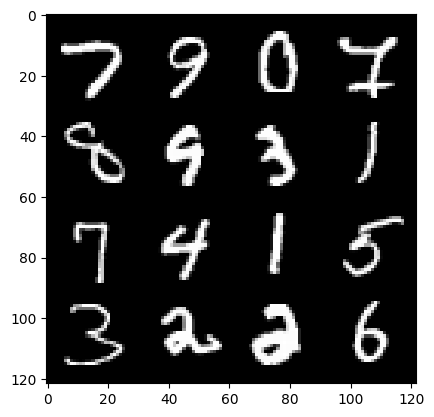

181: step 84900 / Gen loss: 1.7192732234795898 / Disc loss: 0.3745764458179473


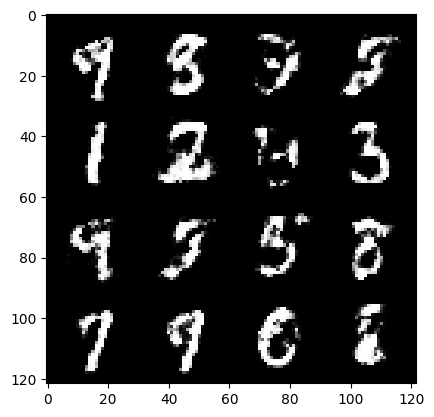

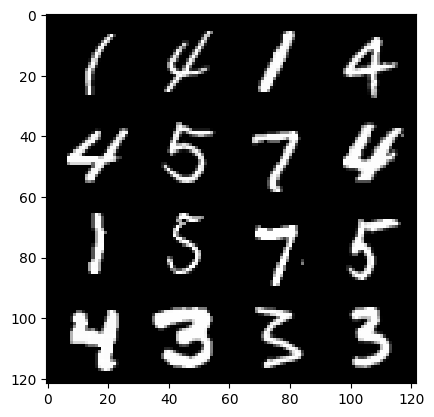

181: step 85200 / Gen loss: 1.7185617685318002 / Disc loss: 0.37882252261042587


  0%|          | 0/469 [00:00<?, ?it/s]

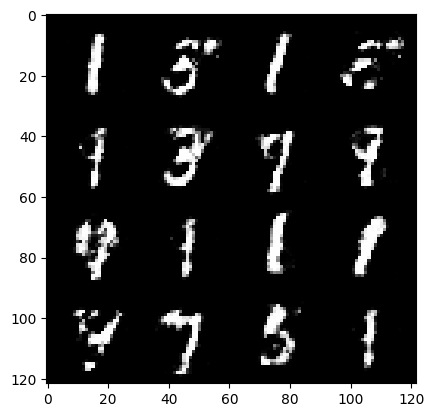

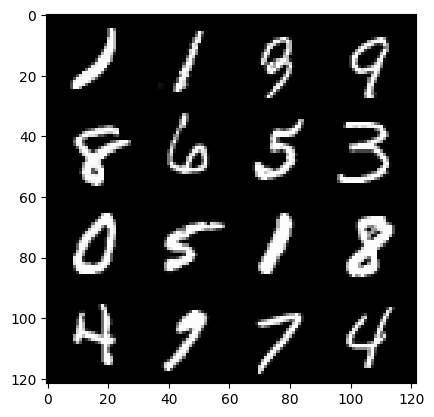

182: step 85500 / Gen loss: 1.6466546567281084 / Disc loss: 0.40817641993363685


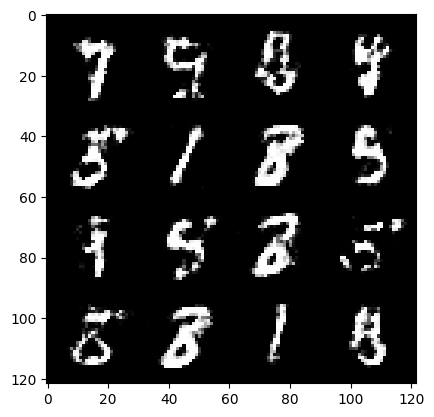

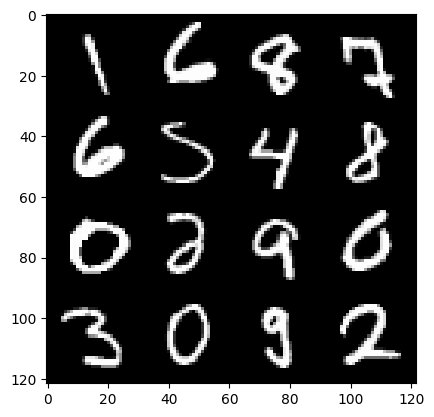

182: step 85800 / Gen loss: 1.6148568952083593 / Disc loss: 0.4196484075983364


  0%|          | 0/469 [00:00<?, ?it/s]

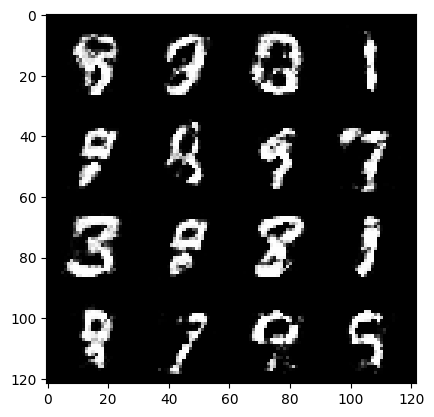

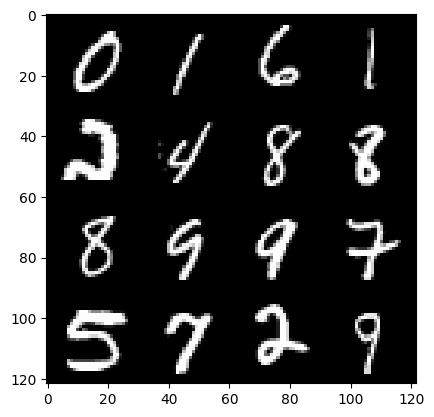

183: step 86100 / Gen loss: 1.7000450015068058 / Disc loss: 0.3795323912302651


  0%|          | 0/469 [00:00<?, ?it/s]

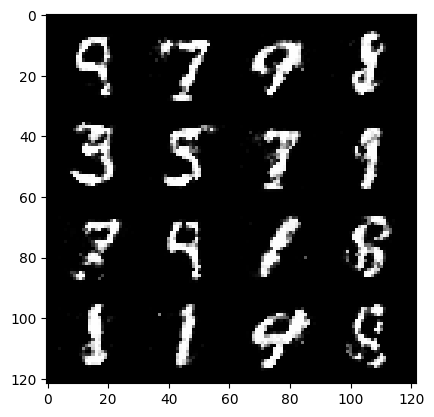

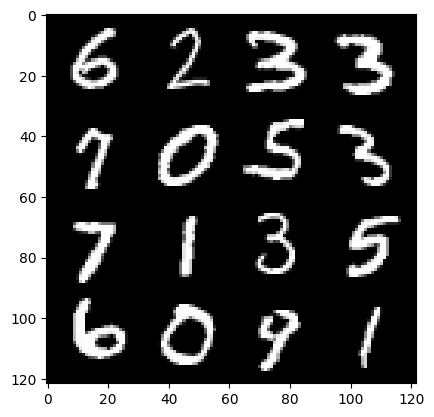

184: step 86400 / Gen loss: 1.694298889239629 / Disc loss: 0.3856128608187041


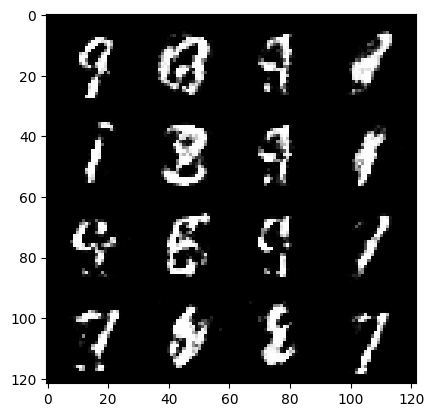

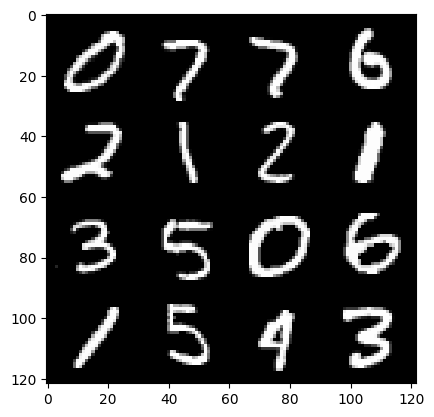

184: step 86700 / Gen loss: 1.706461590528489 / Disc loss: 0.376698452134927


  0%|          | 0/469 [00:00<?, ?it/s]

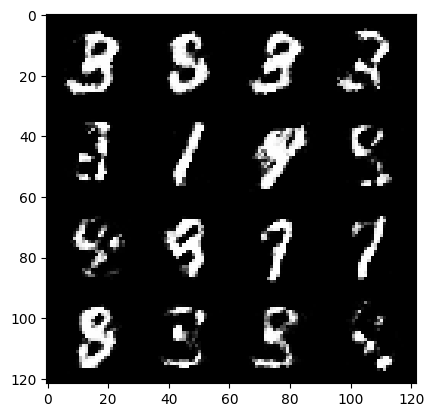

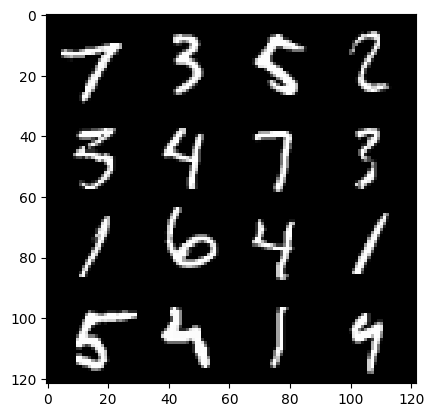

185: step 87000 / Gen loss: 1.7171702388922374 / Disc loss: 0.38298174937566104


  0%|          | 0/469 [00:00<?, ?it/s]

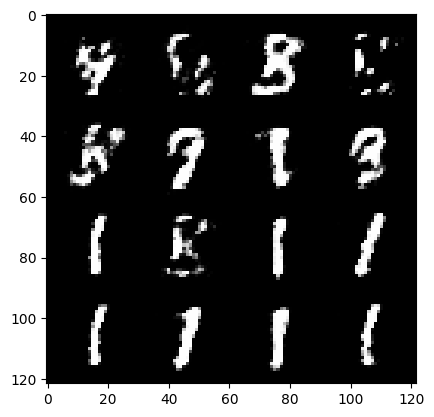

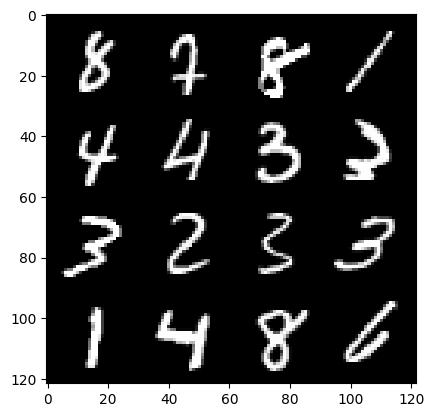

186: step 87300 / Gen loss: 1.6414877712726592 / Disc loss: 0.3965193759401641


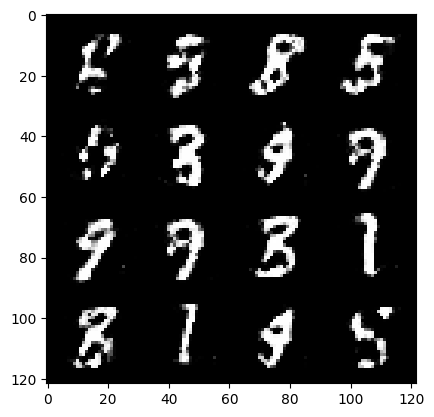

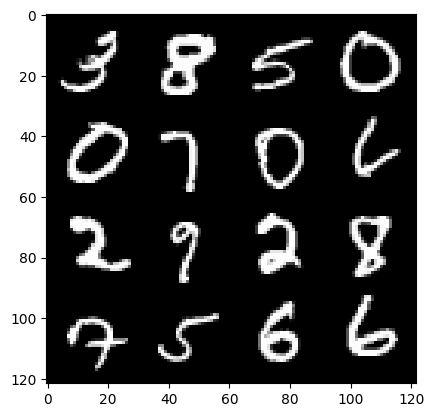

186: step 87600 / Gen loss: 1.677975853284201 / Disc loss: 0.38635752528905853


  0%|          | 0/469 [00:00<?, ?it/s]

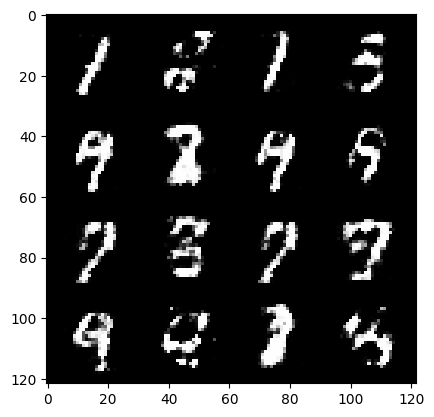

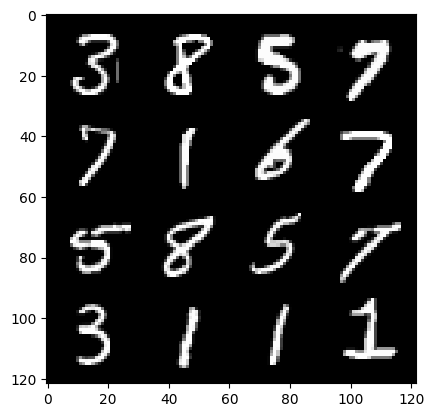

187: step 87900 / Gen loss: 1.539919921159745 / Disc loss: 0.43153945505619057


  0%|          | 0/469 [00:00<?, ?it/s]

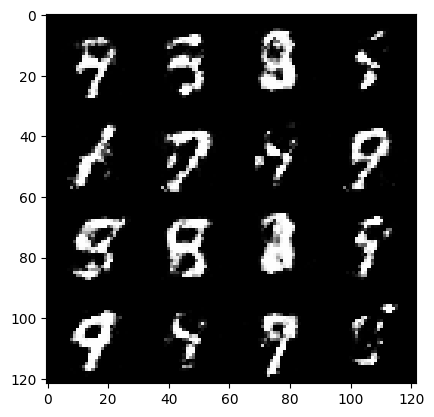

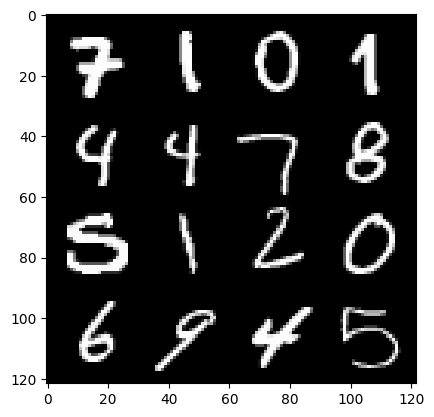

188: step 88200 / Gen loss: 1.5715172866980232 / Disc loss: 0.40575970997412986


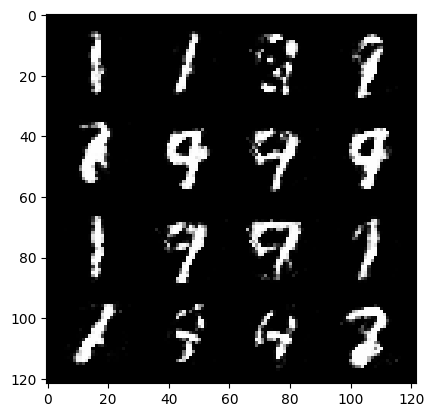

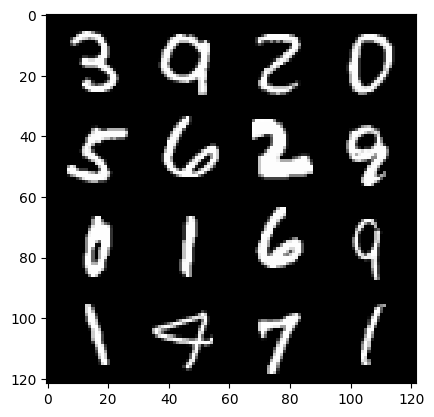

188: step 88500 / Gen loss: 1.5637470765908557 / Disc loss: 0.4054216689864793


  0%|          | 0/469 [00:00<?, ?it/s]

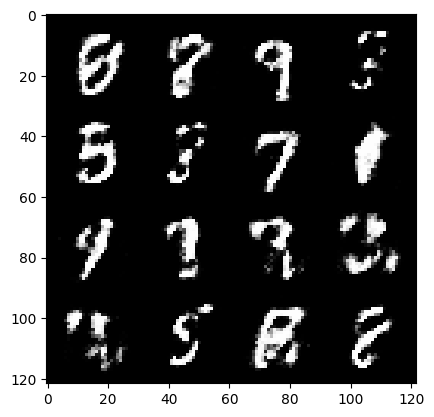

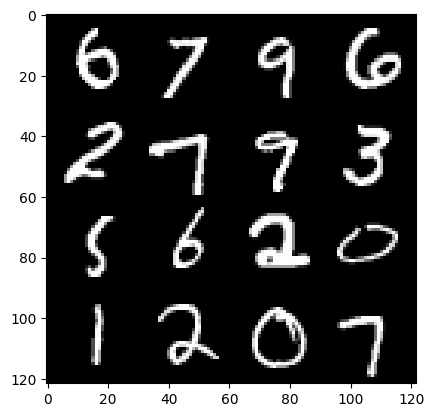

189: step 88800 / Gen loss: 1.5424549404780072 / Disc loss: 0.41367657214403164


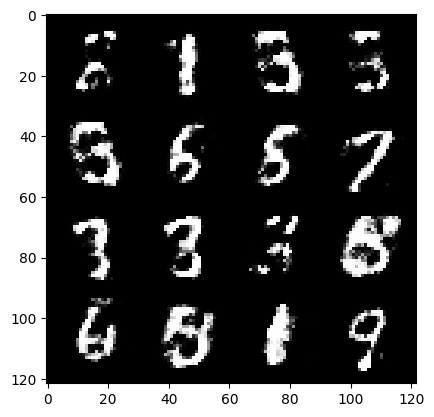

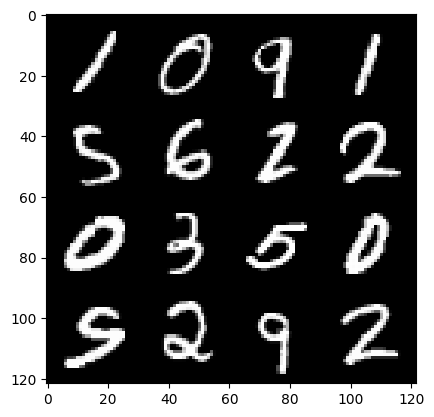

189: step 89100 / Gen loss: 1.4402104326089222 / Disc loss: 0.4497927043835321


  0%|          | 0/469 [00:00<?, ?it/s]

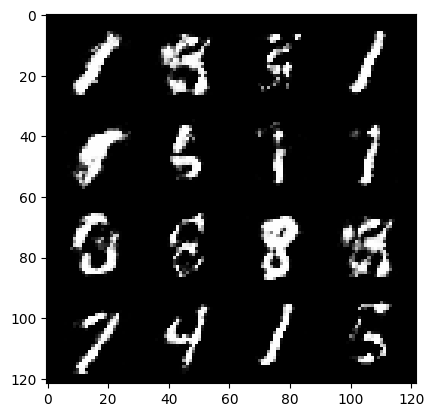

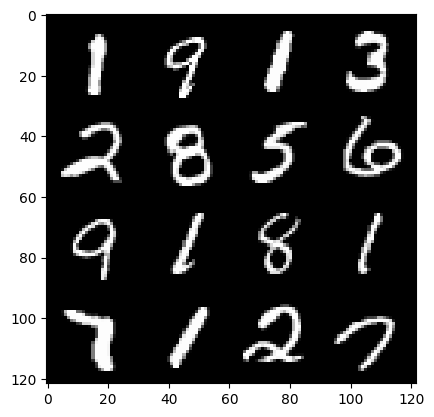

190: step 89400 / Gen loss: 1.513324057658514 / Disc loss: 0.41214778413375175


  0%|          | 0/469 [00:00<?, ?it/s]

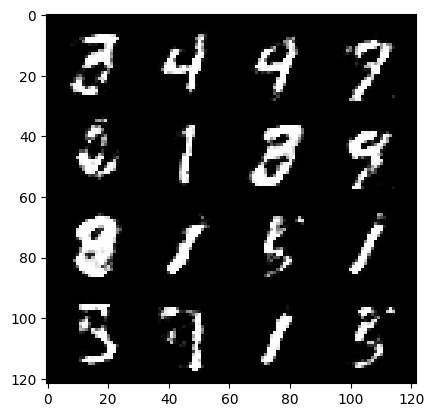

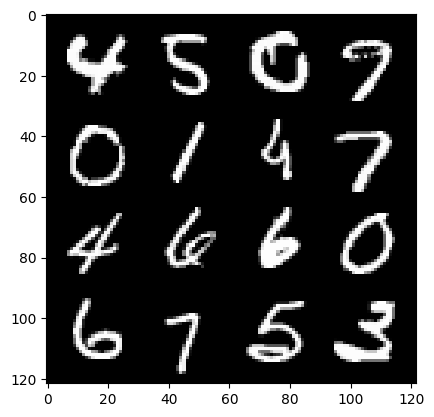

191: step 89700 / Gen loss: 1.4440612236658732 / Disc loss: 0.44083996435006484


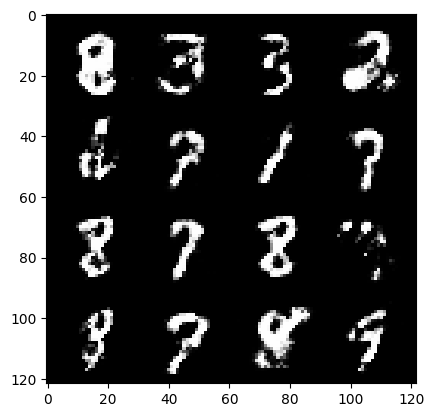

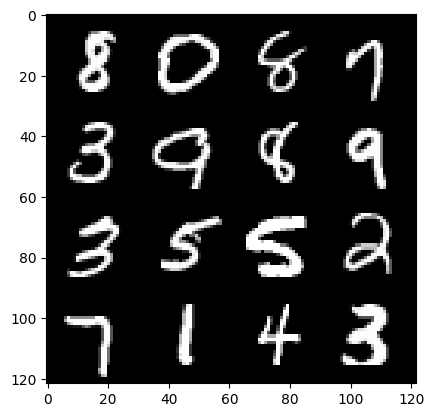

191: step 90000 / Gen loss: 1.4606993556022654 / Disc loss: 0.4233601806561148


  0%|          | 0/469 [00:00<?, ?it/s]

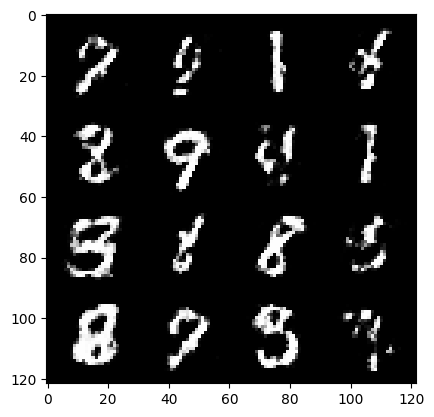

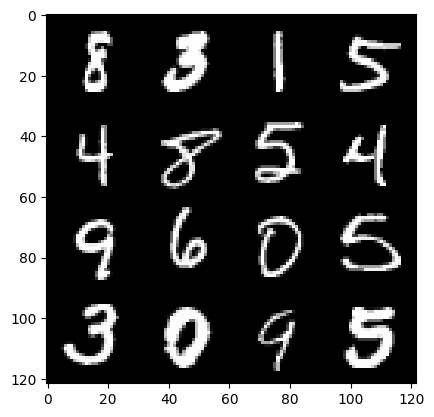

192: step 90300 / Gen loss: 1.473268530368805 / Disc loss: 0.42342427899440094


  0%|          | 0/469 [00:00<?, ?it/s]

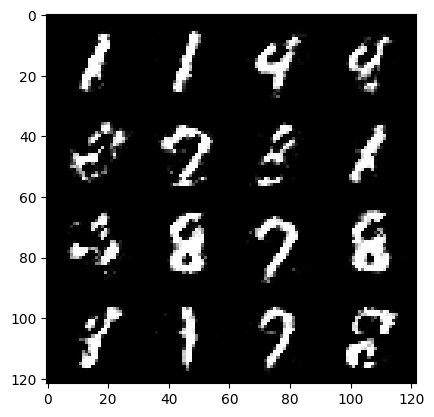

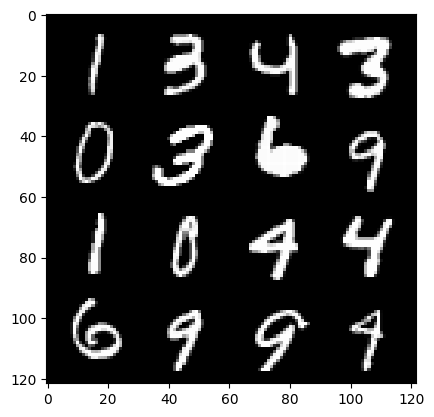

193: step 90600 / Gen loss: 1.4813000023365033 / Disc loss: 0.4270924577116967


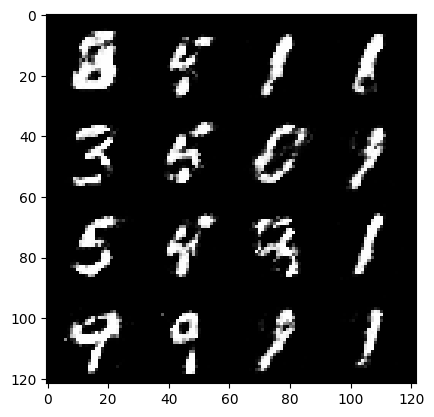

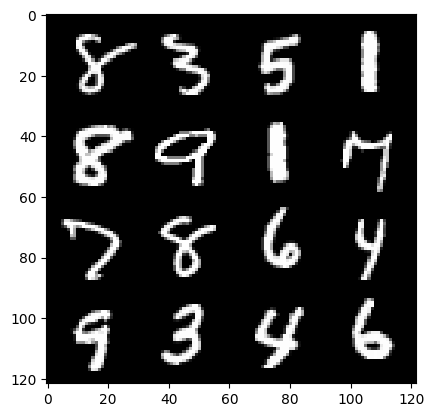

193: step 90900 / Gen loss: 1.5671617869536085 / Disc loss: 0.4107216210166615


  0%|          | 0/469 [00:00<?, ?it/s]

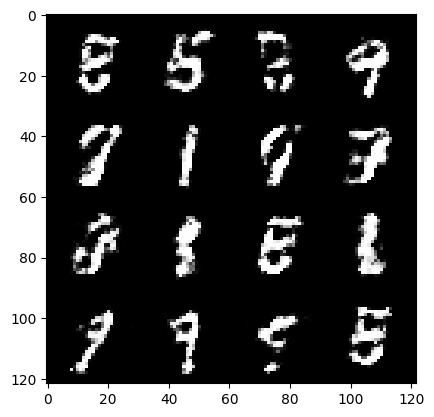

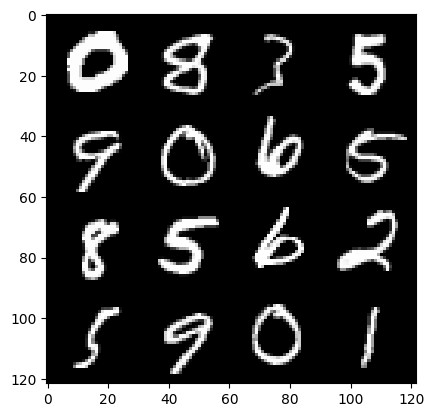

194: step 91200 / Gen loss: 1.499053565263748 / Disc loss: 0.43994489490985855


  0%|          | 0/469 [00:00<?, ?it/s]

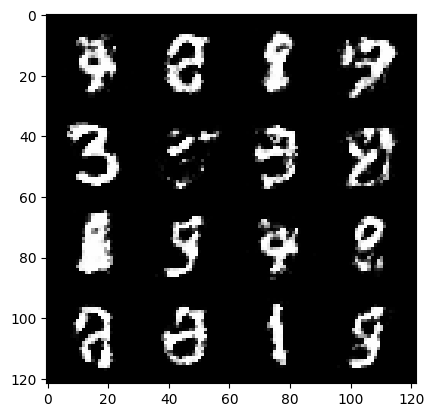

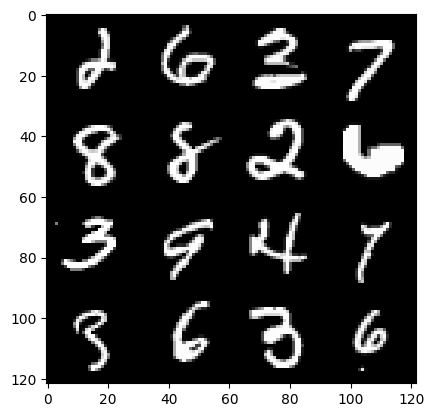

195: step 91500 / Gen loss: 1.3819751226902006 / Disc loss: 0.4741556068261466


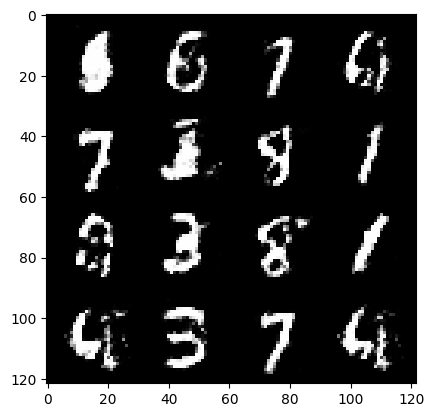

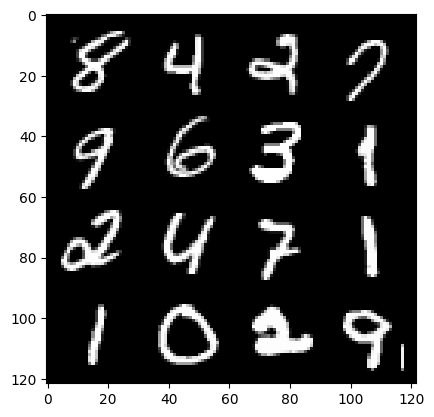

195: step 91800 / Gen loss: 1.4410079932212831 / Disc loss: 0.43917987565199507


  0%|          | 0/469 [00:00<?, ?it/s]

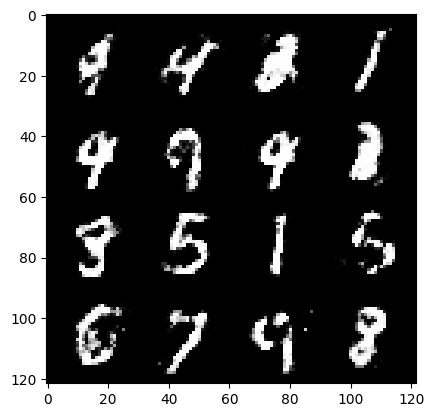

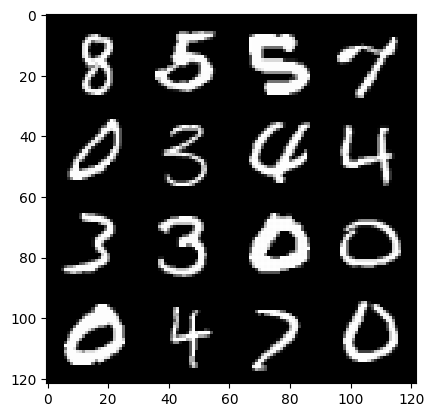

196: step 92100 / Gen loss: 1.4881260601679482 / Disc loss: 0.43331701586643845


  0%|          | 0/469 [00:00<?, ?it/s]

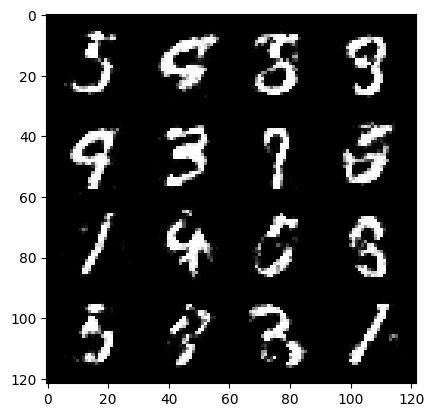

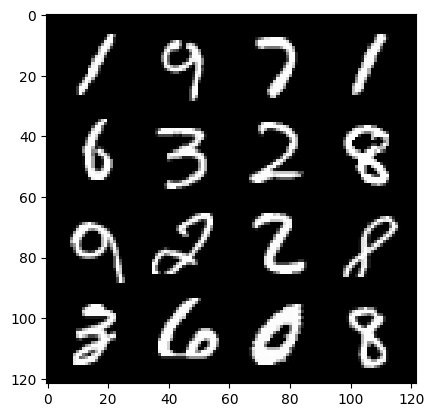

197: step 92400 / Gen loss: 1.4375602348645522 / Disc loss: 0.4385348665714264


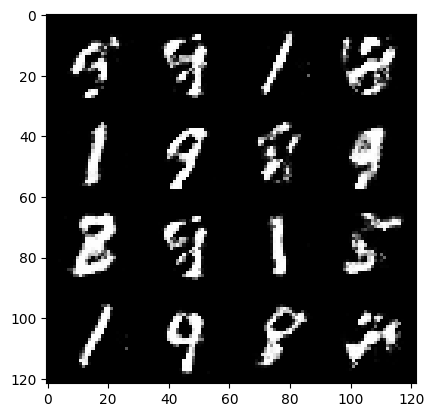

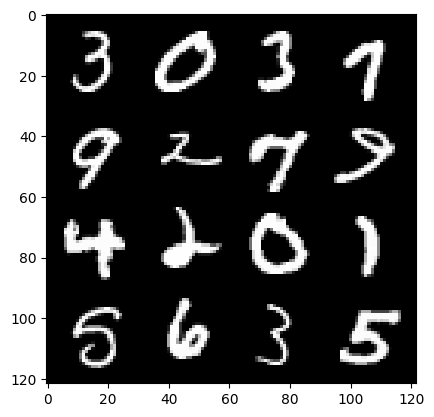

197: step 92700 / Gen loss: 1.4735436503092447 / Disc loss: 0.42359398365020756


  0%|          | 0/469 [00:00<?, ?it/s]

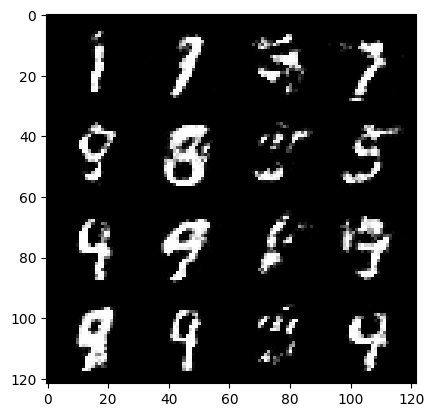

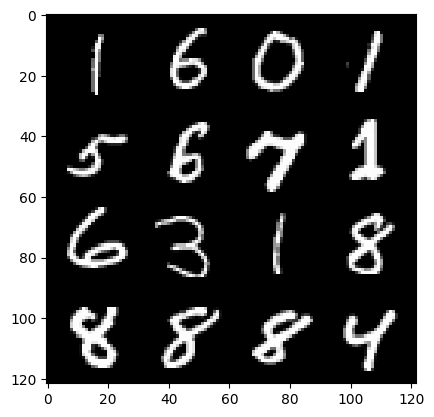

198: step 93000 / Gen loss: 1.423729158242543 / Disc loss: 0.4335080661376312


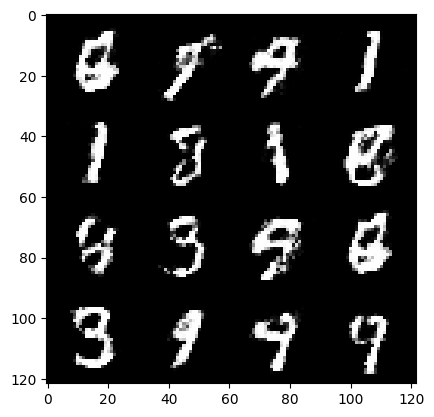

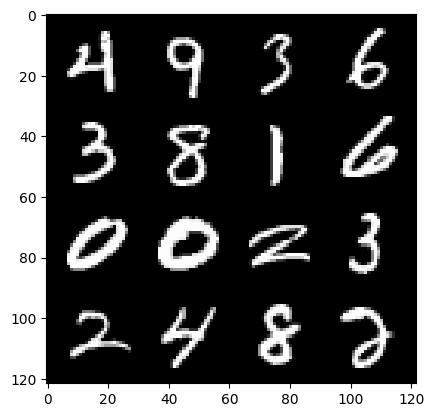

198: step 93300 / Gen loss: 1.4695185200373329 / Disc loss: 0.42547293990850443


  0%|          | 0/469 [00:00<?, ?it/s]

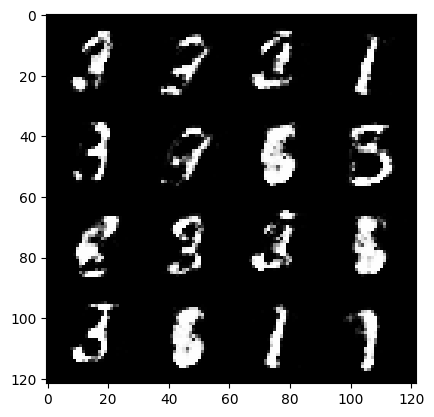

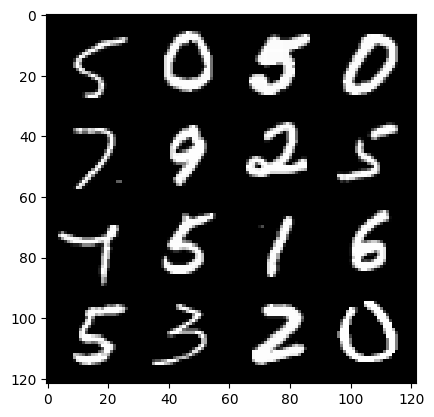

199: step 93600 / Gen loss: 1.5141934665044152 / Disc loss: 0.4080809026956554


  0%|          | 0/469 [00:00<?, ?it/s]

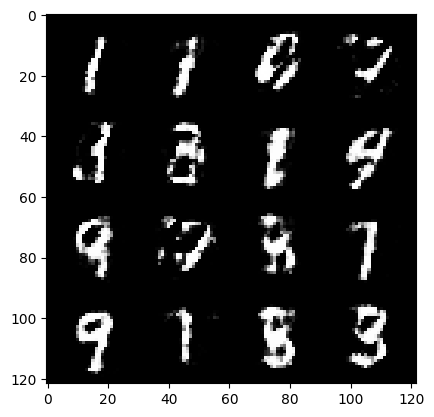

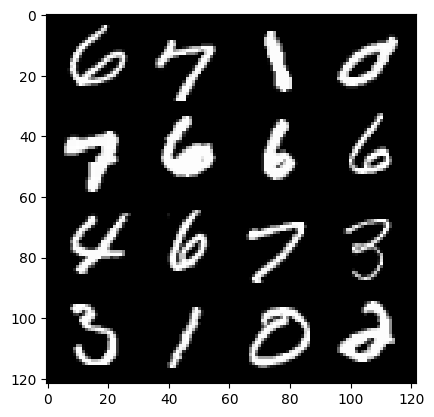

200: step 93900 / Gen loss: 1.5290903596083323 / Disc loss: 0.4074529103438059


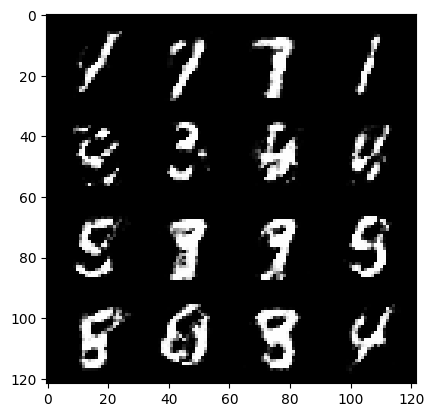

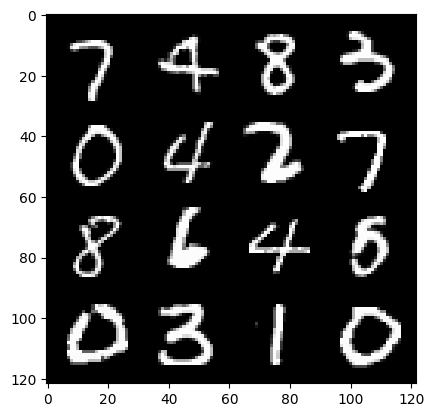

200: step 94200 / Gen loss: 1.4692775062719987 / Disc loss: 0.4202032249172531


  0%|          | 0/469 [00:00<?, ?it/s]

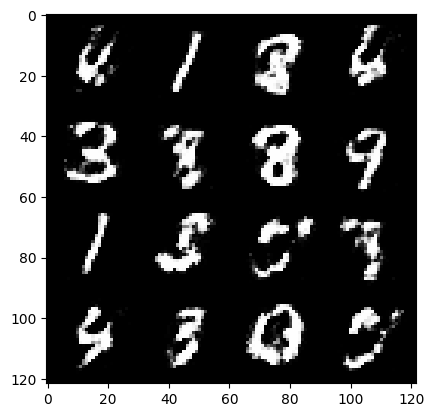

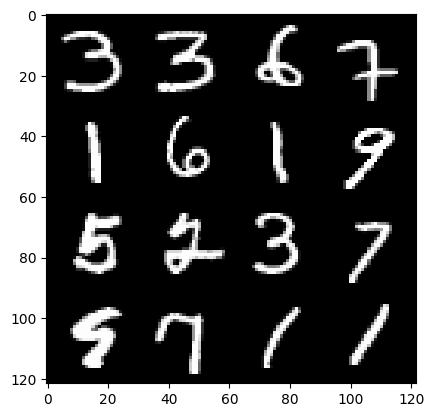

201: step 94500 / Gen loss: 1.4851626014709474 / Disc loss: 0.42111637930075324


  0%|          | 0/469 [00:00<?, ?it/s]

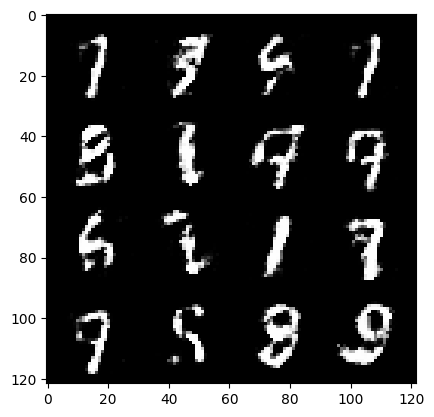

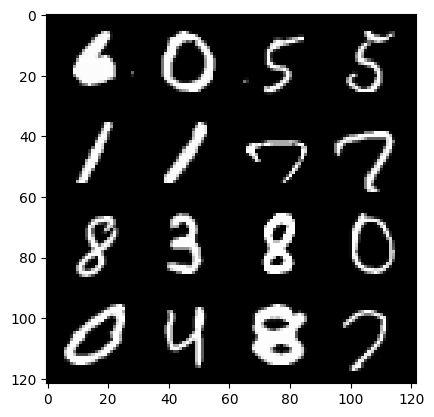

202: step 94800 / Gen loss: 1.5285196665922791 / Disc loss: 0.40350192646185534


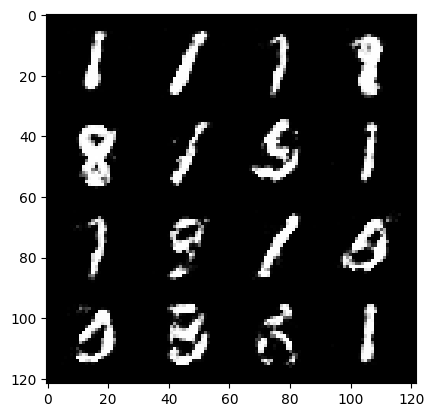

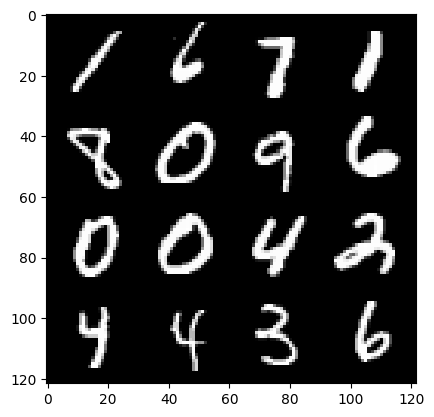

202: step 95100 / Gen loss: 1.5011029708385466 / Disc loss: 0.4222090653578441


  0%|          | 0/469 [00:00<?, ?it/s]

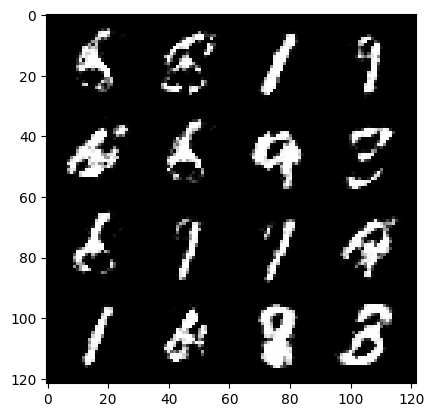

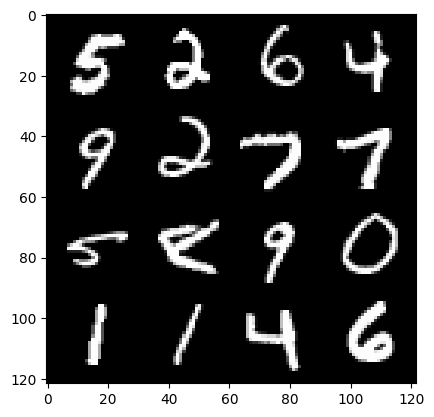

203: step 95400 / Gen loss: 1.3836800515651706 / Disc loss: 0.4550122851133345


KeyboardInterrupt: 

In [ ]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### Discriminator
    disc_opt.zero_grad()

    cur_bs = len(real)
    real = real.view(cur_bs, -1)
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)


    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### Generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()


    ###visualization and stats
    mean_disc_loss += disc_loss.item()/info_step
    mean_gen_loss += gen_loss.item()/info_step


    if cur_step % info_step == 0 and cur_step > 0:
      fake_noise= gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / Disc loss: {mean_disc_loss}")
      mean_gen_loss,mean_disc_loss = 0,0
    cur_step += 1